In [273]:
from PredFunctions import *

In [274]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [275]:
%autoreload 2

s - КНЦ  
m - Министерство

In [276]:
sensor = 's'
fill = '_fill'

# Данные за 4+ года КНЦ
dfAll = pd.read_csv(f"../data/pm25_{sensor}{fill}.csv", sep = ';', index_col = ['Date'], parse_dates = ['Date'])
dfAll

,Академгородок,Дрокино,Кировский,КрАЗ,"Ленина, 41",Минино,о. Молокова,Николаевка,Овинный-Таймыр,"Партизана, 3г",...,Свердловский,о. Татышев,"Телевизорная, 1/31",Удачный,Ветлужанка,Mean,Караульная,"Качинская, 56А",Посадный,Руслов
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-01,5.09,252.51,NaN,NaN,234.87,197.01,NaN,281.51,212.19,NaN,...,NaN,NaN,NaN,7.89,276.29,220.90,NaN,NaN,NaN,NaN
2019-01-02,4.49,148.05,NaN,NaN,69.94,83.78,NaN,139.63,81.81,NaN,...,NaN,NaN,NaN,10.69,128.53,103.47,NaN,NaN,NaN,NaN
2019-01-03,3.85,97.78,NaN,NaN,6.82,53.16,NaN,30.27,12.28,NaN,...,NaN,NaN,NaN,7.12,12.32,20.83,NaN,NaN,NaN,NaN
2019-01-04,8.80,145.74,NaN,NaN,118.58,121.09,NaN,160.94,118.75,NaN,...,NaN,NaN,NaN,14.14,190.32,133.90,NaN,NaN,NaN,NaN
2019-01-05,7.83,144.27,NaN,NaN,129.13,115.09,NaN,135.39,119.38,NaN,...,NaN,NaN,NaN,11.13,129.95,119.58,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-15,9.39,7.71,8.97,12.63,10.77,24.46,8.60,21.81,1.99,12.07,...,10.06,9.12,9.01,9.90,7.82,14.34,10.84,12.71,6.20,7.99
2024-03-16,5.77,7.71,7.12,8.28,6.27,20.46,6.19,14.78,1.99,6.71,...,6.59,5.69,5.94,6.88,5.74,9.70,9.43,9.51,0.61,6.21
2024-03-17,3.74,7.71,2.70,4.61,4.53,13.18,3.46,12.21,1.99,5.74,...,3.98,3.93,3.42,4.92,2.63,6.57,3.32,6.63,2.21,3.93


In [277]:
district = 'Mean'
df = dfAll[district]

### Зима 1

In [278]:
period = [f'2022-01-{i}' for i in range(20, 23)]
period

['2022-01-20', '2022-01-21', '2022-01-22']

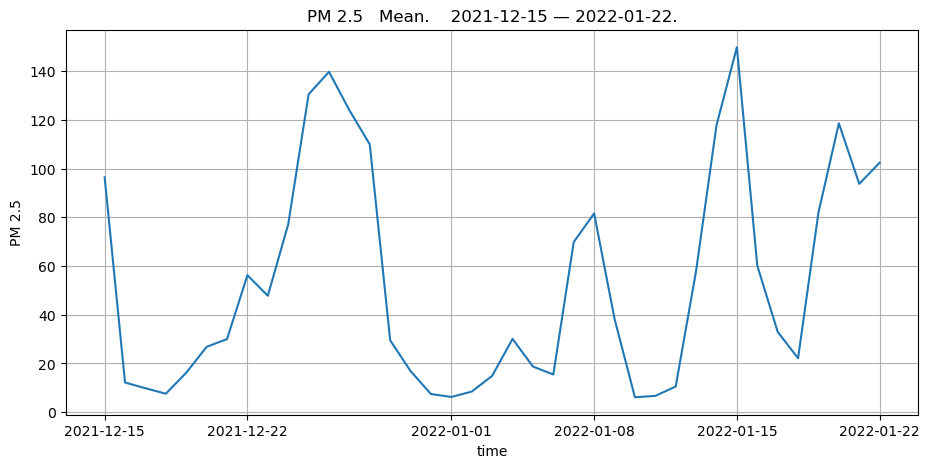

In [279]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2021-12-15", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

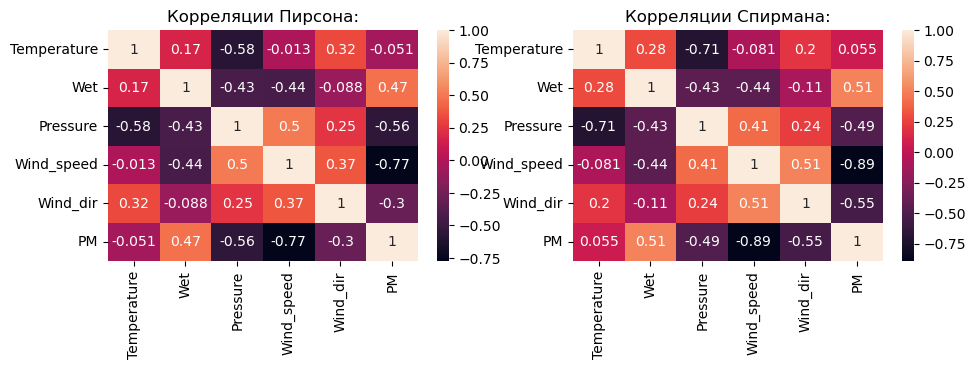

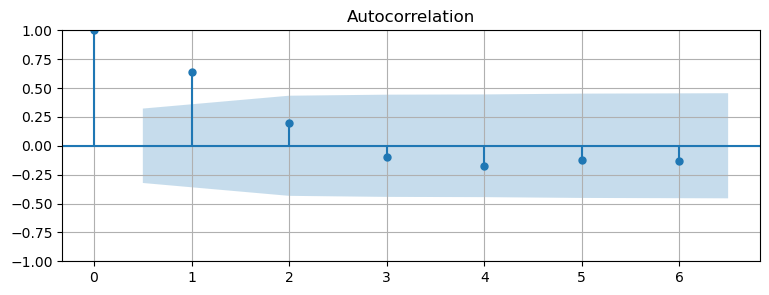

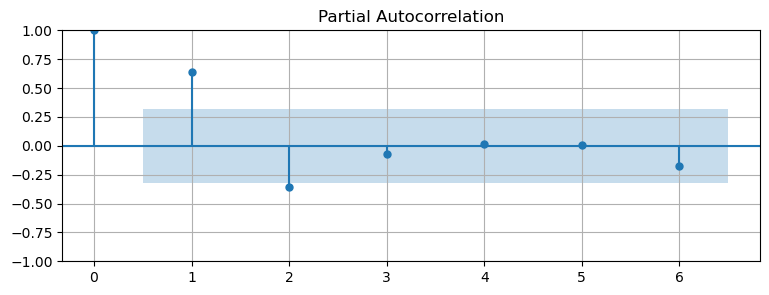

In [280]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-17.1845,5.116,-3.359,0.001,-27.212,-7.157
x2,1.1761,0.118,9.995,0.000,0.945,1.407
x3,0.0142,0.049,0.287,0.774,-0.083,0.111
ar.L1,0.5432,0.381,1.425,0.154,-0.204,1.290
ar.L2,0.1518,0.382,0.397,0.691,-0.598,0.902
ar.L3,-0.1942,0.317,-0.612,0.540,-0.816,0.427
ma.L1,-0.1581,15.552,-0.010,0.992,-30.639,30.323
ma.L2,-0.8402,13.023,-0.065,0.949,-26.366,24.685
sigma2,446.1581,6968.566,0.064,0.949,-1.32e+04,1.41e+04


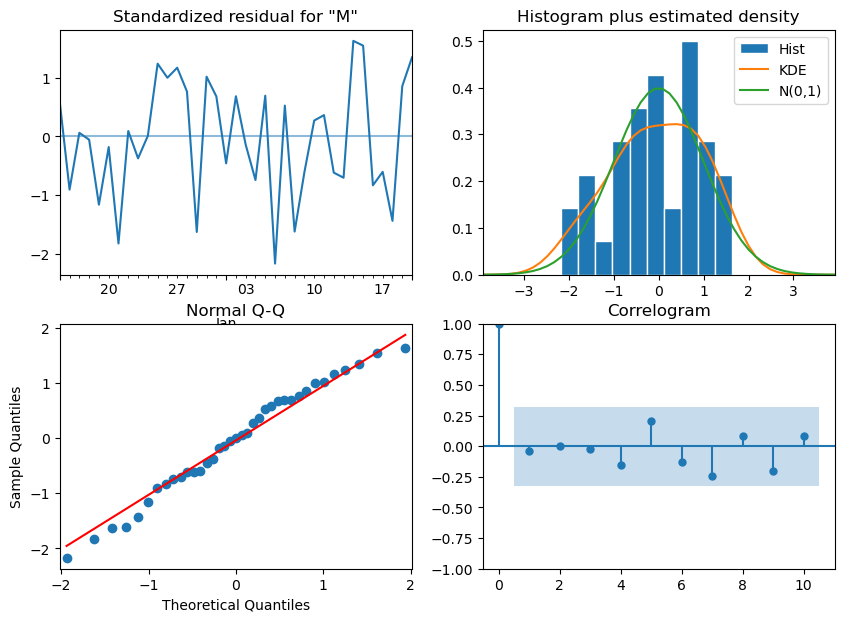

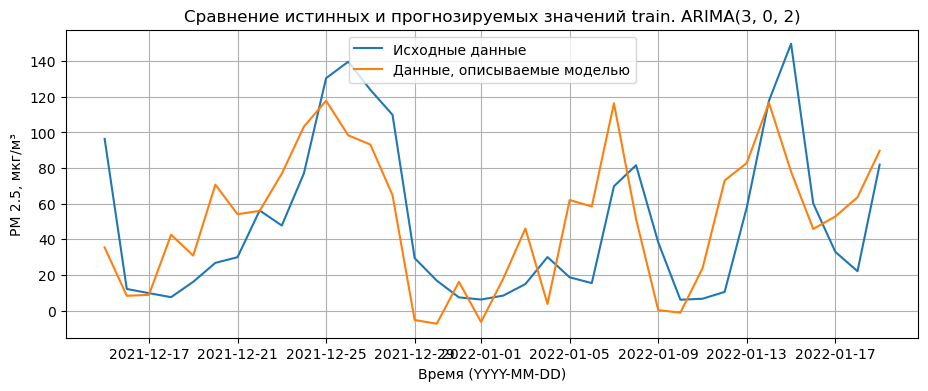

,Значение
MSE,1070.59
MAE,27.38
MAPE,1.15
$R^2$,0.43


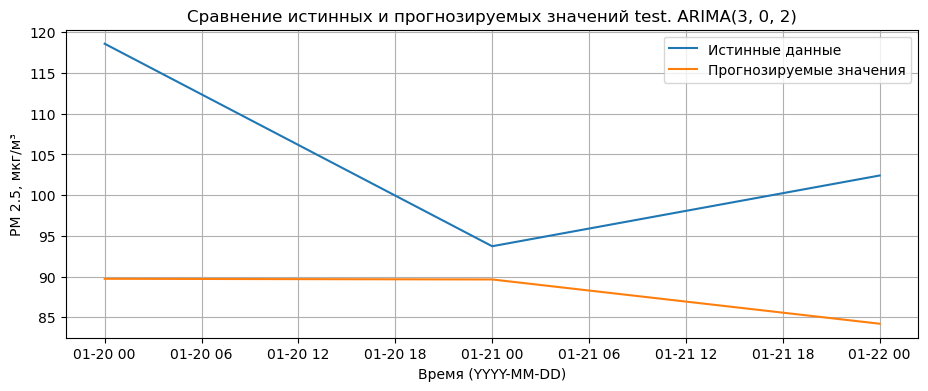

,Значение
MSE,393.11
MAE,17.04
MAPE,0.15
$R^2$,-2.71


In [286]:
forecast.getModel(p = 3, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Wet', 'Wind_dir'], use_optimal = False, save = False)

### 2

In [287]:
period = [f'2022-12-{i}' for i in range(20, 23)]
period

['2022-12-20', '2022-12-21', '2022-12-22']

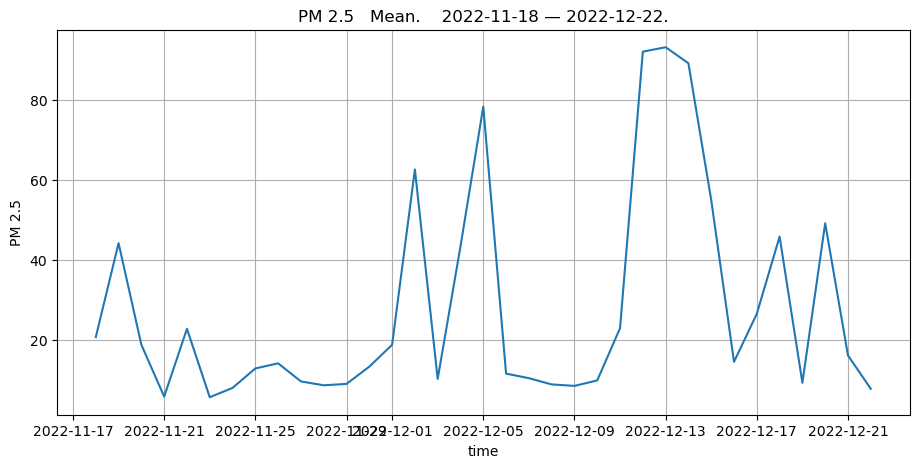

In [288]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-11-18", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

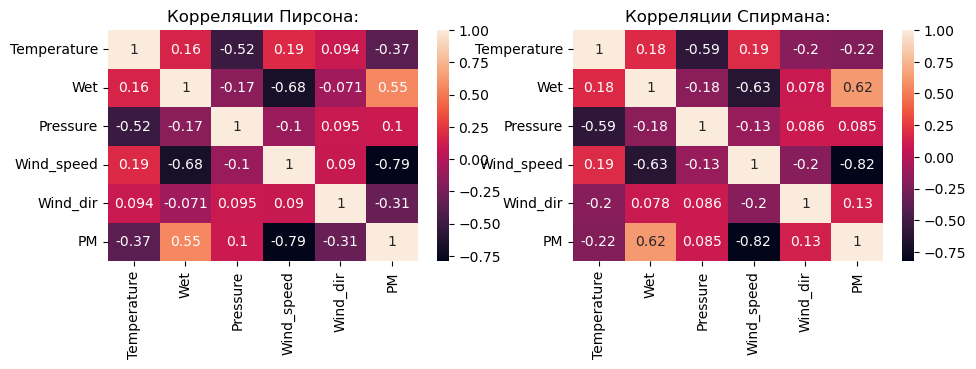

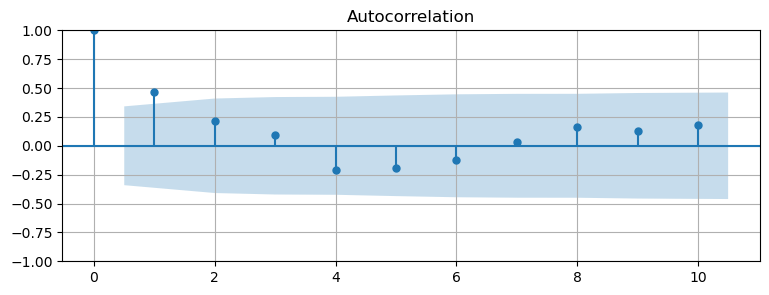

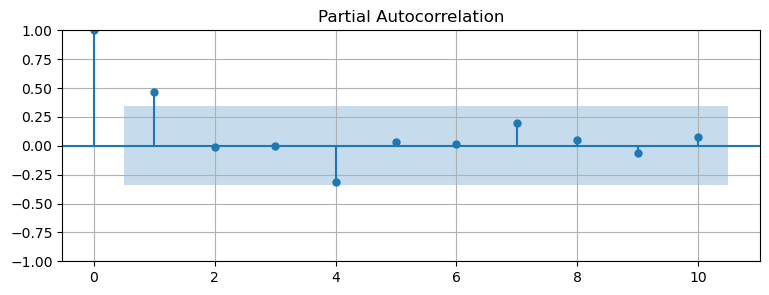

In [289]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,0.4387,0.150,2.918,0.004,0.144,0.733
x2,-10.4392,1.820,-5.735,0.000,-14.007,-6.872
x3,-1.8926,0.460,-4.113,0.000,-2.794,-0.991
ar.L1,1.0065,3.162,0.318,0.750,-5.191,7.204
ar.L2,-0.1818,2.054,-0.088,0.929,-4.207,3.844
ma.L1,-0.5881,3.143,-0.187,0.852,-6.748,5.572
ma.L2,-0.0228,0.855,-0.027,0.979,-1.699,1.653
sigma2,182.8275,65.065,2.810,0.005,55.303,310.352


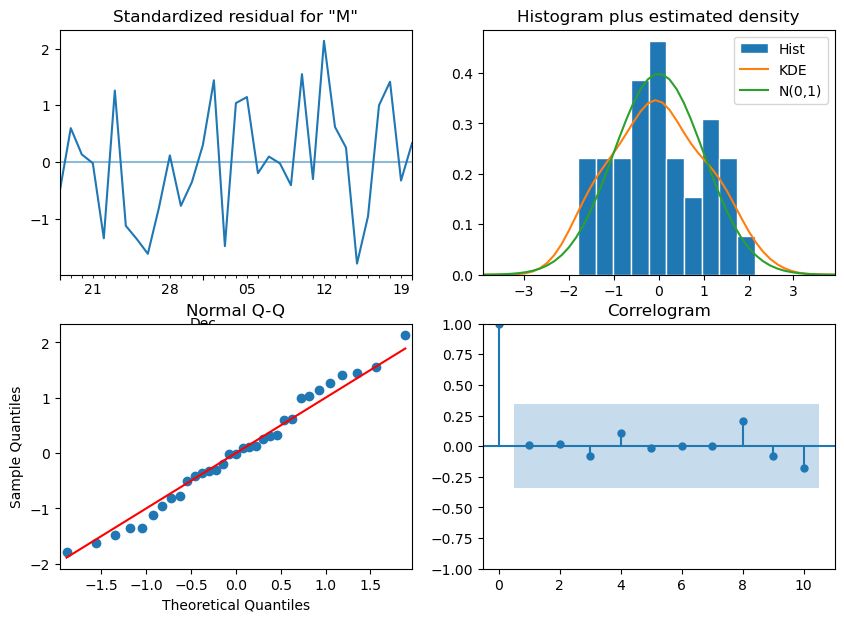

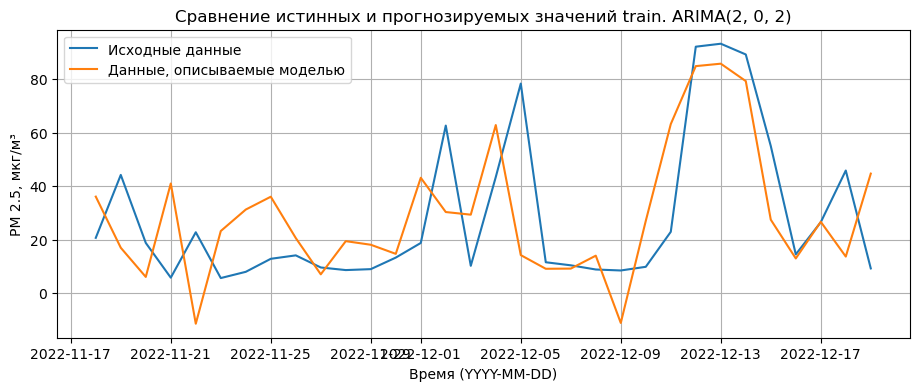

,Значение
MSE,538.30
MAE,18.28
MAPE,1.17
$R^2$,0.26


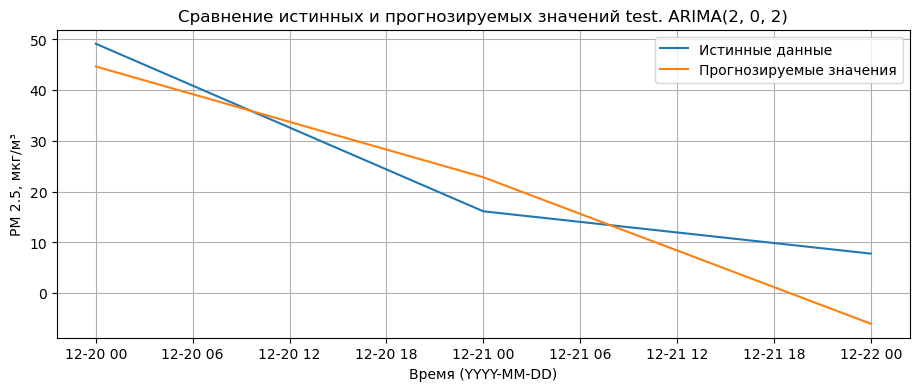

,Значение
MSE,85.40
MAE,8.34
MAPE,0.76
$R^2$,0.73


In [292]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wet', 'Wind_speed', 'Temperature'], use_optimal = False, save = False)

### 3

In [293]:
period = [f'2023-02-{i}' for i in range(20, 23)]
period

['2023-02-20', '2023-02-21', '2023-02-22']

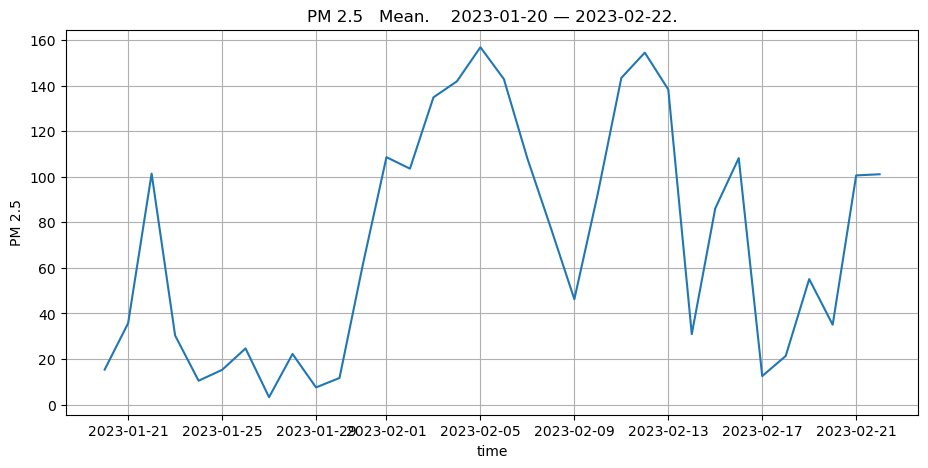

In [294]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-01-20", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

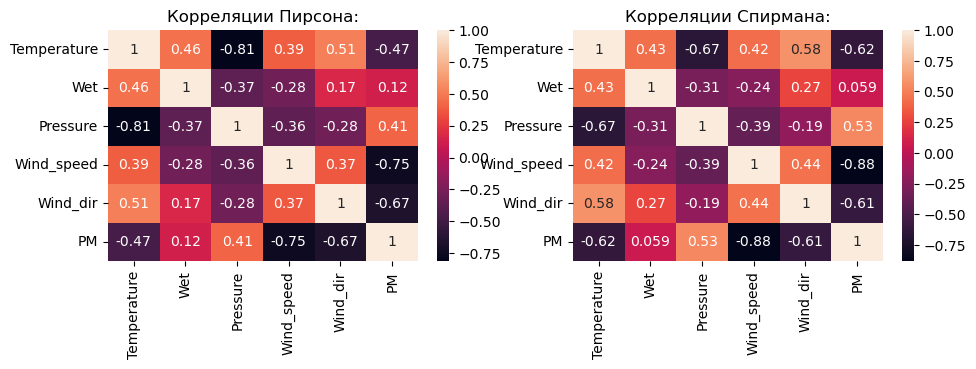

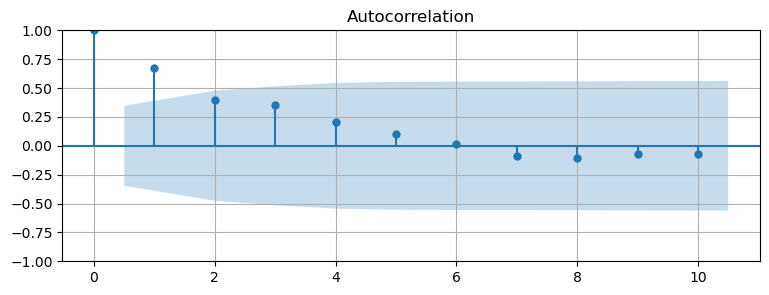

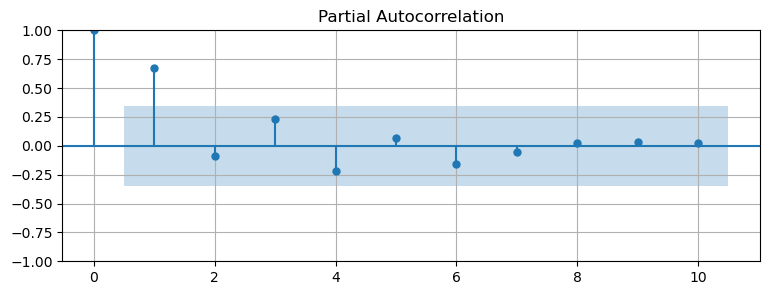

In [295]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-96.9743,15.620,-6.208,0.000,-127.588,-66.360
x2,-0.8802,0.420,-2.095,0.036,-1.704,-0.057
x3,0.0429,1.420,0.030,0.976,-2.740,2.825
x4,0.3387,0.051,6.639,0.000,0.239,0.439
ar.L1,0.2031,0.236,0.860,0.390,-0.260,0.666
ar.L2,-0.5716,0.259,-2.209,0.027,-1.079,-0.064
ma.L1,0.2230,0.474,0.471,0.638,-0.706,1.152
ma.L2,0.9899,3.947,0.251,0.802,-6.746,8.726
sigma2,451.8684,1721.682,0.262,0.793,-2922.567,3826.304


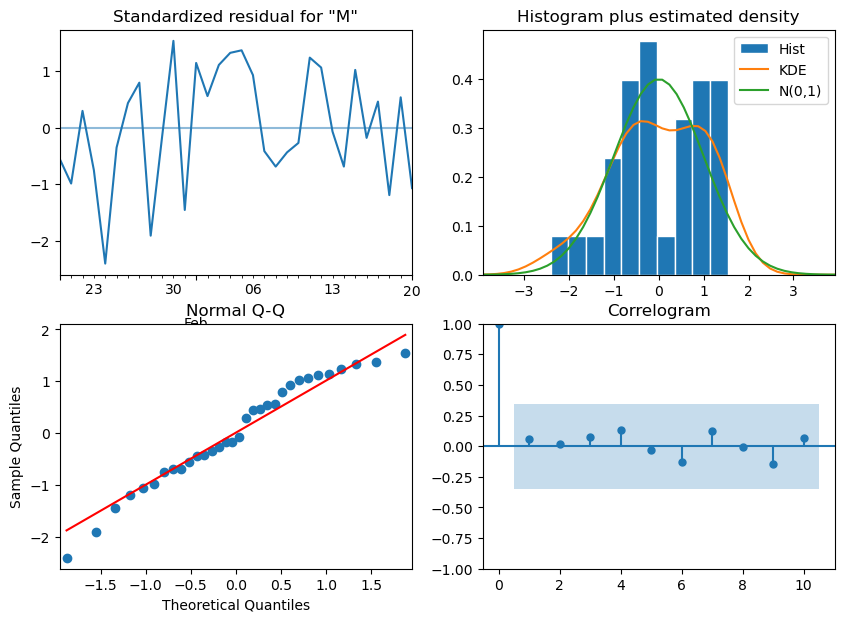

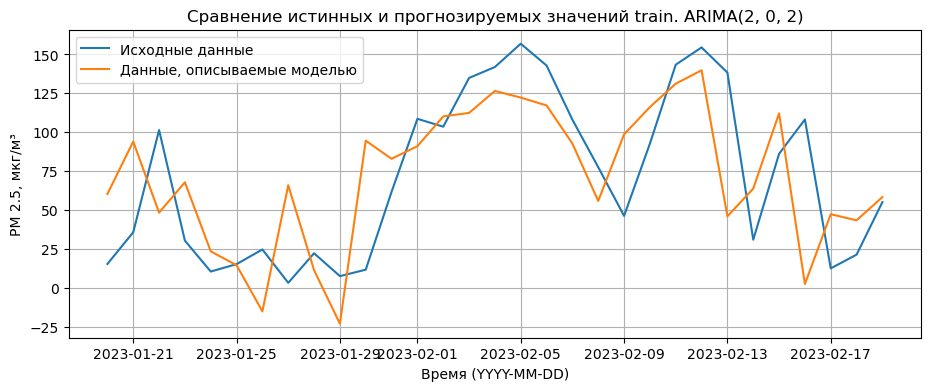

,Значение
MSE,1749.33
MAE,33.39
MAPE,1.63
$R^2$,0.35


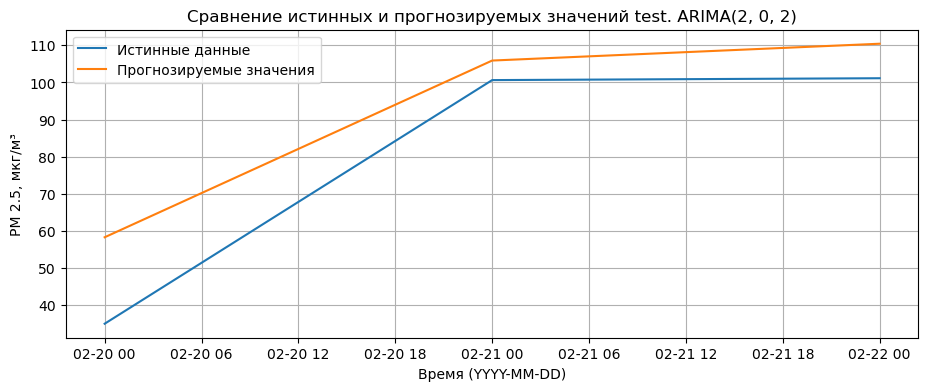

,Значение
MSE,218.45
MAE,12.61
MAPE,0.27
$R^2$,0.77


In [296]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Wind_dir', 'Temperature', 'Pressure'], use_optimal = False, save = False)

### 4

In [297]:
period = [f'2023-12-{i}' for i in range(10, 13)]
period

['2023-12-10', '2023-12-11', '2023-12-12']

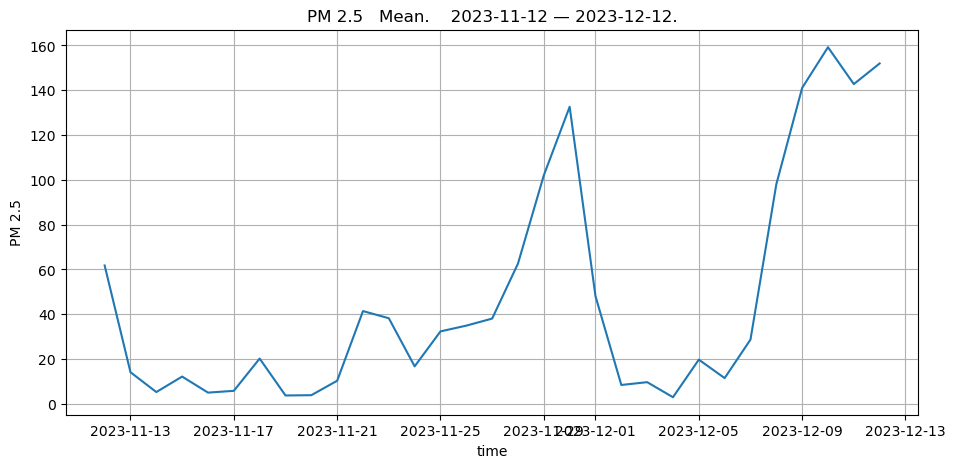

In [298]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-11-12", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

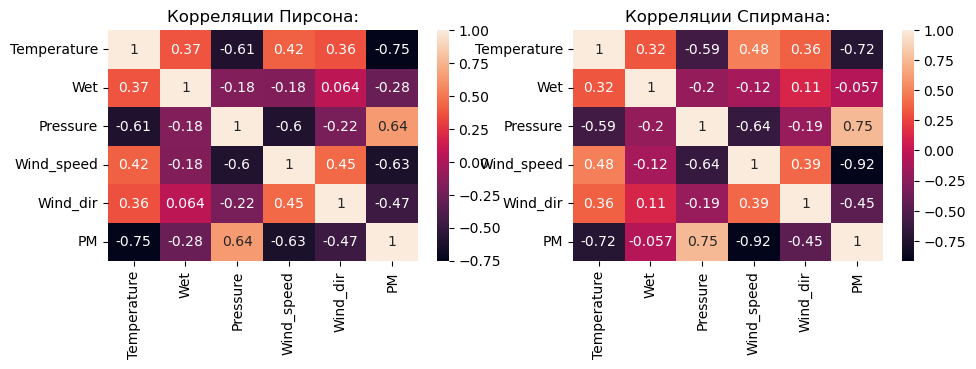

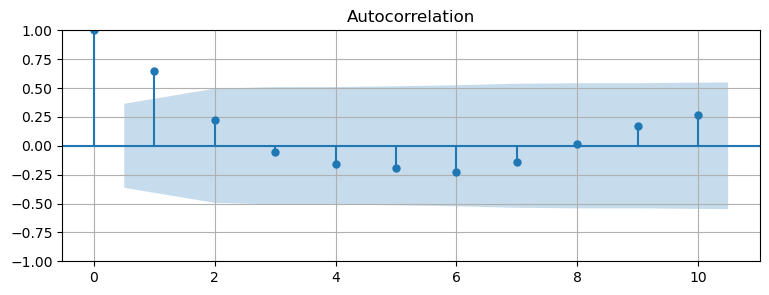

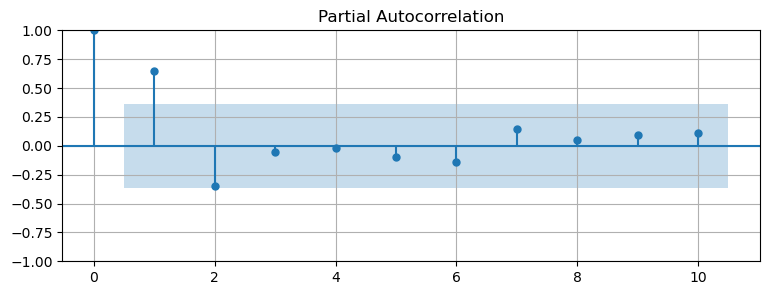

In [299]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-15.2617,5.136,-2.971,0.003,-25.329,-5.194
x2,-4.5111,0.608,-7.415,0.000,-5.703,-3.319
ar.L1,1.3983,0.229,6.099,0.000,0.949,1.848
ar.L2,-0.7106,0.194,-3.655,0.000,-1.092,-0.330
ma.L1,-0.7860,8.021,-0.098,0.922,-16.506,14.934
ma.L2,-0.2100,1.847,-0.114,0.909,-3.830,3.409
sigma2,258.8424,2073.078,0.125,0.901,-3804.315,4322.000


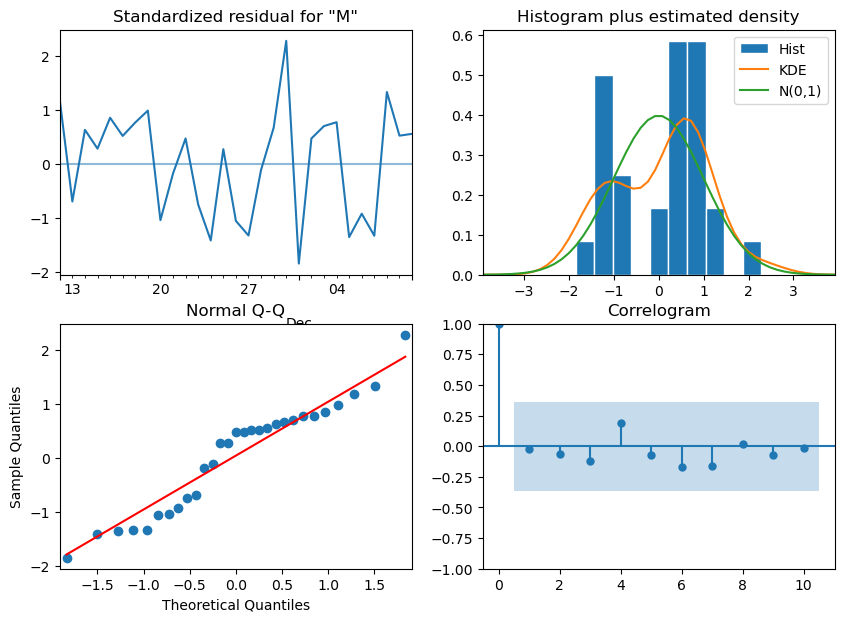

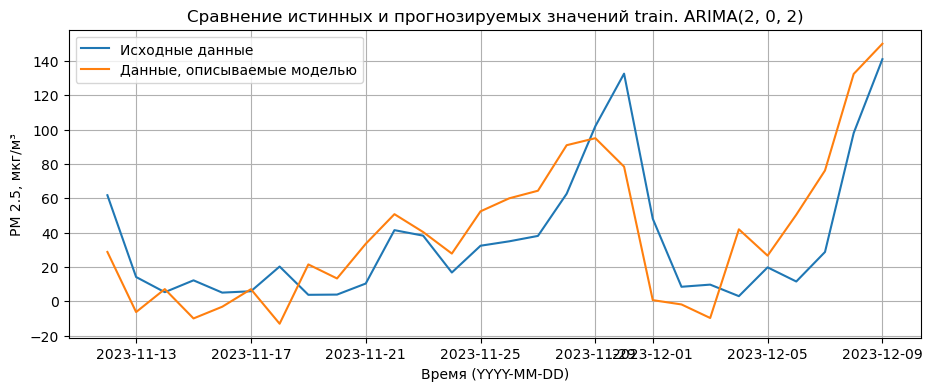

,Значение
MSE,685.18
MAE,21.67
MAPE,1.57
$R^2$,0.53


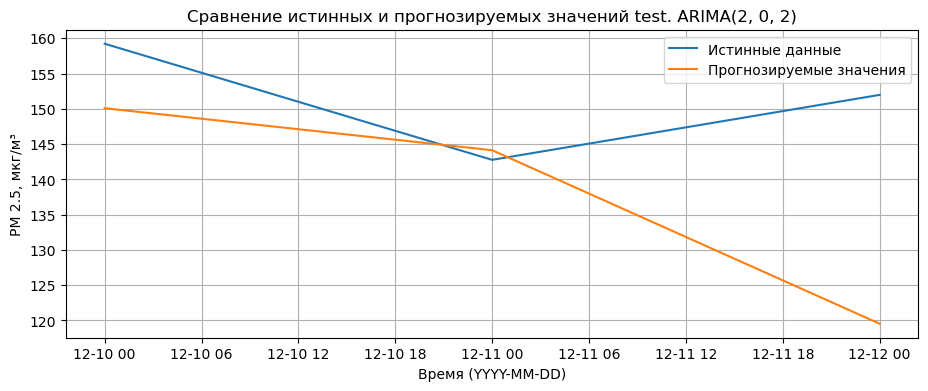

,Значение
MSE,379.21
MAE,14.32
MAPE,0.09
$R^2$,-7.36


In [304]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Temperature'], use_optimal = False, save = False)

### 5

In [305]:
period = [f'2024-01-{i}' for i in range(10, 13)]
period

['2024-01-10', '2024-01-11', '2024-01-12']

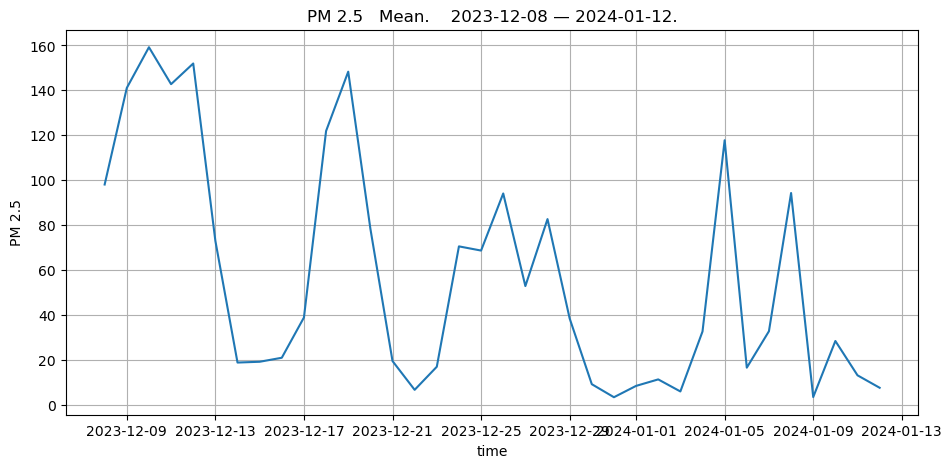

In [306]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-12-08", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

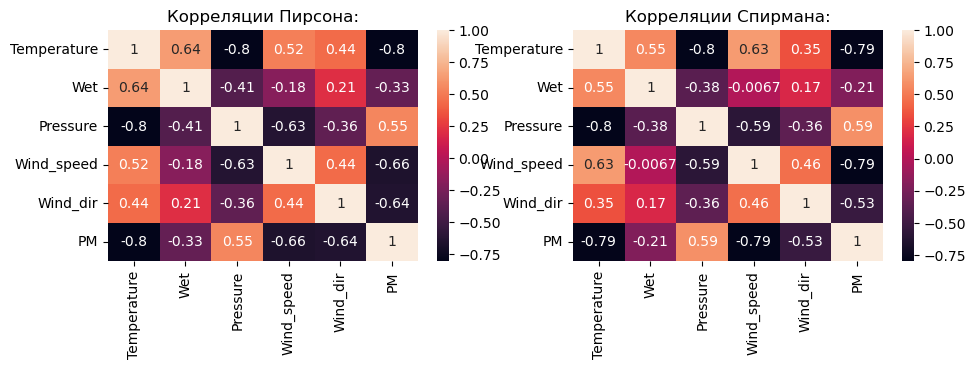

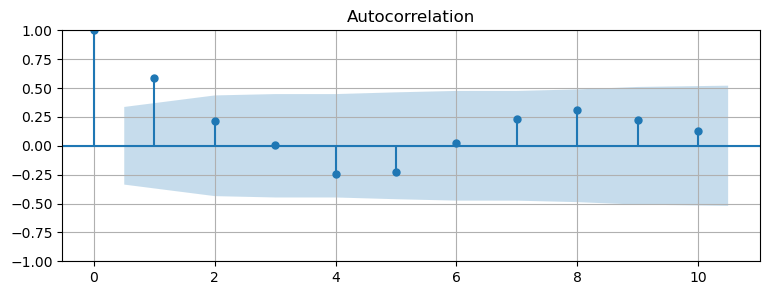

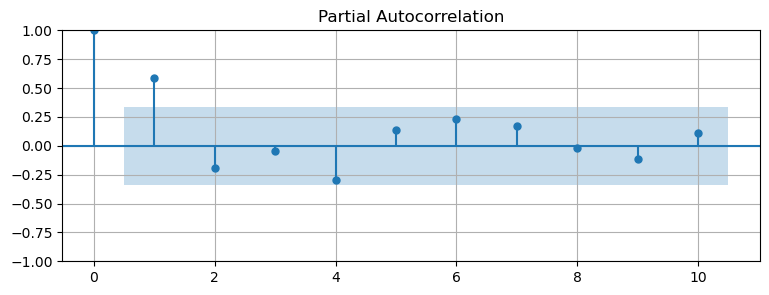

In [307]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-46.6280,23.883,-1.952,0.051,-93.438,0.182
x2,-6.3323,1.379,-4.593,0.000,-9.034,-3.630
x3,0.0289,0.072,0.403,0.687,-0.112,0.169
ar.L1,-0.3589,0.750,-0.479,0.632,-1.828,1.111
ar.L2,0.5565,0.536,1.039,0.299,-0.493,1.607
ma.L1,1.0936,0.822,1.330,0.184,-0.518,2.705
ma.L2,0.1848,0.364,0.507,0.612,-0.529,0.899
sigma2,480.0416,182.494,2.630,0.009,122.359,837.724


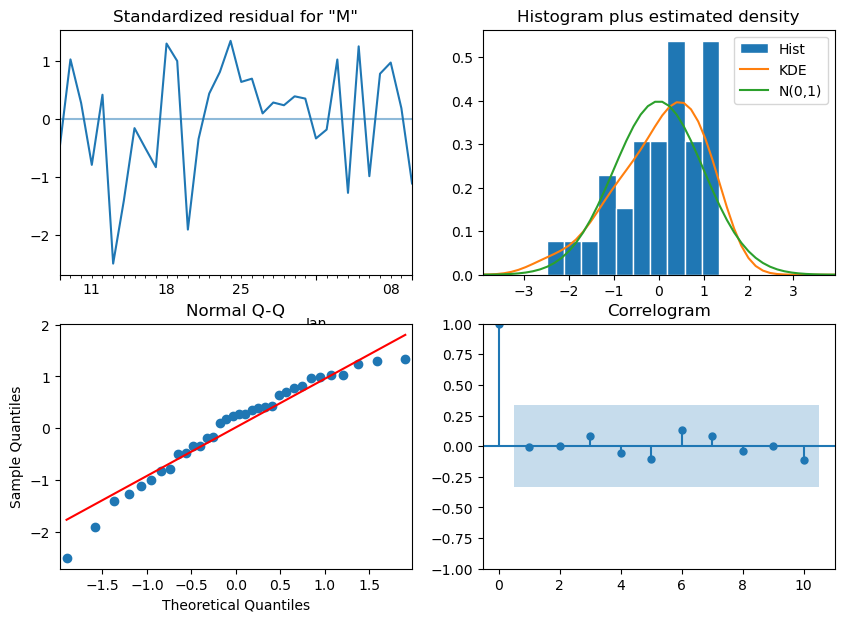

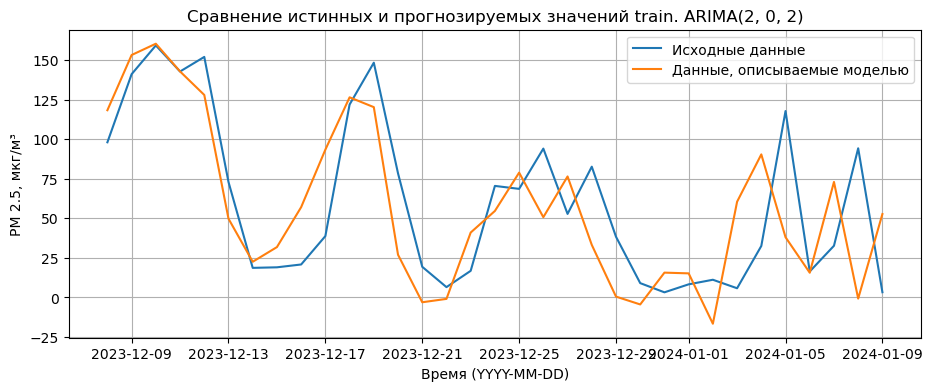

,Значение
MSE,1343.11
MAE,28.63
MAPE,1.51
$R^2$,0.47


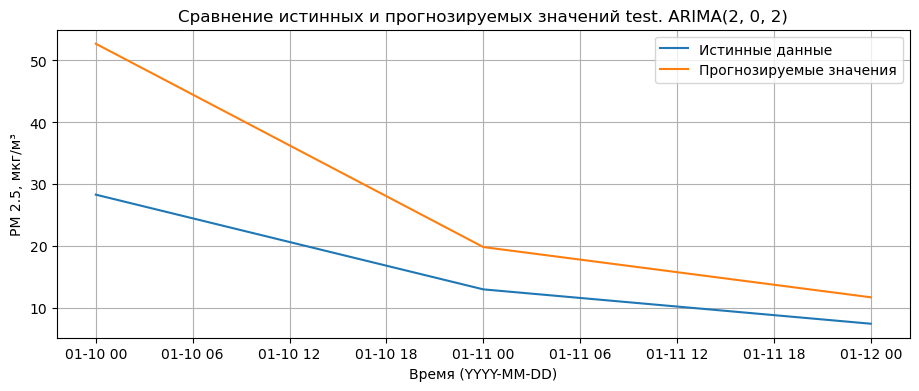

,Значение
MSE,219.73
MAE,11.83
MAPE,0.65
$R^2$,-1.83


In [312]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Temperature', 'Pressure'], use_optimal = False, save = False)

### 6

In [315]:
period = [f'2024-02-{i}' for i in range(10, 13)]
period

['2024-02-10', '2024-02-11', '2024-02-12']

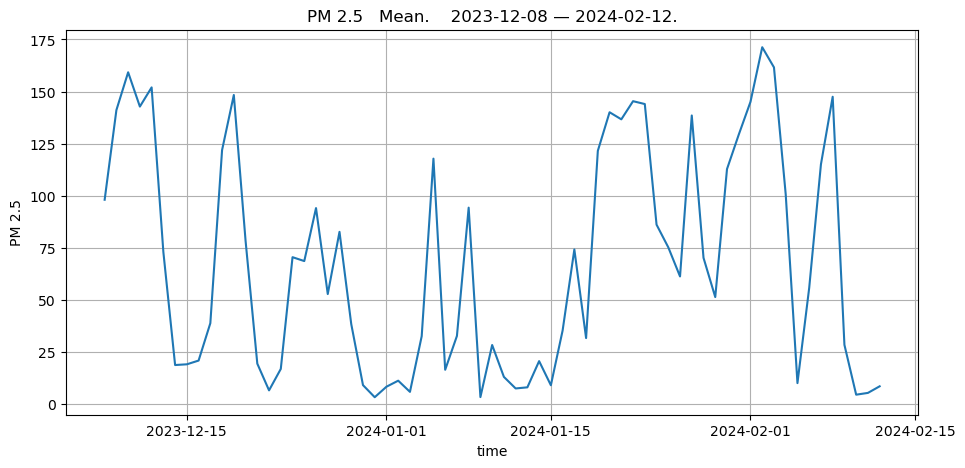

In [316]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-12-08", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

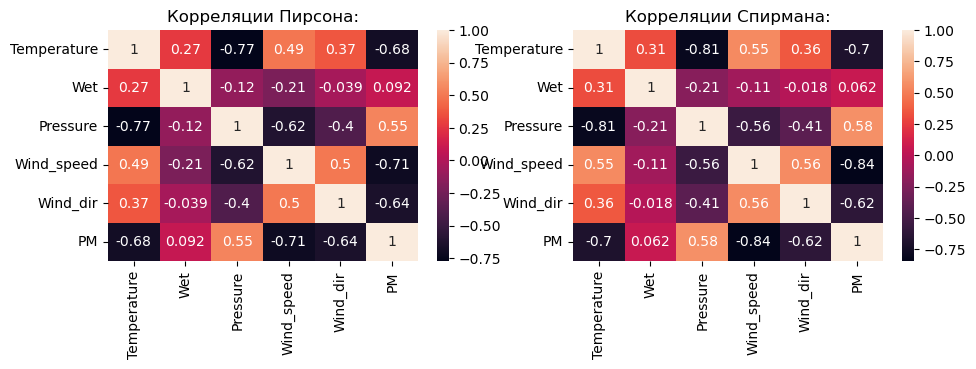

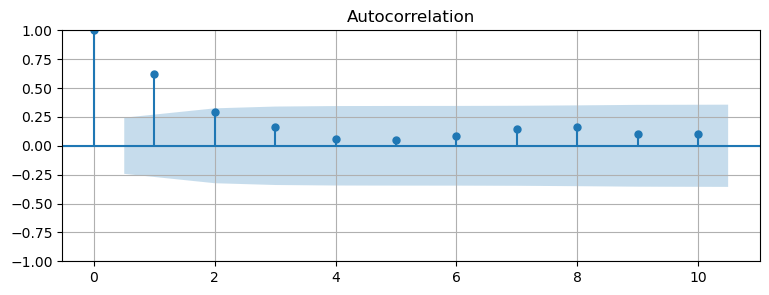

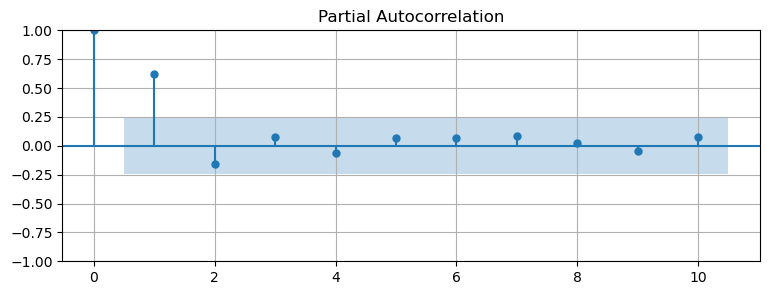

In [317]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-85.5555,16.978,-5.039,0.000,-118.832,-52.279
x2,-1.4748,0.342,-4.307,0.000,-2.146,-0.804
ar.L1,1.0000,0.000,2692.229,0.000,0.999,1.001
ma.L1,-0.9271,0.073,-12.711,0.000,-1.070,-0.784
sigma2,1150.3903,306.979,3.747,0.000,548.722,1752.058


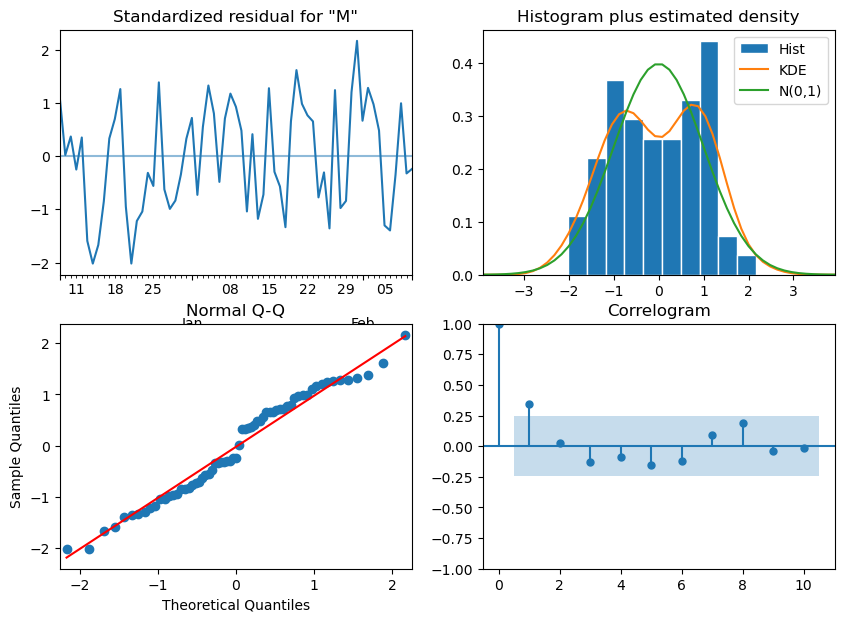

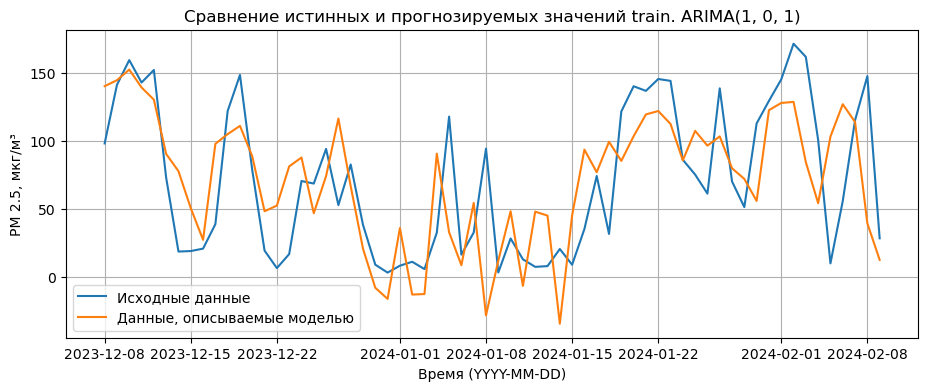

,Значение
MSE,1836.92
MAE,33.95
MAPE,1.35
$R^2$,0.35


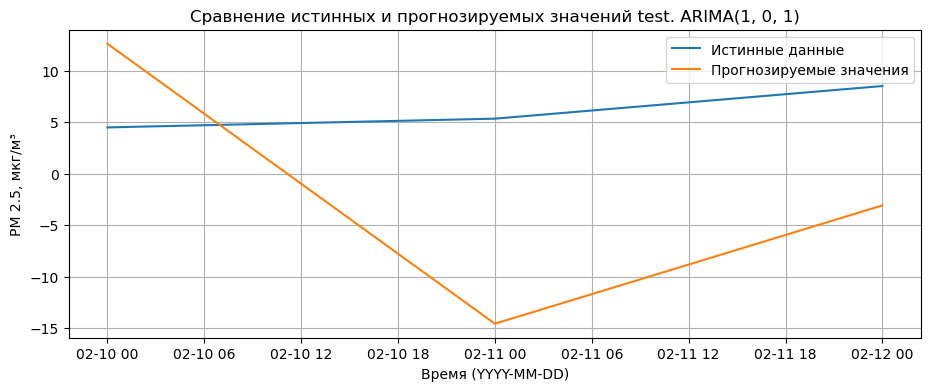

,Значение
MSE,199.09
MAE,13.21
MAPE,2.30
$R^2$,-65.53


In [328]:
forecast.getModel(p = 1, d = 0, q = 1, exog_features = ['Wind_speed', 'Wind_dir'], use_optimal = False, save = False)

### Весна 1

In [329]:
period = [f'2022-03-{i}' for i in range(20, 23)]
period

['2022-03-20', '2022-03-21', '2022-03-22']

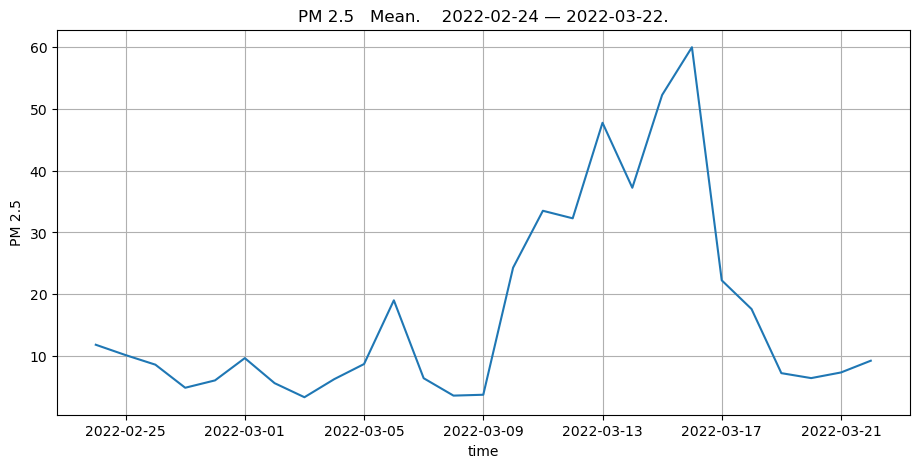

In [330]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-02-24", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

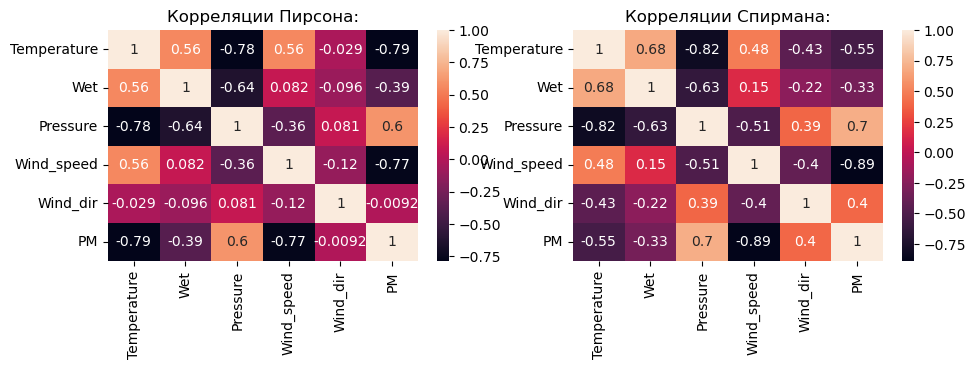

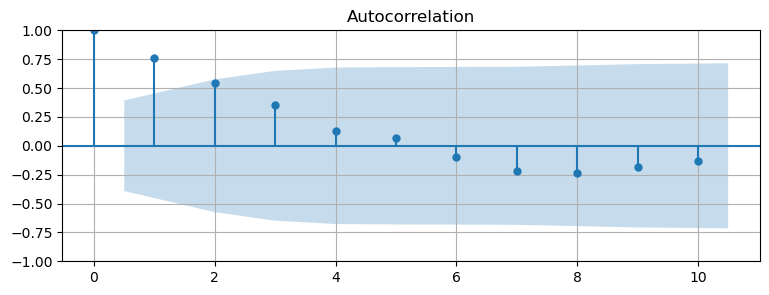

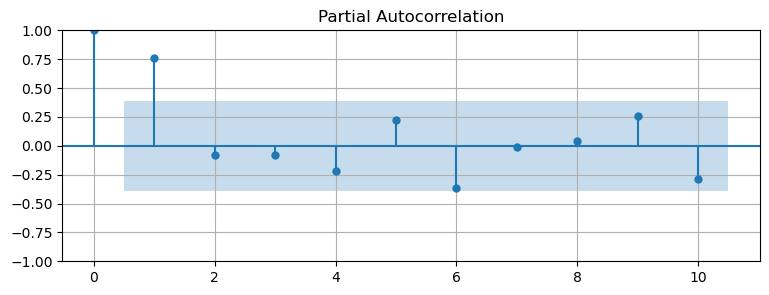

In [331]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-1.6158,0.629,-2.571,0.010,-2.848,-0.384
x2,-6.4081,2.806,-2.284,0.022,-11.907,-0.909
x3,0.0377,0.018,2.070,0.038,0.002,0.073
ar.L1,0.2748,0.485,0.566,0.571,-0.677,1.226
ar.L2,0.2649,0.457,0.580,0.562,-0.631,1.161
ma.L1,-0.0944,0.974,-0.097,0.923,-2.003,1.815
ma.L2,-0.8340,0.932,-0.895,0.371,-2.661,0.993
sigma2,42.5190,36.878,1.153,0.249,-29.762,114.799


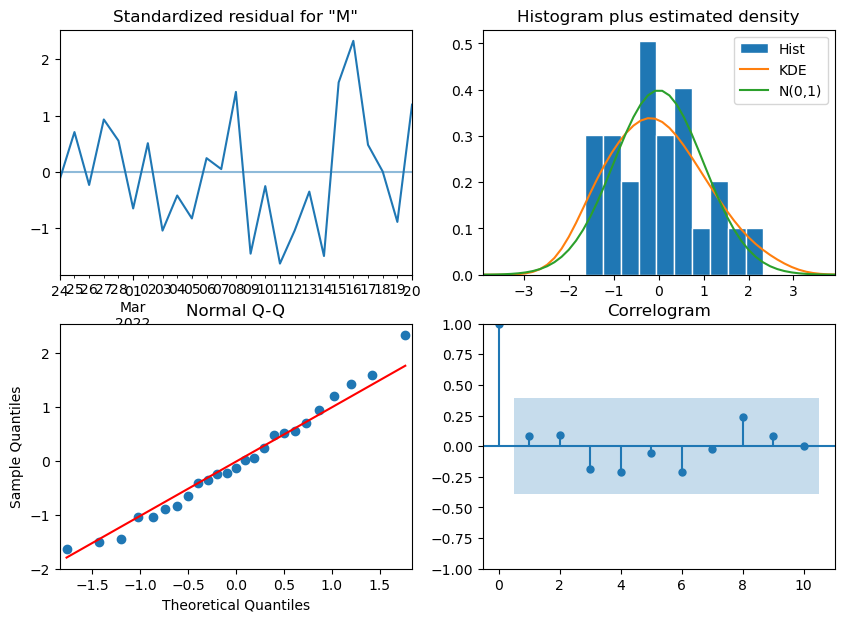

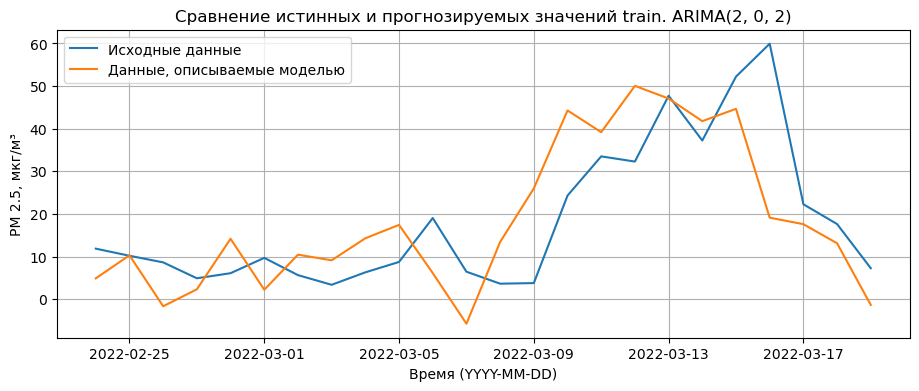

,Значение
MSE,166.23
MAE,9.78
MAPE,1.02
$R^2$,0.39


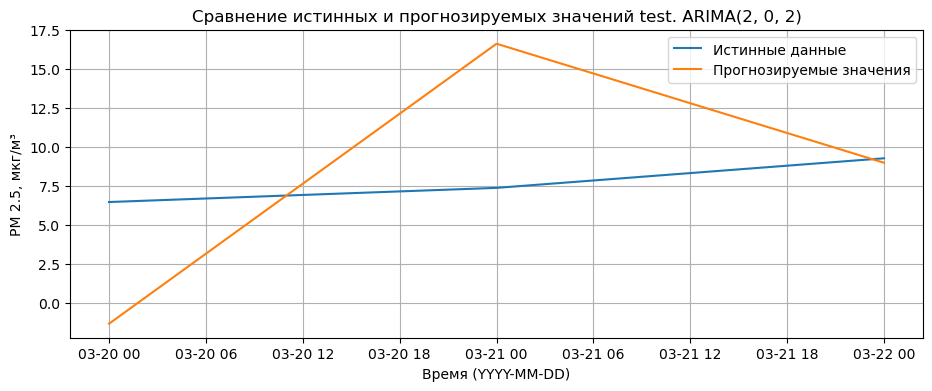

,Значение
MSE,48.97
MAE,5.79
MAPE,0.83
$R^2$,-34.73


In [336]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Temperature', 'Wind_speed', 'Pressure'], use_optimal = False, save = False)

### 2

In [337]:
period = [f'2022-04-{i}' for i in range(20, 23)]
period

['2022-04-20', '2022-04-21', '2022-04-22']

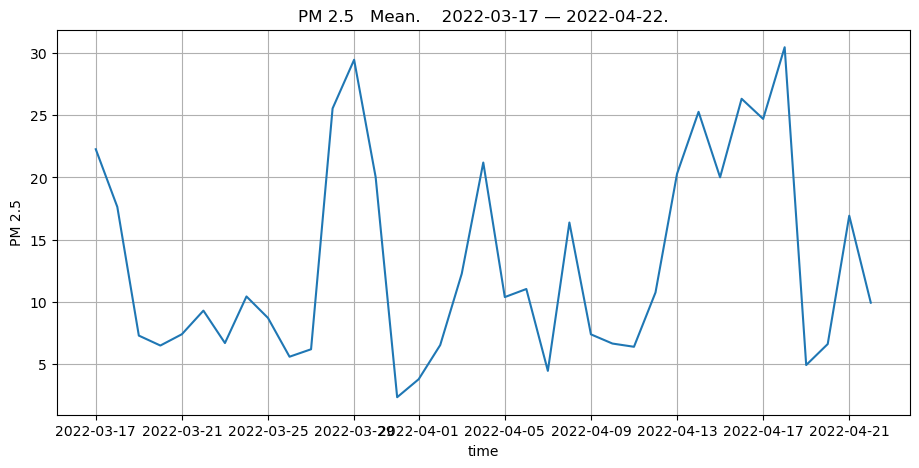

In [338]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-03-17", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

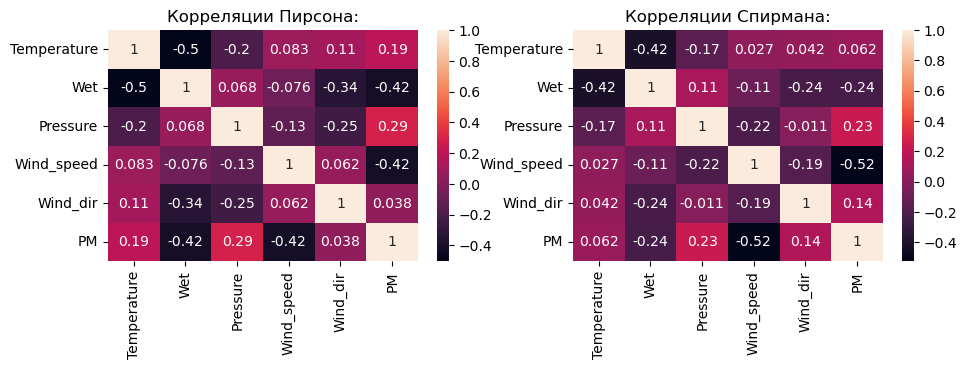

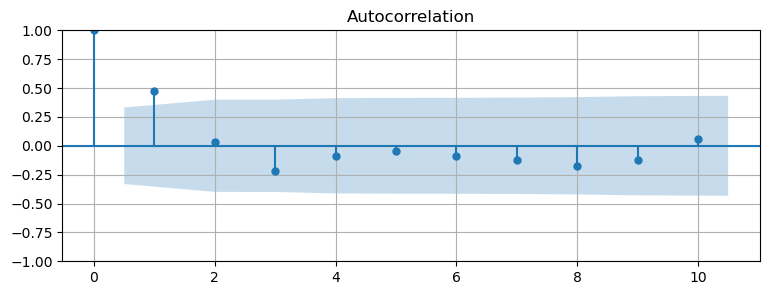

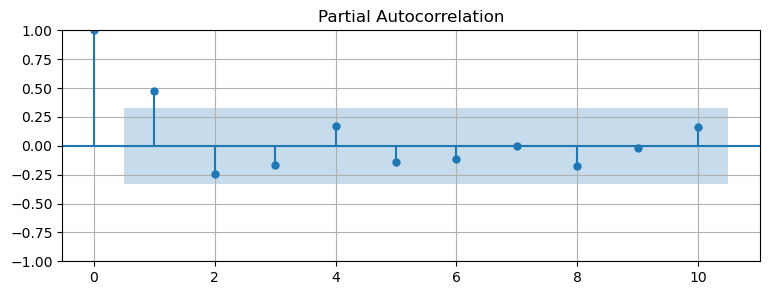

In [339]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-2.5400,1.139,-2.231,0.026,-4.772,-0.308
ar.L1,0.9692,0.048,20.170,0.000,0.875,1.063
ma.L1,-0.2521,0.300,-0.841,0.400,-0.839,0.335
sigma2,56.1738,11.515,4.878,0.000,33.605,78.742


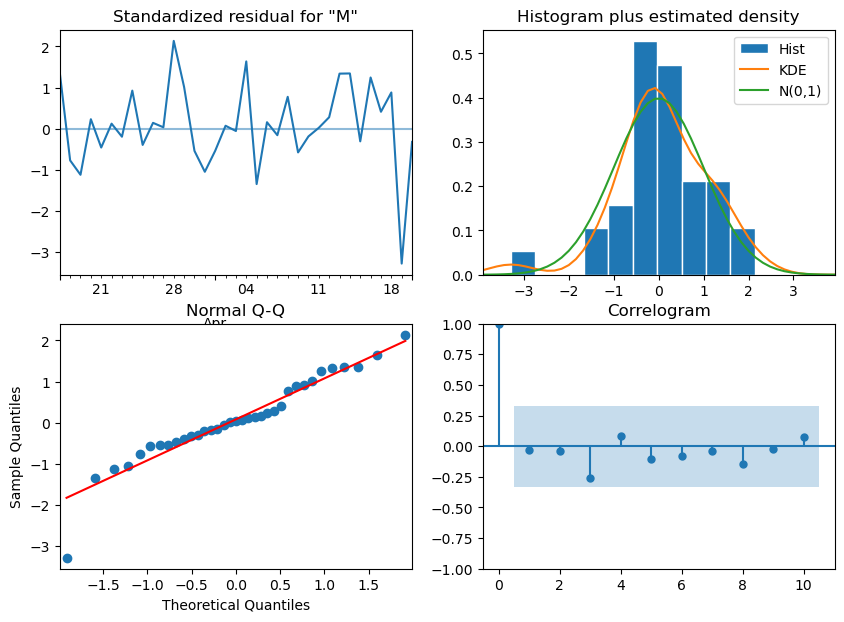

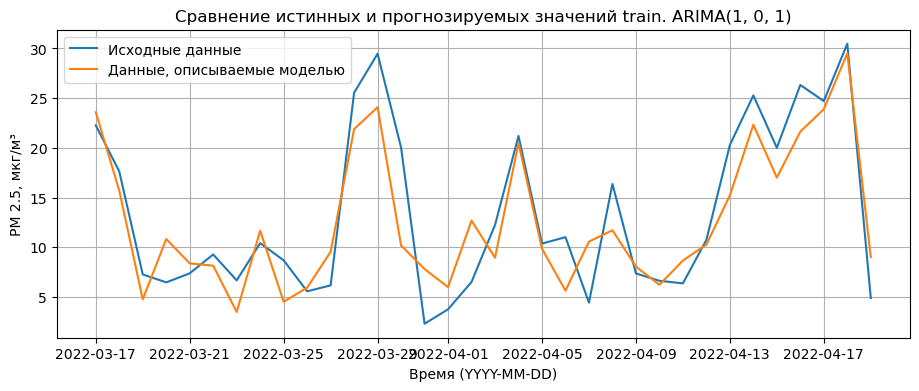

,Значение
MSE,14.01
MAE,3.05
MAPE,0.37
$R^2$,0.80


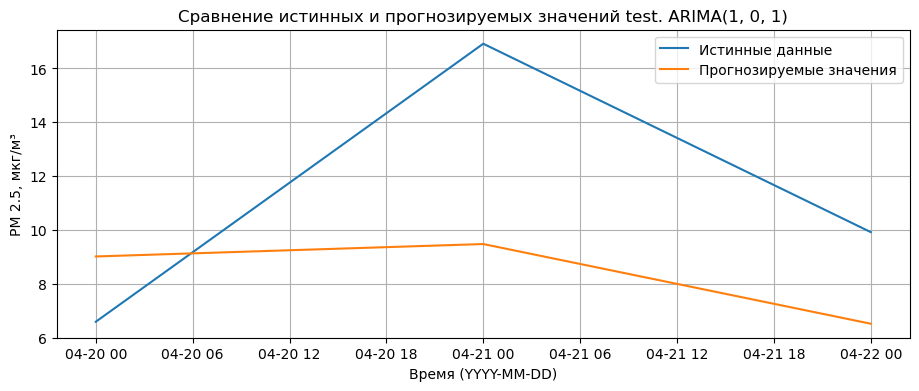

,Значение
MSE,24.28
MAE,4.42
MAPE,0.38
$R^2$,-0.31


In [343]:
forecast.getModel(p = 1, d = 0, q = 1, exog_features = [ 'Wind_speed'], use_optimal = False, save = False)

### 3

In [344]:
period = [f'2022-11-{i}' for i in range(20, 23)]
period

['2022-11-20', '2022-11-21', '2022-11-22']

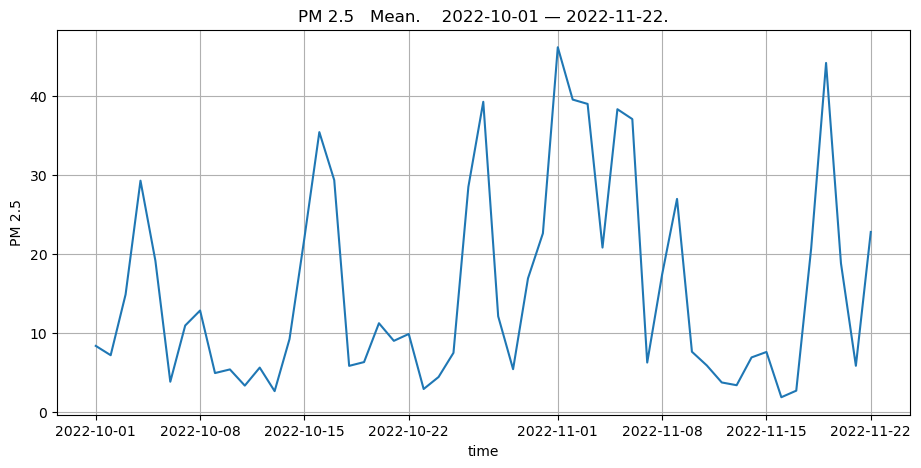

In [345]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-10-01", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

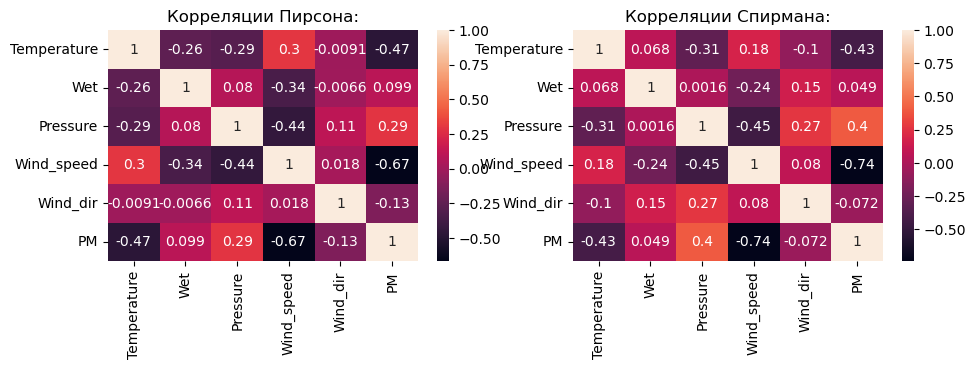

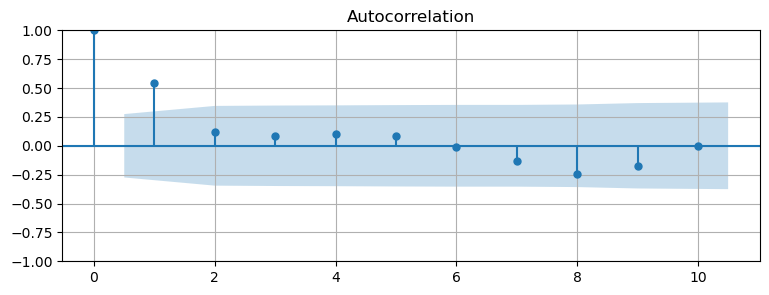

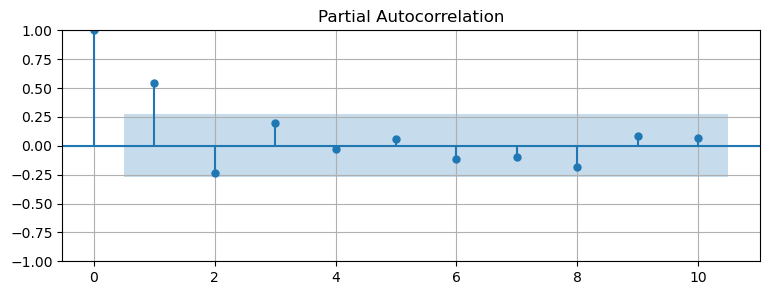

In [346]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 10)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-5.1669,0.771,-6.698,0.000,-6.679,-3.655
ar.L1,1.3763,0.351,3.917,0.000,0.688,2.065
ar.L2,-0.3767,0.351,-1.074,0.283,-1.064,0.311
ma.L1,-0.6178,0.347,-1.782,0.075,-1.297,0.062
ma.L2,-0.2958,0.260,-1.139,0.255,-0.805,0.213
sigma2,60.7609,13.424,4.526,0.000,34.451,87.071


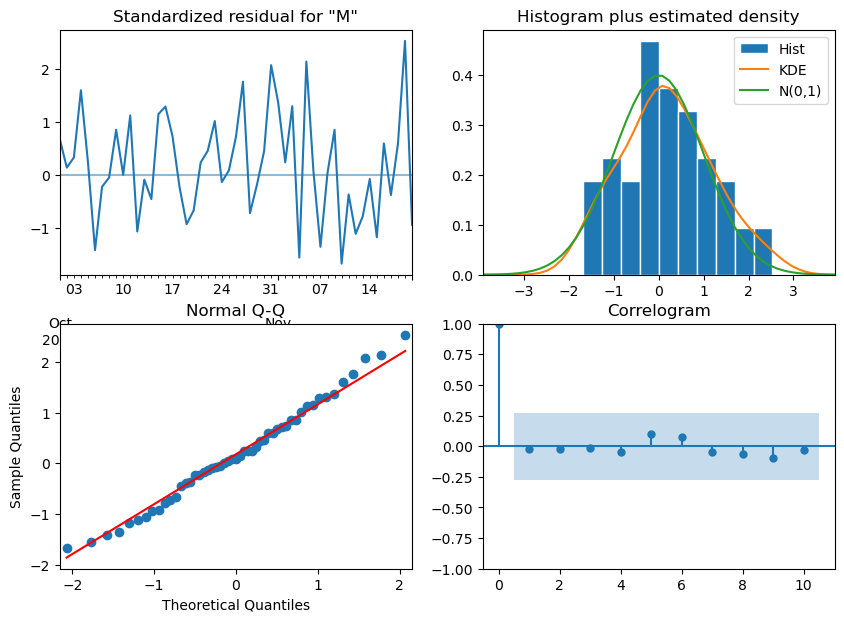

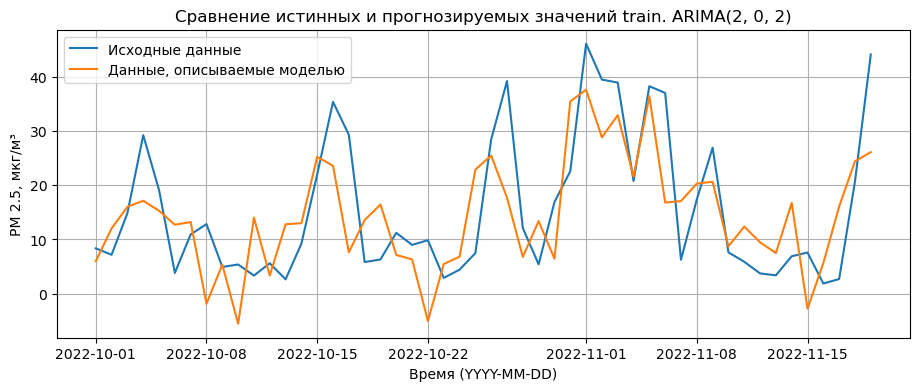

,Значение
MSE,92.20
MAE,7.83
MAPE,0.93
$R^2$,0.45


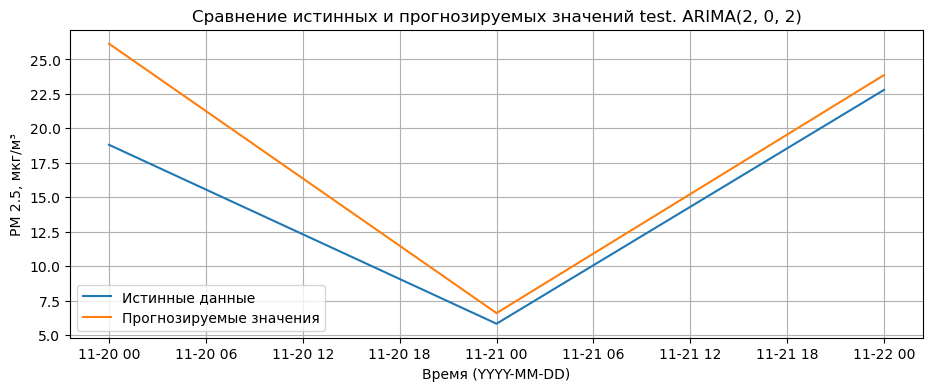

,Значение
MSE,18.48
MAE,3.06
MAPE,0.19
$R^2$,0.65


In [347]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed'], use_optimal = False, save = False)

### 4

In [348]:
period = [f'2023-03-{i}' for i in range(10, 13)]
period

['2023-03-10', '2023-03-11', '2023-03-12']

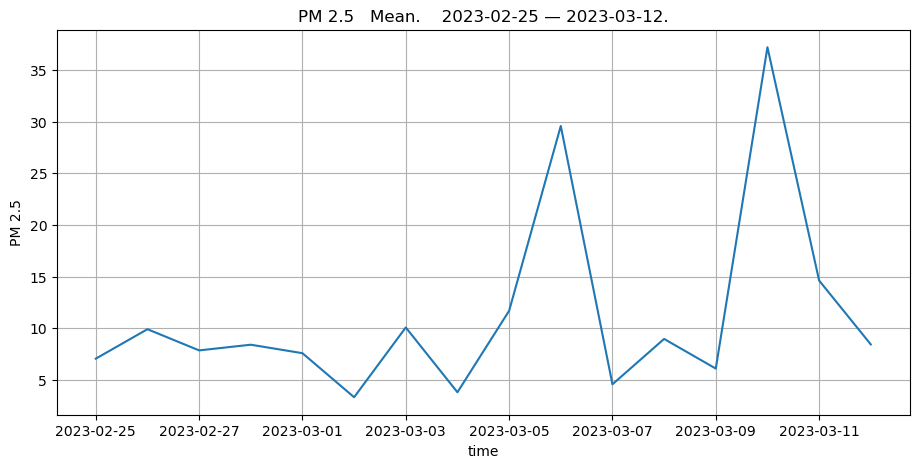

In [349]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-02-25", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

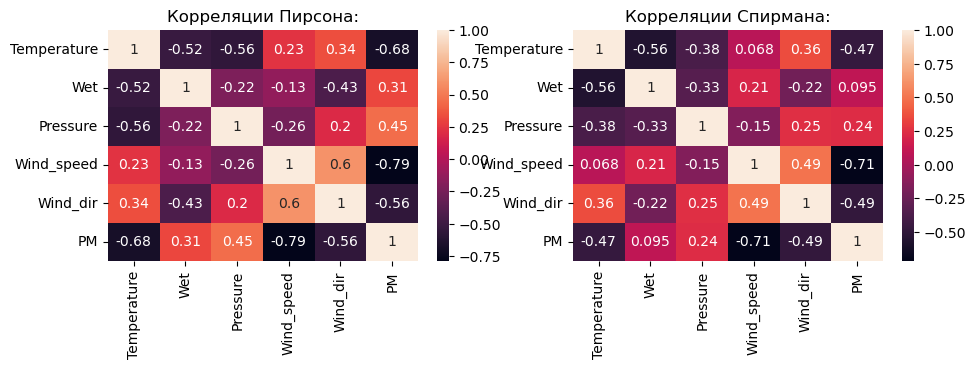

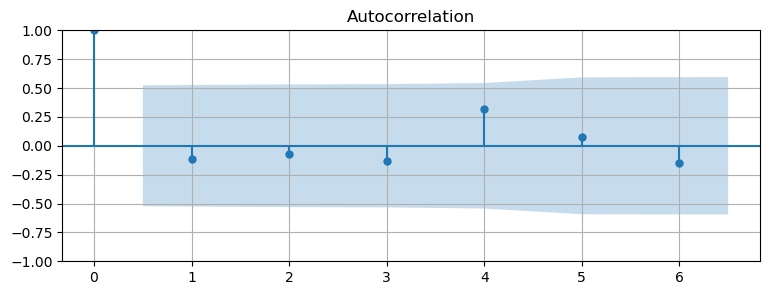

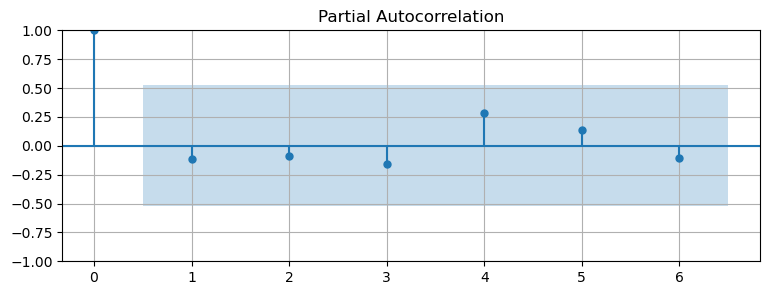

In [350]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,5.9455,0.274,21.676,0.000,5.408,6.483
x2,-0.7956,0.289,-2.756,0.006,-1.361,-0.230
ar.L1,-0.0731,0.729,-0.100,0.920,-1.502,1.356
ar.L2,-0.3329,0.569,-0.585,0.558,-1.447,0.782
ma.L1,-0.9999,1093.261,-0.001,0.999,-2143.751,2141.751
sigma2,28.3862,3.1e+04,0.001,0.999,-6.08e+04,6.09e+04


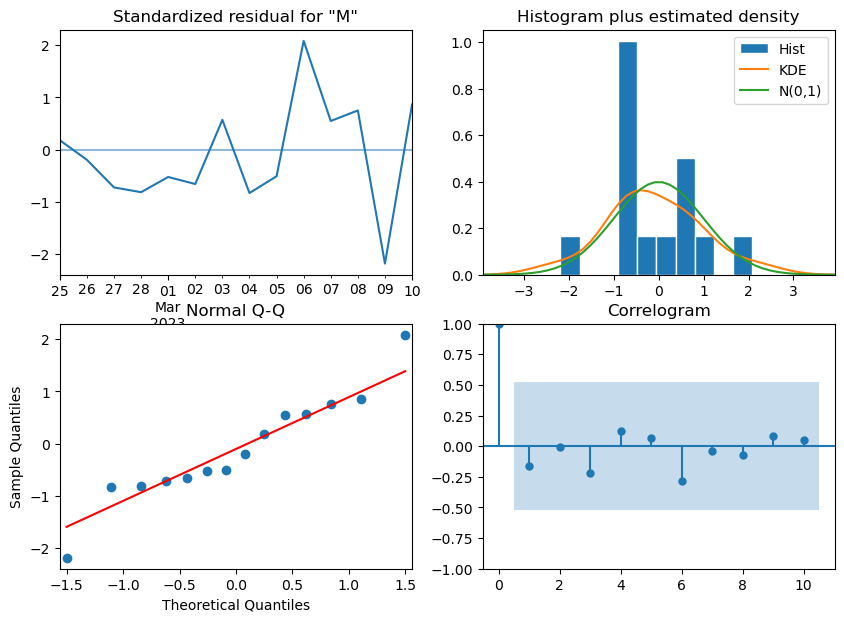

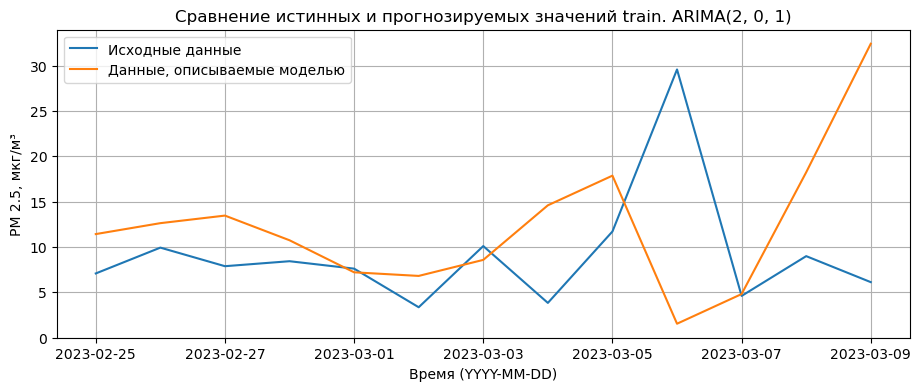

,Значение
MSE,138.18
MAE,7.78
MAPE,0.98
$R^2$,-2.41


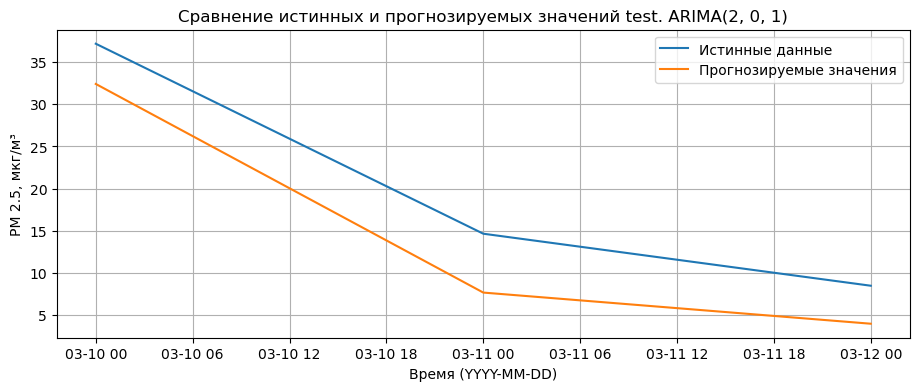

,Значение
MSE,30.70
MAE,5.43
MAPE,0.38
$R^2$,0.80


In [351]:
forecast.getModel(p = 2, d = 0, q = 1, exog_features = [ 'Wind_speed', 'Temperature'], use_optimal = False, save = False)

### 5

In [352]:
period = [f'2023-04-{i}' for i in range(10, 13)]
period

['2023-04-10', '2023-04-11', '2023-04-12']

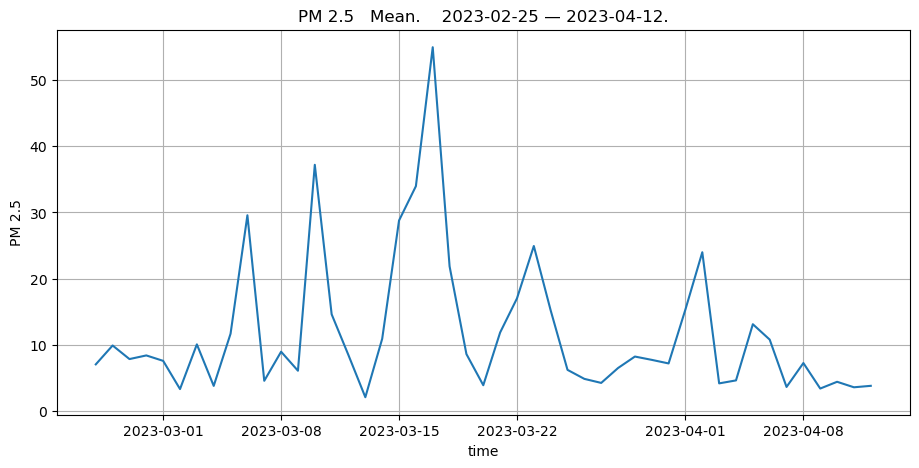

In [353]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-02-25", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

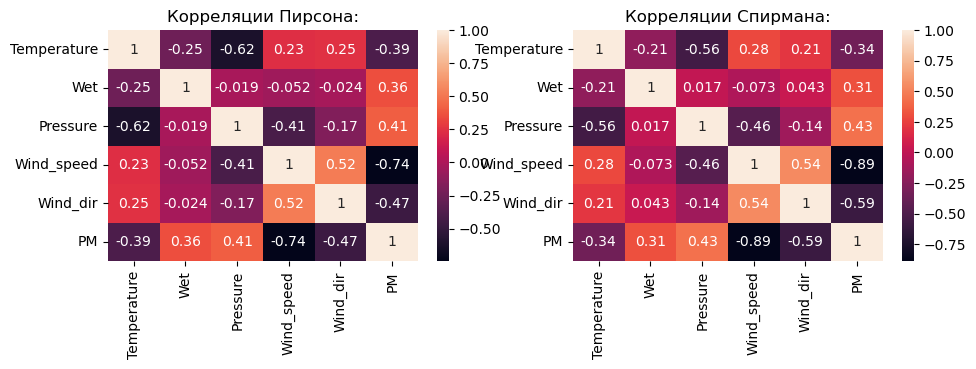

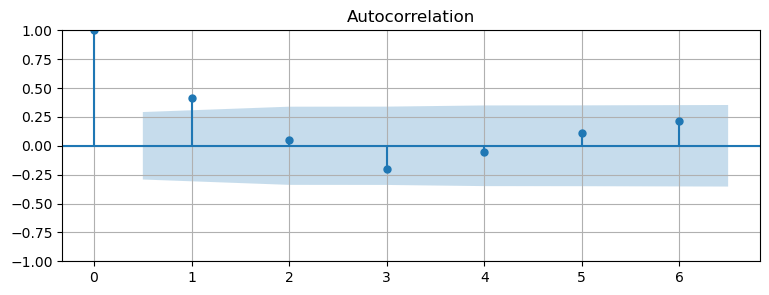

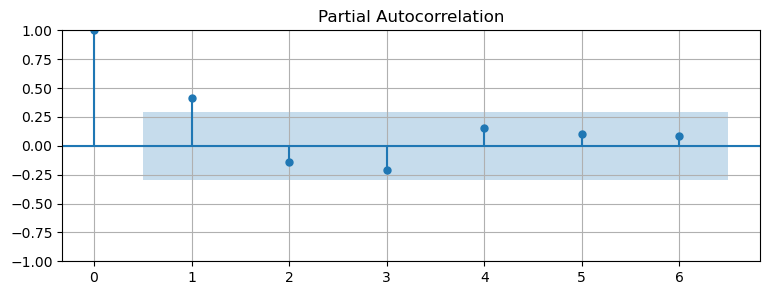

In [354]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-2.0151,3.932,-0.512,0.608,-9.721,5.691
x2,0.2542,0.156,1.627,0.104,-0.052,0.560
ar.L1,-0.5983,0.497,-1.203,0.229,-1.573,0.376
ar.L2,-0.1542,0.229,-0.675,0.500,-0.602,0.294
ma.L1,1.0789,0.426,2.534,0.011,0.244,1.913
ma.L2,0.6834,0.193,3.532,0.000,0.304,1.063
sigma2,101.7711,19.409,5.243,0.000,63.729,139.813


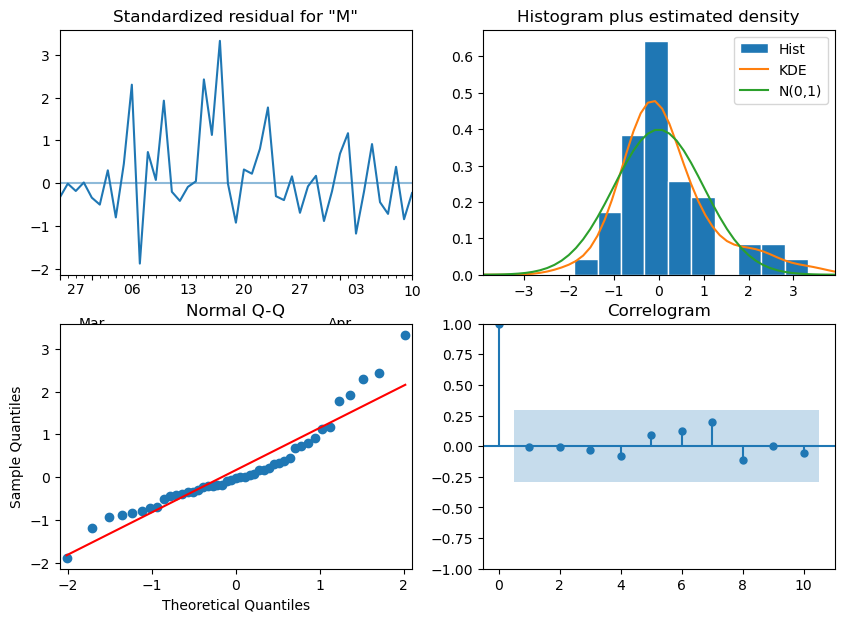

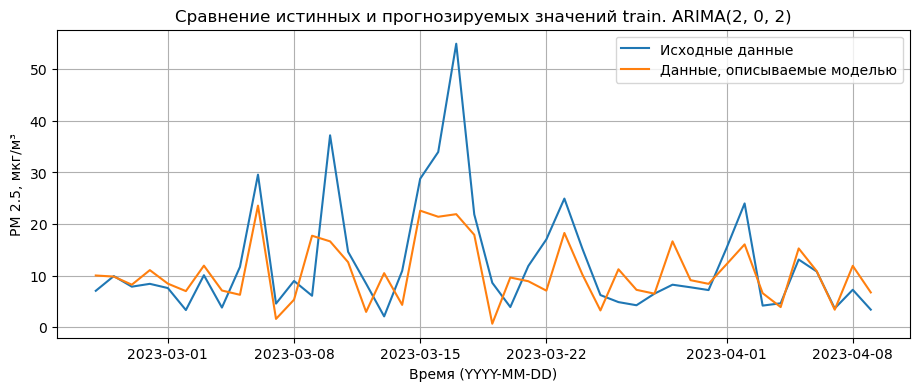

,Значение
MSE,60.47
MAE,5.24
MAPE,0.56
$R^2$,0.47


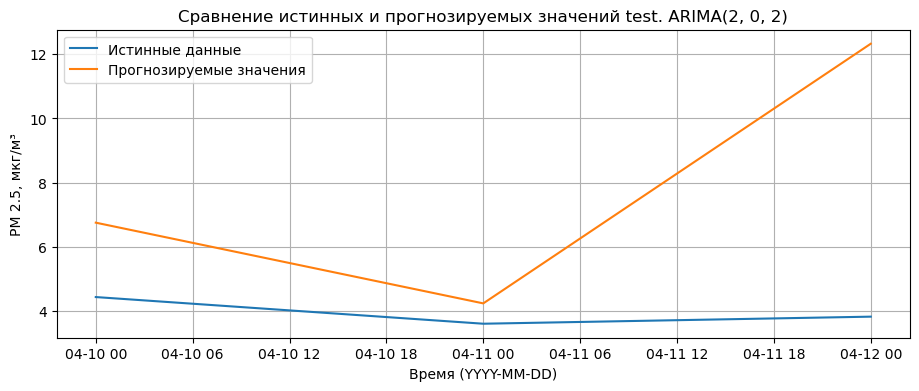

,Значение
MSE,25.97
MAE,3.81
MAPE,0.97
$R^2$,-209.71


In [359]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wind_speed', 'Wind_dir'], use_optimal = False, save = False)

### 6

In [360]:
period = [f'2023-11-{i}' for i in range(10, 13)]
period

['2023-11-10', '2023-11-11', '2023-11-12']

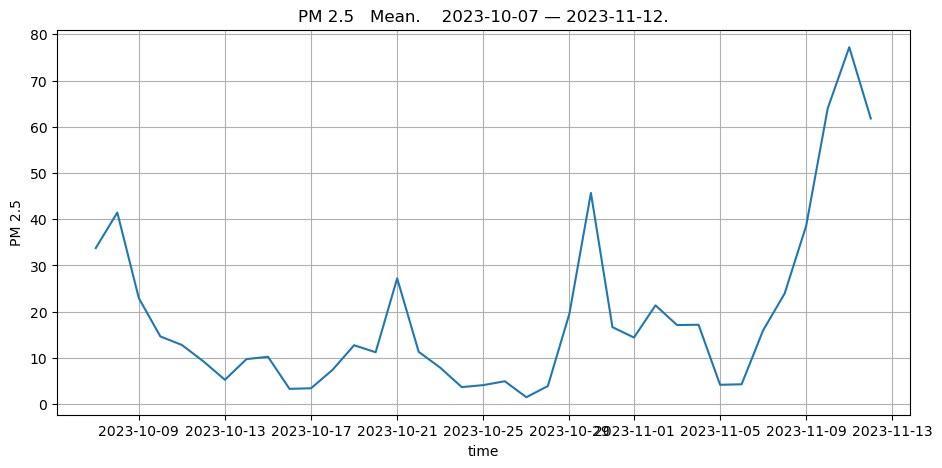

In [361]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-10-07", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

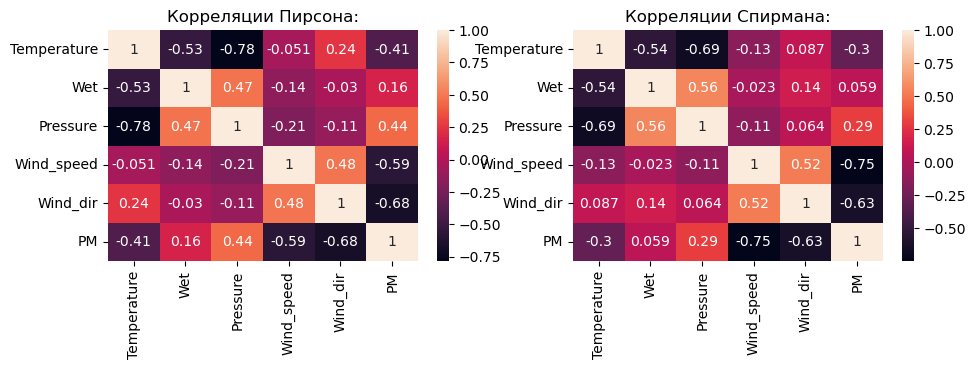

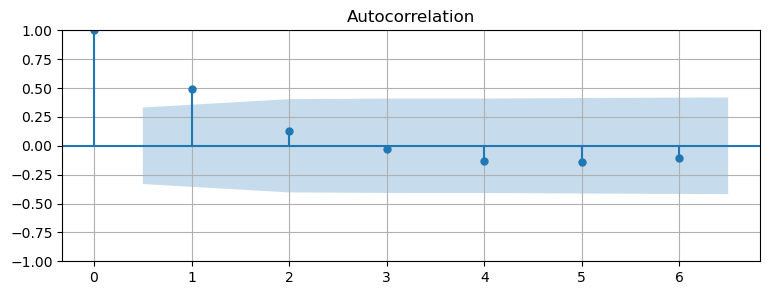

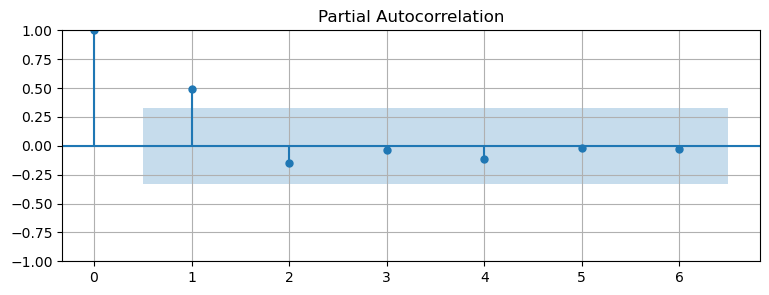

In [362]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-17.9915,6.752,-2.665,0.008,-31.225,-4.758
ar.L1,0.2356,0.429,0.549,0.583,-0.605,1.076
ar.L2,0.7487,0.410,1.828,0.068,-0.054,1.551
ma.L1,0.8943,6.149,0.145,0.884,-11.158,12.946
ma.L2,-0.1036,0.452,-0.229,0.819,-0.990,0.783
sigma2,83.1495,471.589,0.176,0.860,-841.149,1007.448


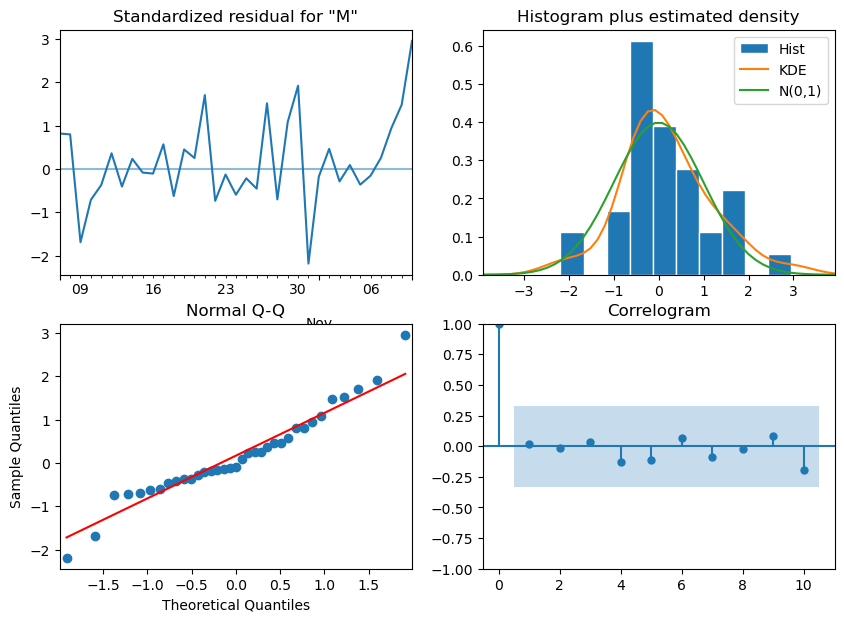

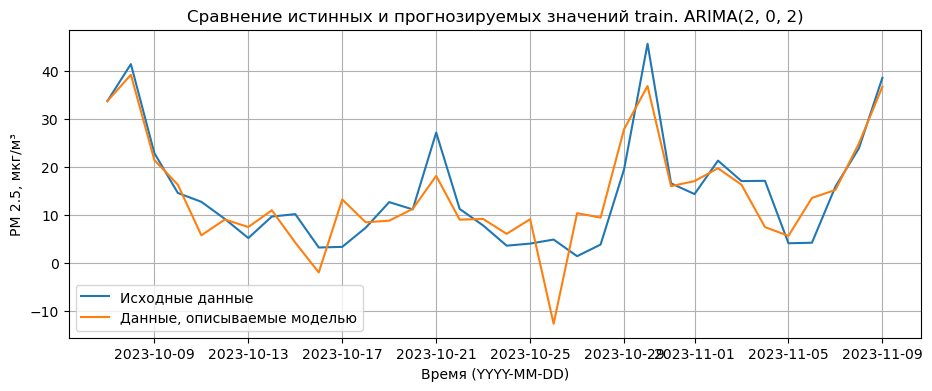

,Значение
MSE,33.06
MAE,4.15
MAPE,0.73
$R^2$,0.74


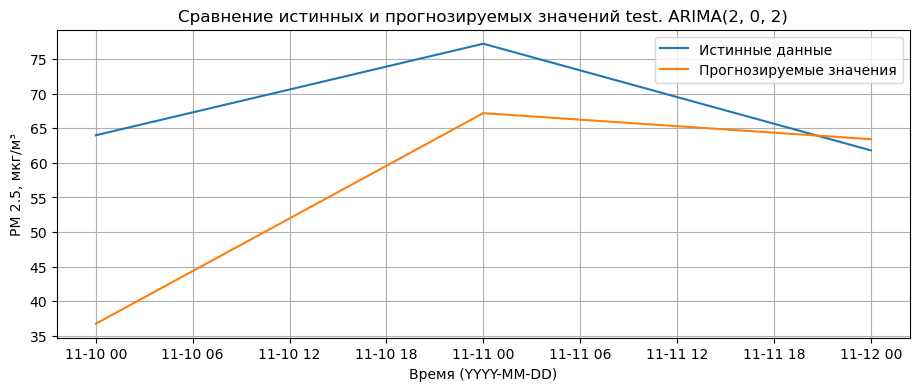

,Значение
MSE,281.93
MAE,12.97
MAPE,0.19
$R^2$,-5.07


In [366]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wind_speed'], use_optimal = False, save = False)

### 7

In [367]:
period = [f'2024-03-{i}' for i in range(17, 20)]
period

['2024-03-17', '2024-03-18', '2024-03-19']

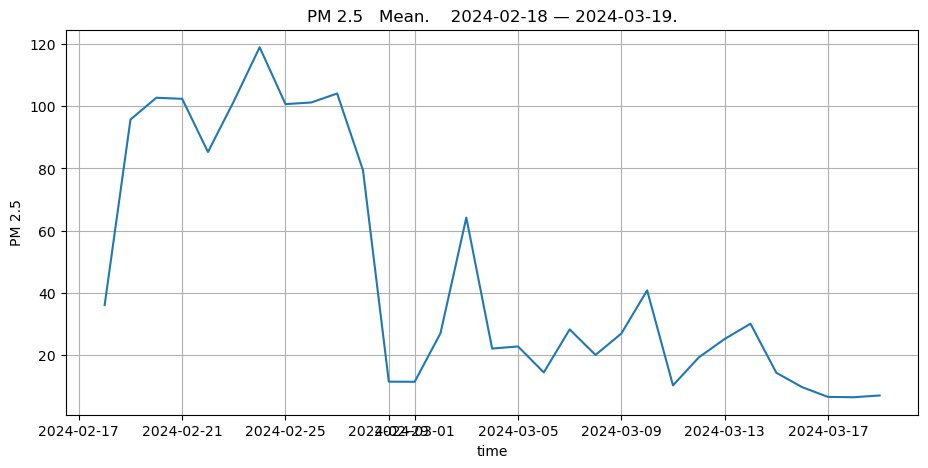

In [368]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2024-02-18", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

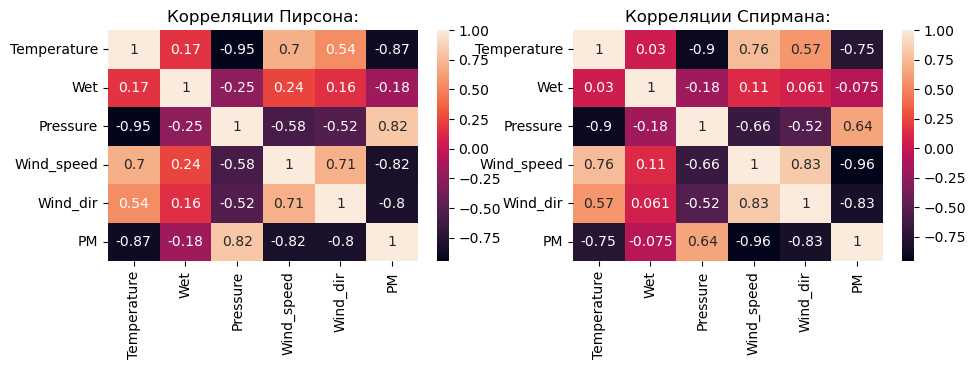

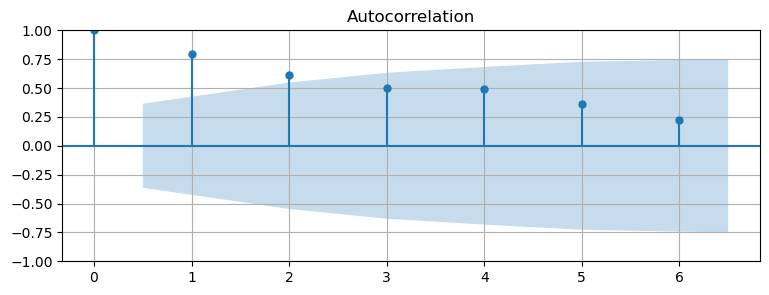

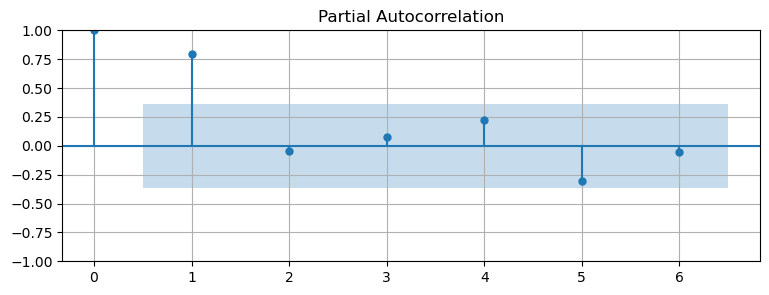

In [369]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-49.0526,19.210,-2.554,0.011,-86.703,-11.402
ar.L1,0.9963,0.012,83.802,0.000,0.973,1.020
ma.L1,0.0142,0.245,0.058,0.954,-0.466,0.495
ma.L2,0.2916,0.202,1.446,0.148,-0.104,0.687
ma.L3,-0.6662,0.326,-2.041,0.041,-1.306,-0.027
sigma2,263.8633,78.726,3.352,0.001,109.564,418.163


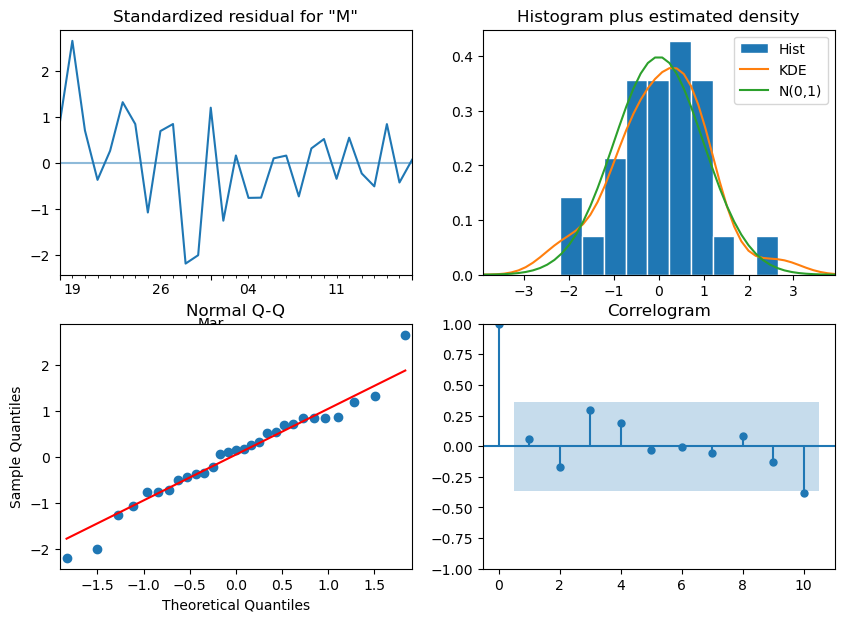

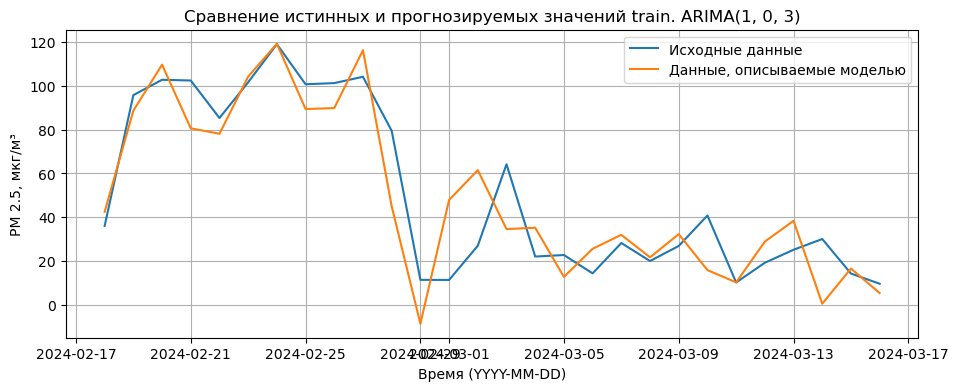

,Значение
MSE,295.69
MAE,13.25
MAPE,0.48
$R^2$,0.79


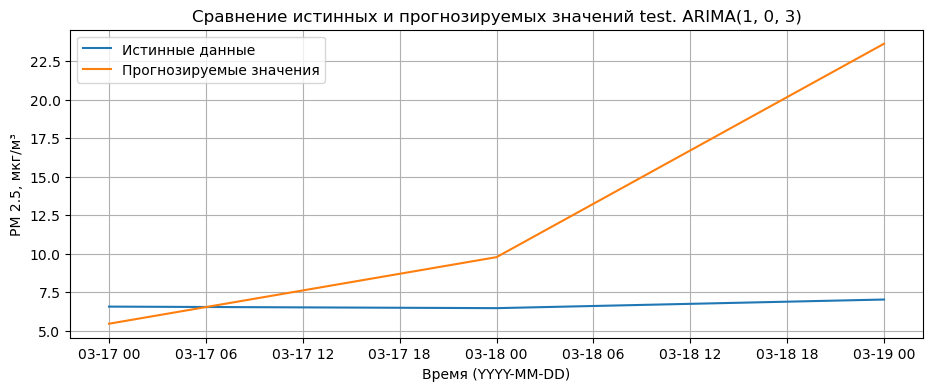

,Значение
MSE,96.12
MAE,7.01
MAPE,1.02
$R^2$,-1615.33


In [377]:
forecast.getModel(p = 1, d = 0, q = 3, exog_features = ['Wind_speed'], use_optimal = False, save = False)

### Лето 1

In [378]:
period = [f'2022-05-{i}' for i in range(20, 23)]
period

['2022-05-20', '2022-05-21', '2022-05-22']

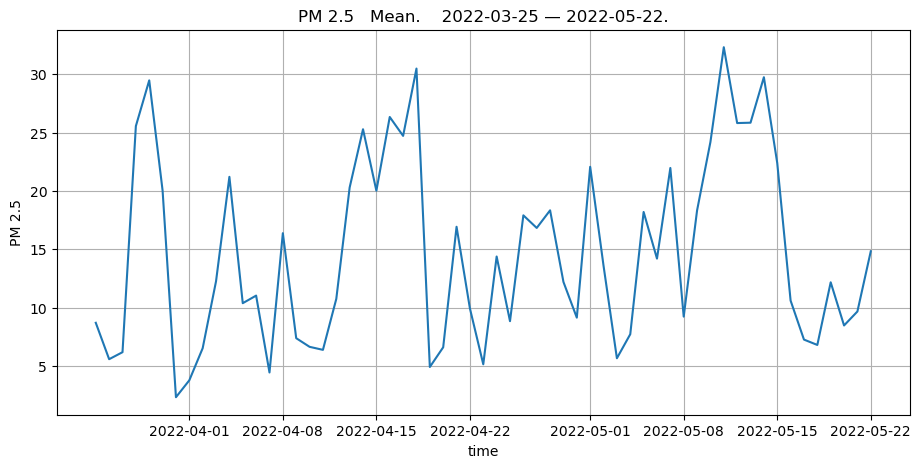

In [379]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-03-25", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

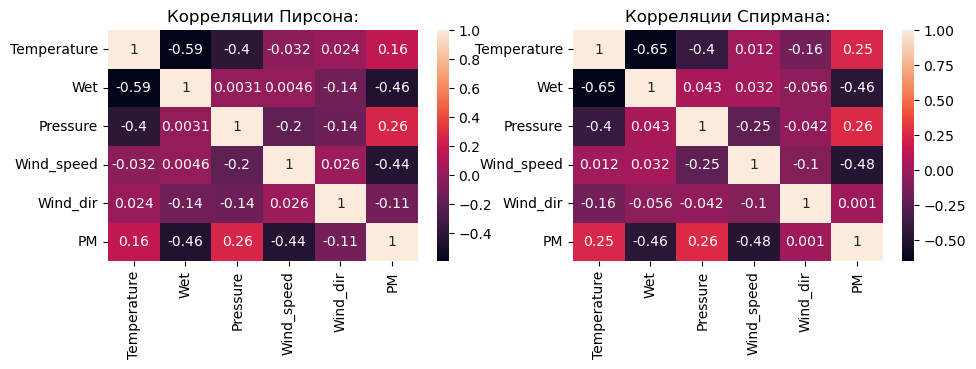

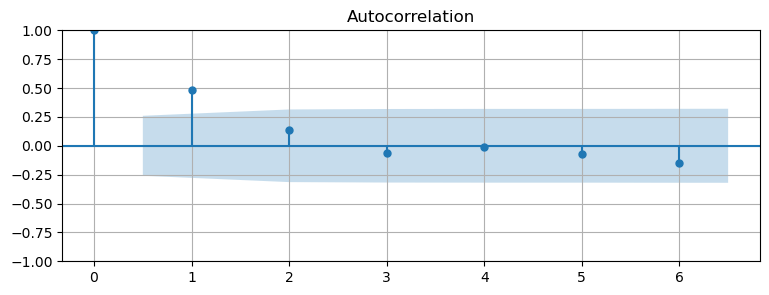

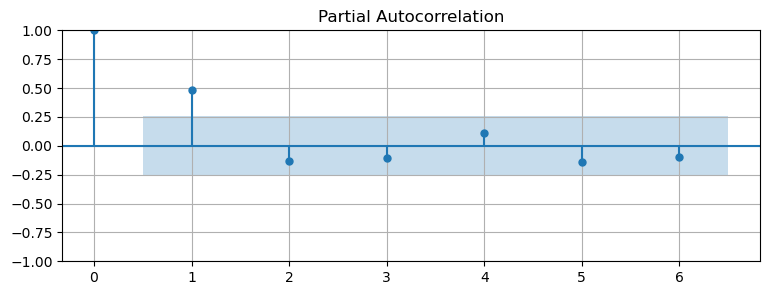

In [380]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-2.7970,1.012,-2.763,0.006,-4.781,-0.813
x2,-0.3505,0.096,-3.645,0.000,-0.539,-0.162
x3,-0.2339,0.161,-1.455,0.146,-0.549,0.081
x4,0.0557,0.008,6.572,0.000,0.039,0.072
ar.L1,-1.2211,0.355,-3.441,0.001,-1.917,-0.526
ar.L2,-0.5149,0.408,-1.263,0.207,-1.314,0.284
ma.L1,1.4267,0.308,4.628,0.000,0.822,2.031
ma.L2,0.7705,0.329,2.339,0.019,0.125,1.416
sigma2,34.7461,8.652,4.016,0.000,17.789,51.704


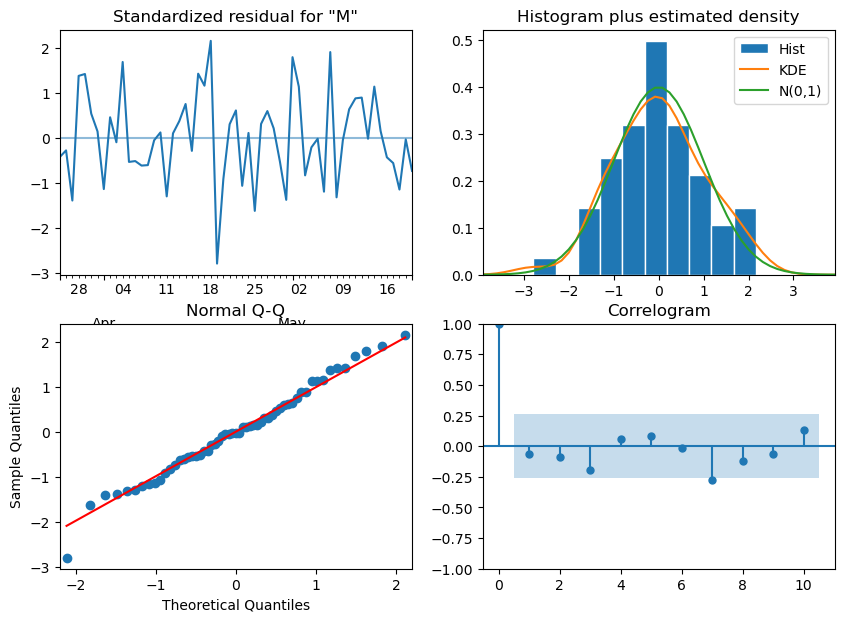

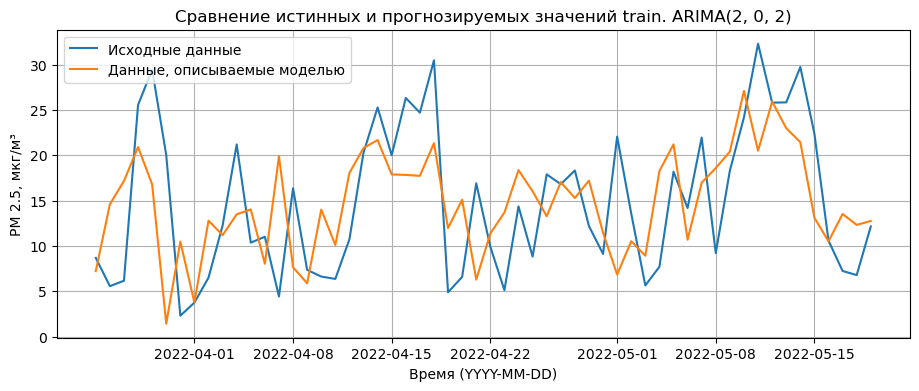

,Значение
MSE,51.91
MAE,5.85
MAPE,0.60
$R^2$,0.21


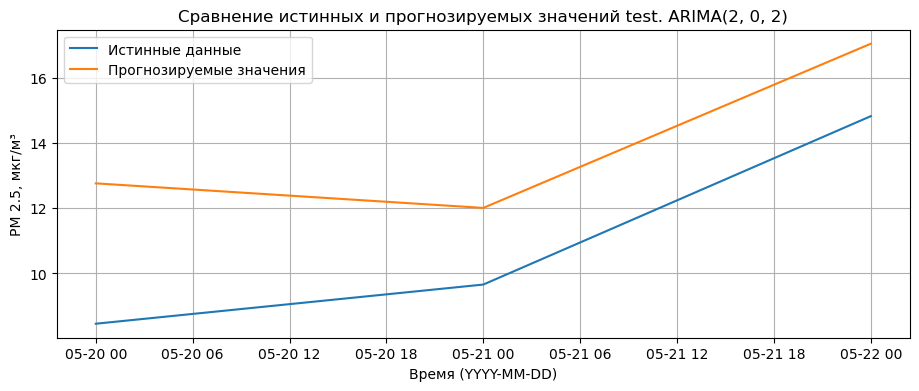

,Значение
MSE,9.65
MAE,2.96
MAPE,0.30
$R^2$,-0.27


In [383]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wind_speed', 'Wet', 'Temperature', 'Pressure'], use_optimal = False, save = False)

### 2

In [384]:
period = [f'2022-06-{i}' for i in range(20, 23)]
period

['2022-06-20', '2022-06-21', '2022-06-22']

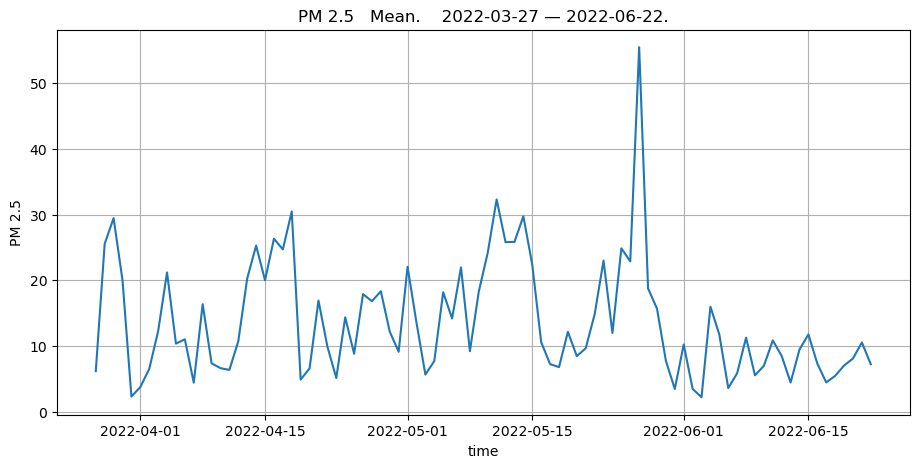

In [385]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-03-27", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

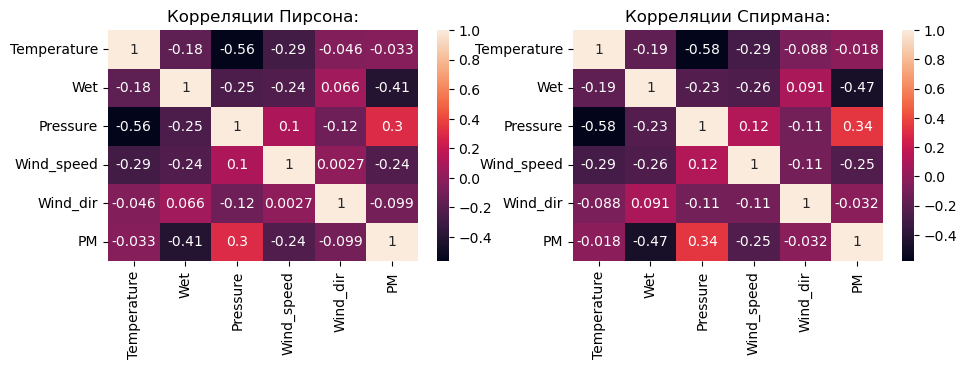

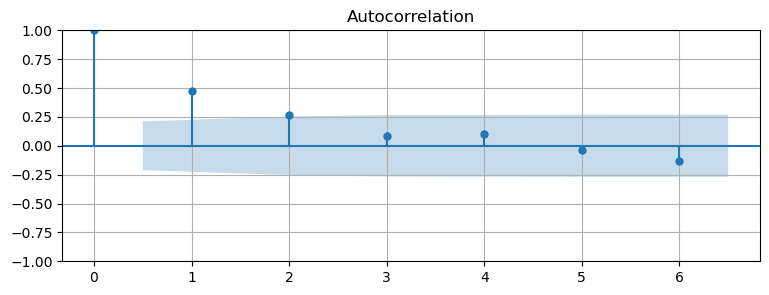

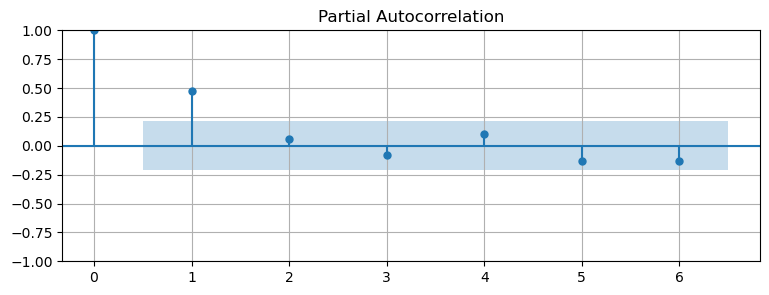

In [386]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,0.1680,0.061,2.773,0.006,0.049,0.287
ar.L1,-0.0946,0.408,-0.232,0.816,-0.894,0.705
ar.L2,0.5661,0.416,1.361,0.174,-0.249,1.382
ma.L1,0.6990,0.434,1.612,0.107,-0.151,1.549
ma.L2,0.0057,0.252,0.023,0.982,-0.489,0.500
sigma2,70.2870,11.430,6.149,0.000,47.884,92.690


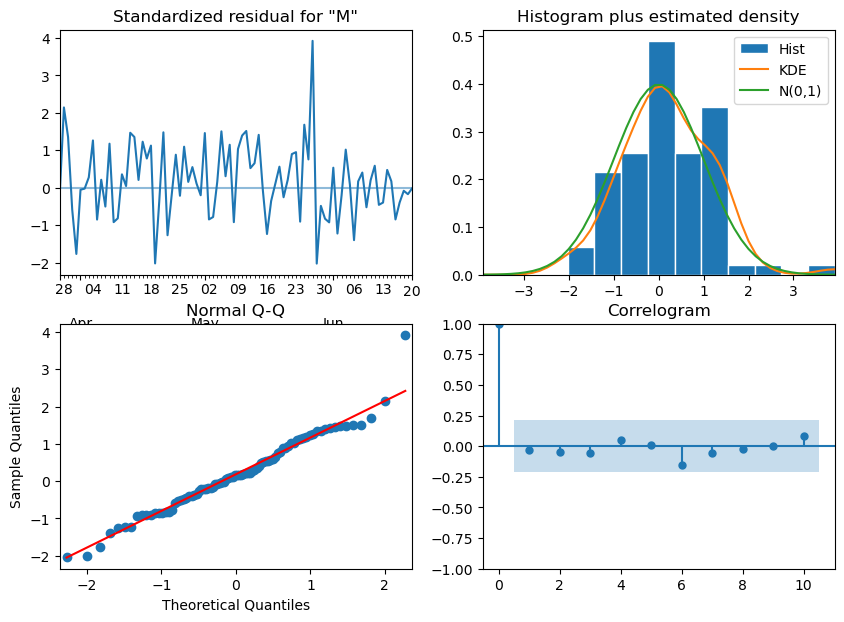

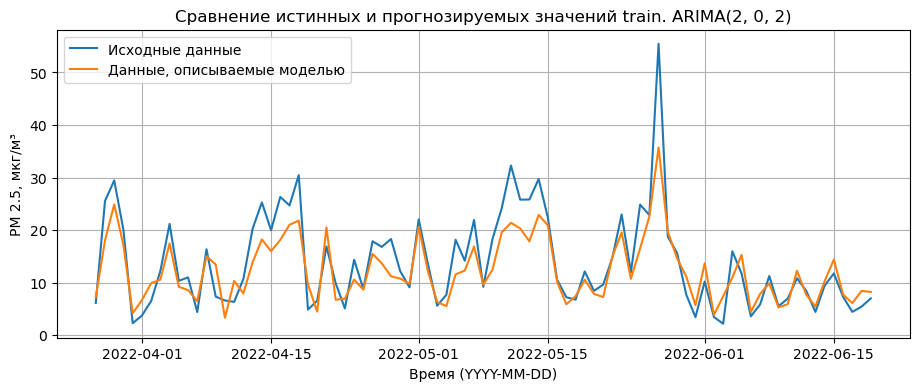

,Значение
MSE,19.05
MAE,3.19
MAPE,0.27
$R^2$,0.76


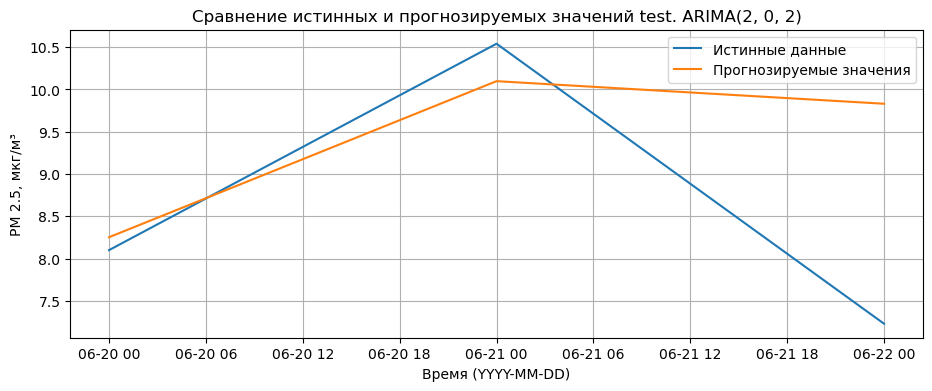

,Значение
MSE,2.33
MAE,1.07
MAPE,0.14
$R^2$,-0.19


In [389]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wet'], use_optimal = False, save = False)

### 3

In [390]:
period = [f'2022-07-{i}' for i in range(20, 23)]
period

['2022-07-20', '2022-07-21', '2022-07-22']

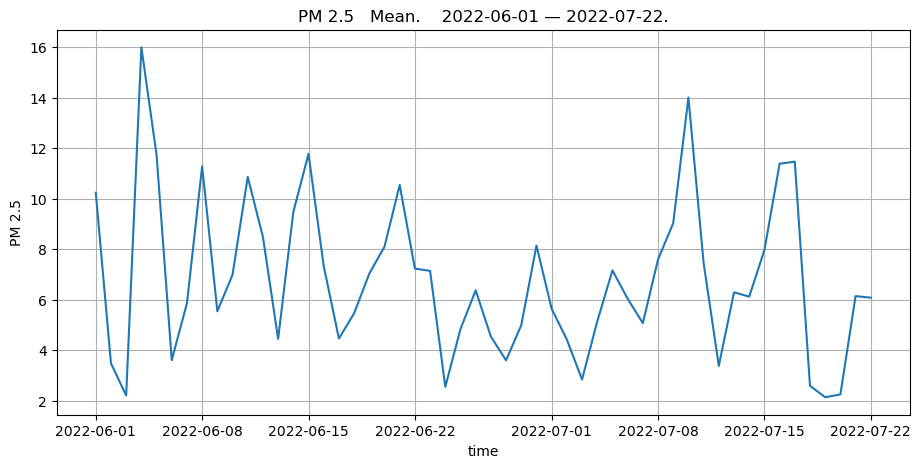

In [391]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-06-01", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

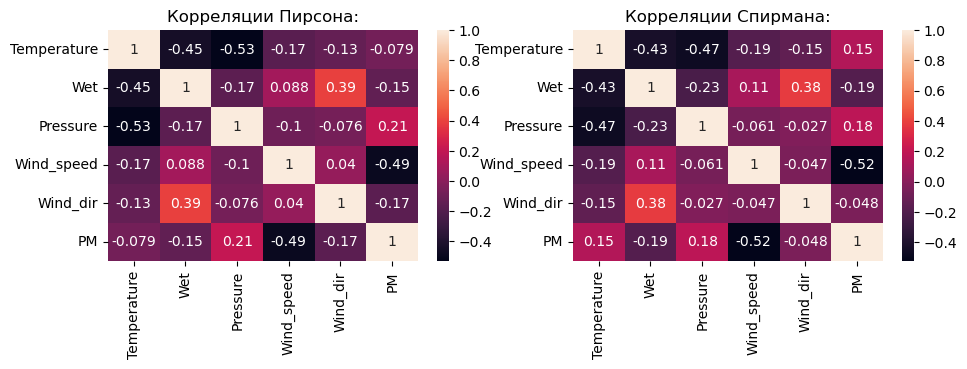

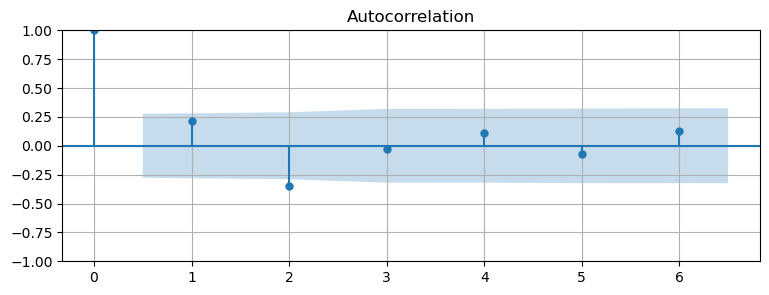

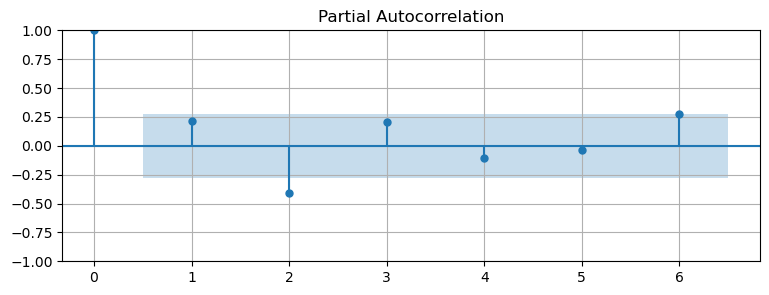

In [392]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,1.1065,0.267,4.141,0.000,0.583,1.630
ar.L1,-0.4596,0.211,-2.173,0.030,-0.874,-0.045
ar.L2,-0.0586,0.187,-0.313,0.754,-0.426,0.309
ma.L1,1.5916,42.137,0.038,0.970,-80.996,84.179
ma.L2,0.9998,52.929,0.019,0.985,-102.740,104.739
sigma2,14.1362,746.933,0.019,0.985,-1449.826,1478.098


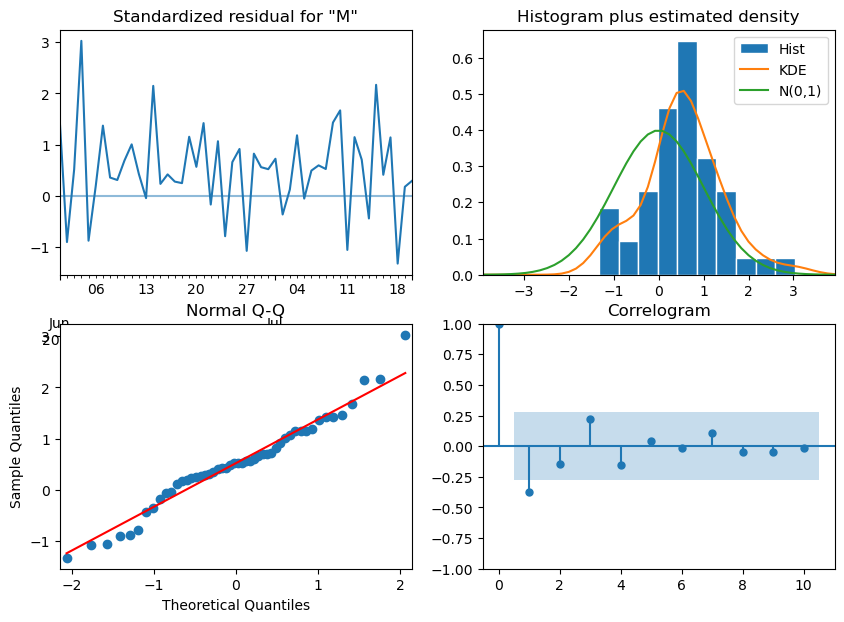

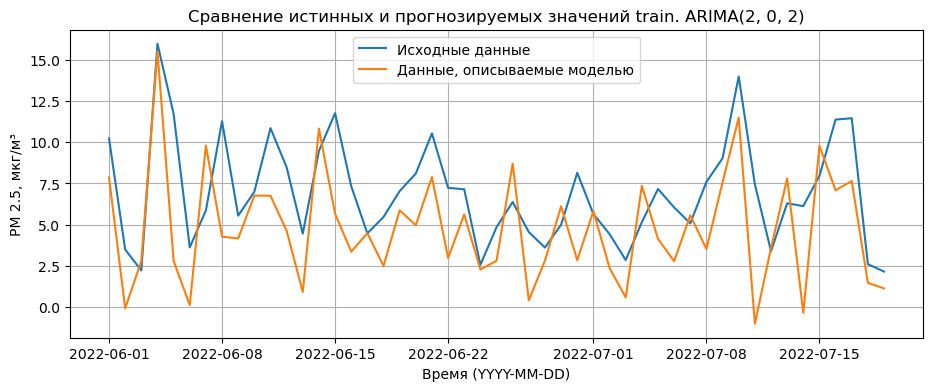

,Значение
MSE,12.18
MAE,2.80
MAPE,0.42
$R^2$,-0.22


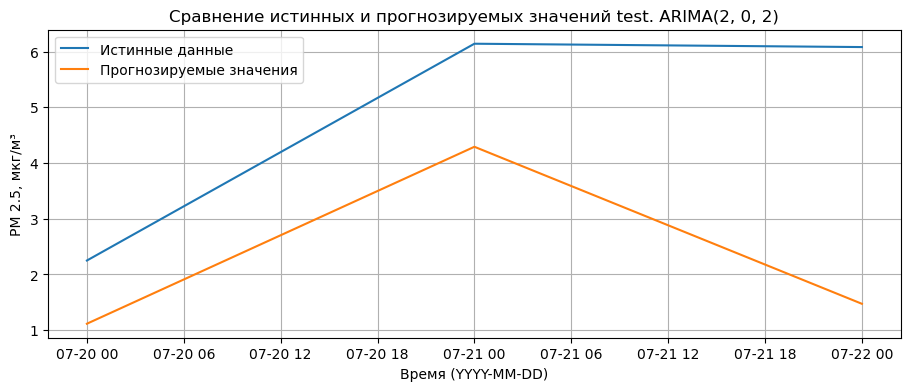

,Значение
MSE,8.64
MAE,2.53
MAPE,0.52
$R^2$,-1.61


In [396]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wind_speed'], use_optimal = False, save = False)

### 4

In [397]:
period = [f'2023-05-{i}' for i in range(10, 13)]
period

['2023-05-10', '2023-05-11', '2023-05-12']

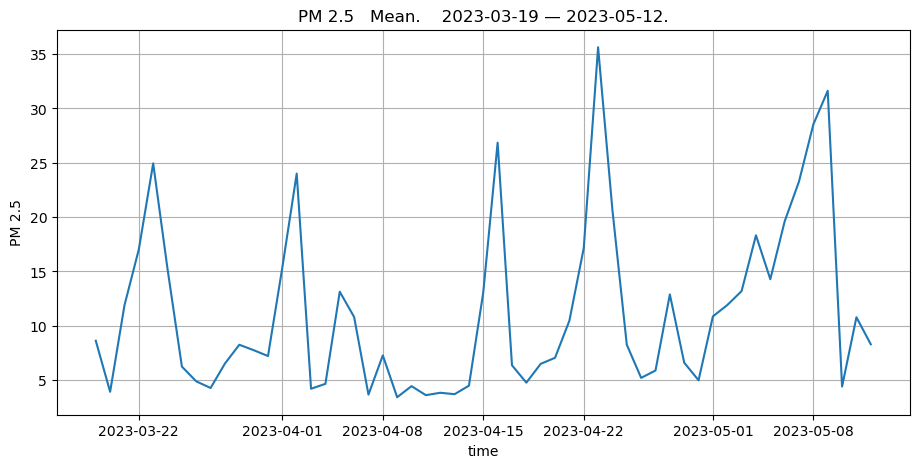

In [398]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-03-19", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

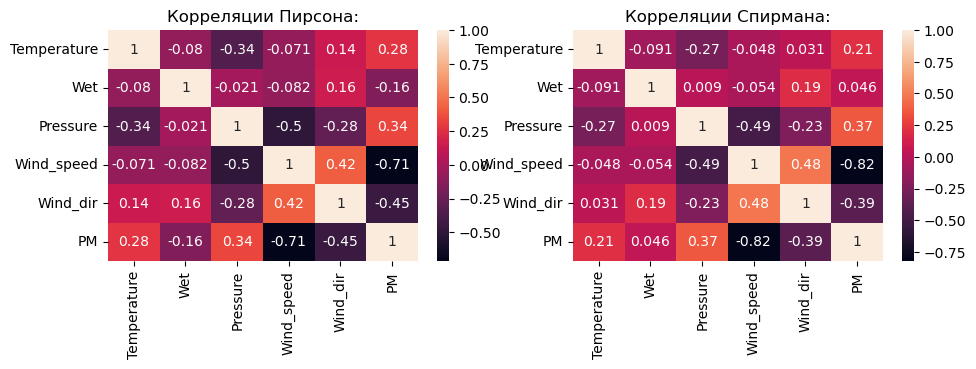

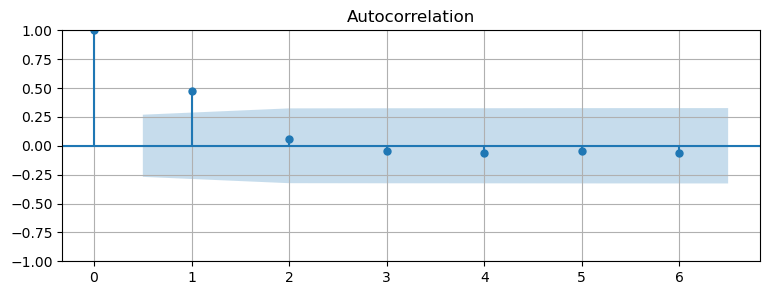

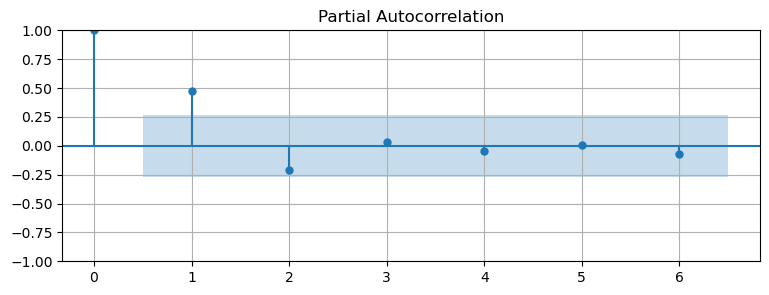

In [399]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-19.4035,5.477,-3.543,0.000,-30.139,-8.668
x2,-0.1625,0.159,-1.025,0.306,-0.473,0.148
x3,0.0712,0.010,7.464,0.000,0.053,0.090
ar.L1,-0.3012,6.146,-0.049,0.961,-12.348,11.745
ar.L2,0.1424,1.519,0.094,0.925,-2.834,3.119
ma.L1,0.4434,6.178,0.072,0.943,-11.665,12.552
ma.L2,-0.1094,2.085,-0.052,0.958,-4.197,3.978
sigma2,31.8975,7.693,4.146,0.000,16.820,46.975


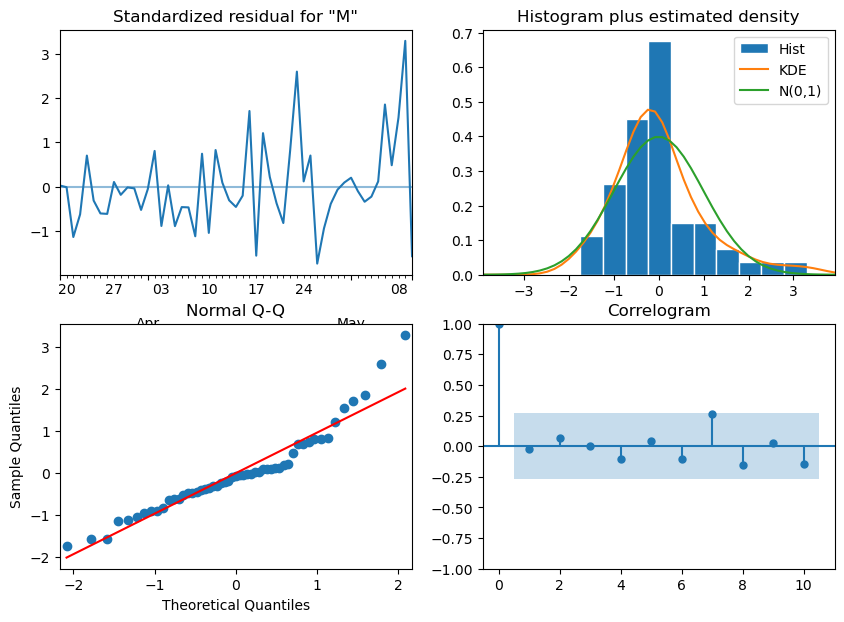

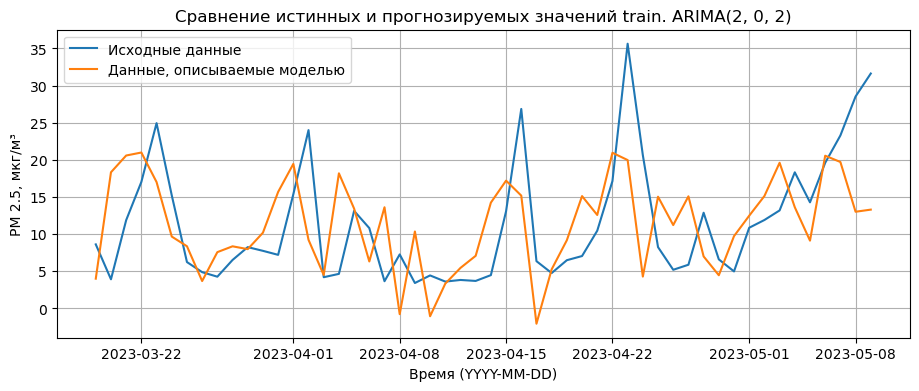

,Значение
MSE,58.68
MAE,6.07
MAPE,0.72
$R^2$,0.09


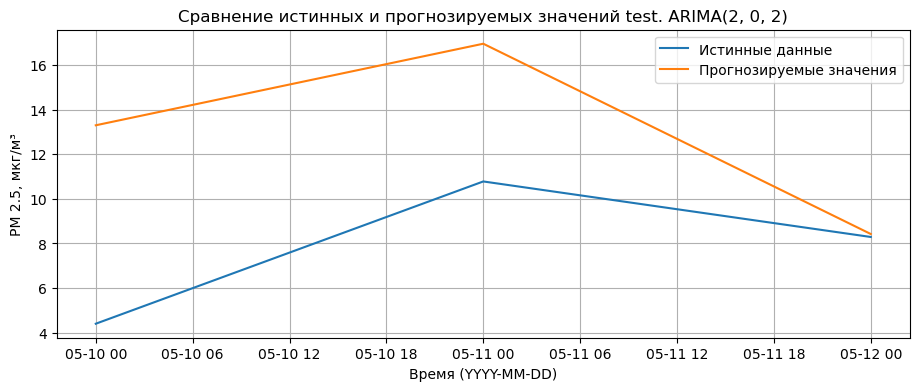

,Значение
MSE,39.12
MAE,5.07
MAPE,0.87
$R^2$,-4.67


In [402]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Wind_dir', 'Pressure'], use_optimal = False, save = False)

### 5

In [403]:
period = [f'2023-06-{i}' for i in range(10, 13)]
period

['2023-06-10', '2023-06-11', '2023-06-12']

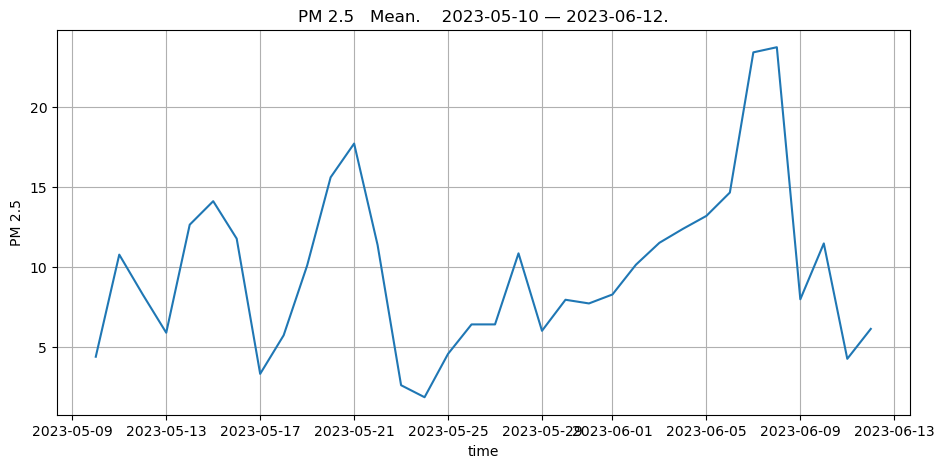

In [404]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-05-10", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

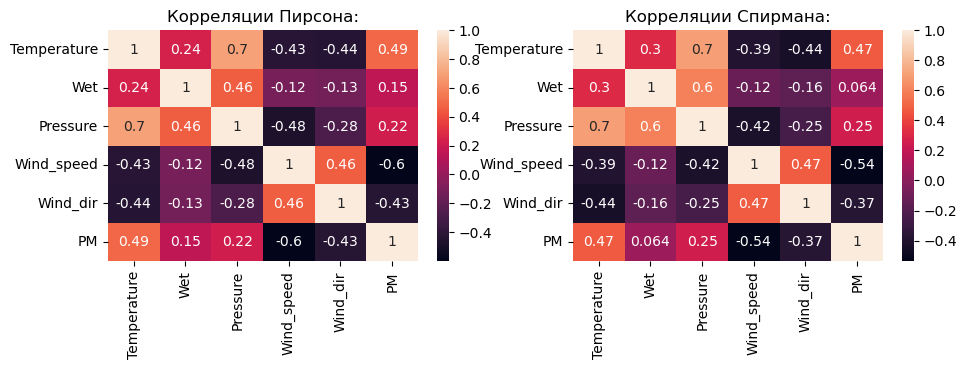

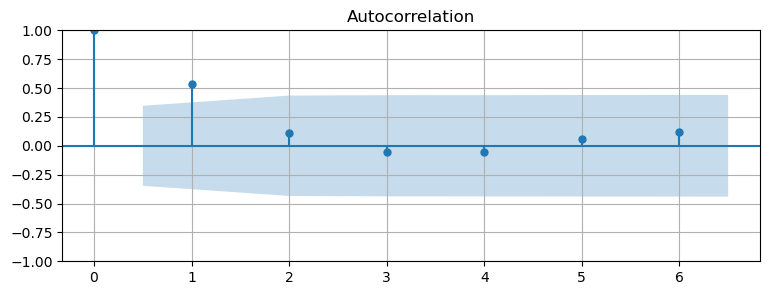

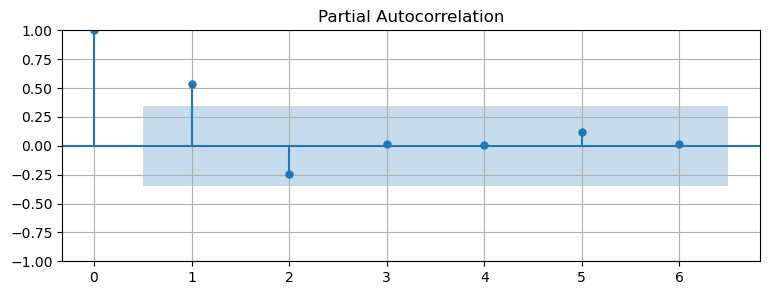

In [405]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,0.7423,1.956,0.380,0.704,-3.091,4.575
x2,0.8104,0.256,3.167,0.002,0.309,1.312
ar.L1,0.3874,6.305,0.061,0.951,-11.970,12.745
ar.L2,-0.0426,0.826,-0.052,0.959,-1.661,1.576
ma.L1,0.0949,6.335,0.015,0.988,-12.322,12.512
ma.L2,-0.2007,3.593,-0.056,0.955,-7.243,6.842
sigma2,17.0967,6.347,2.694,0.007,4.656,29.537


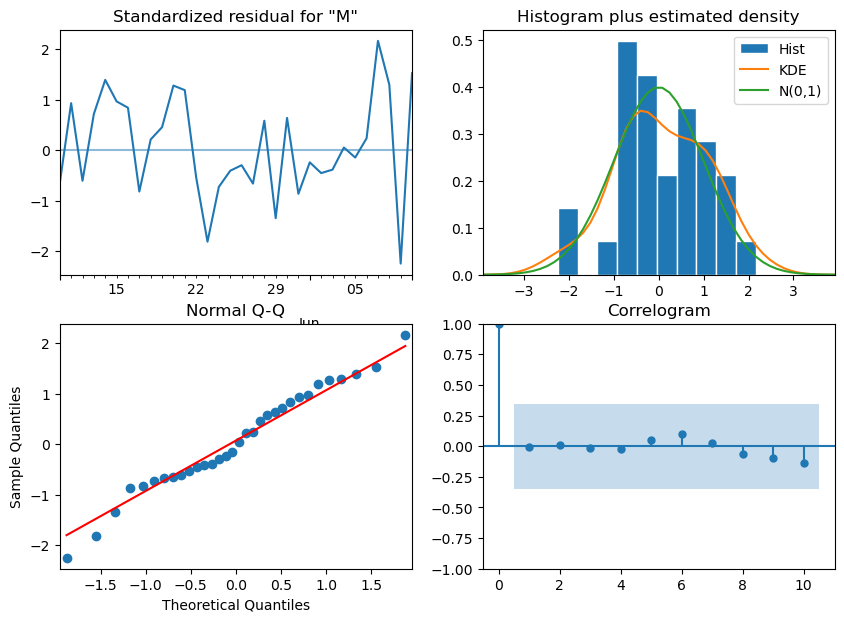

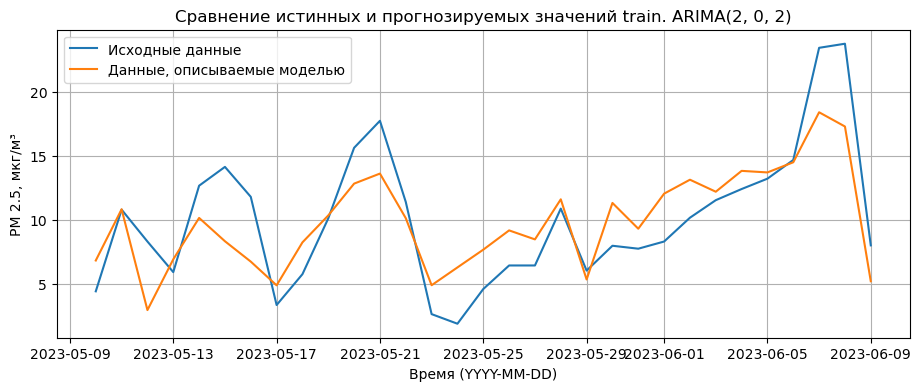

,Значение
MSE,9.57
MAE,2.55
MAPE,0.36
$R^2$,0.65


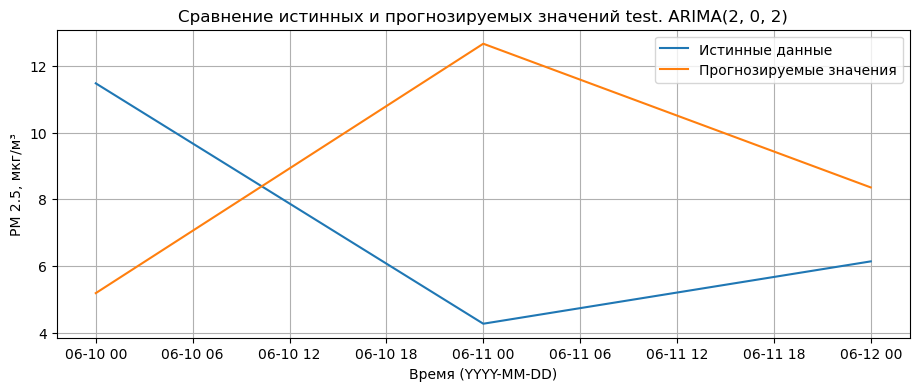

,Значение
MSE,38.35
MAE,5.64
MAPE,0.96
$R^2$,-3.11


In [412]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Temperature'], use_optimal = False, save = False)

### 6

In [413]:
period = [f'2023-07-{i}' for i in range(10, 13)]
period

['2023-07-10', '2023-07-11', '2023-07-12']

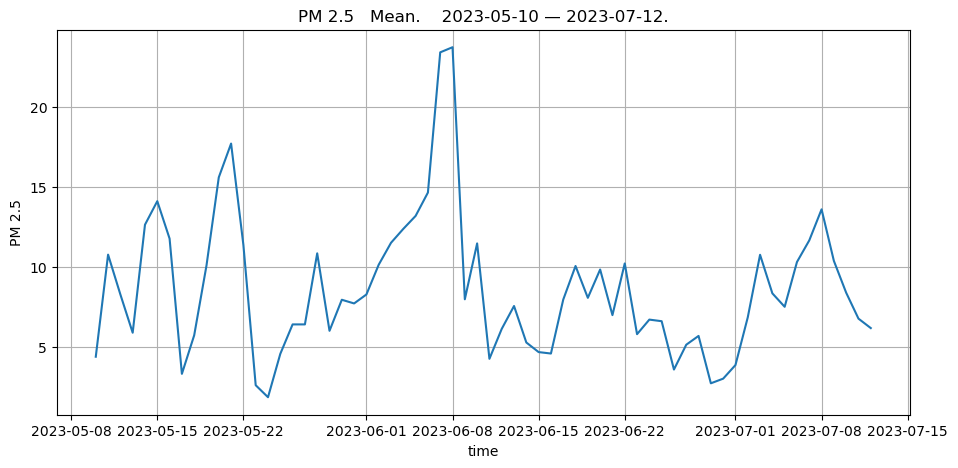

In [414]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-05-10", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

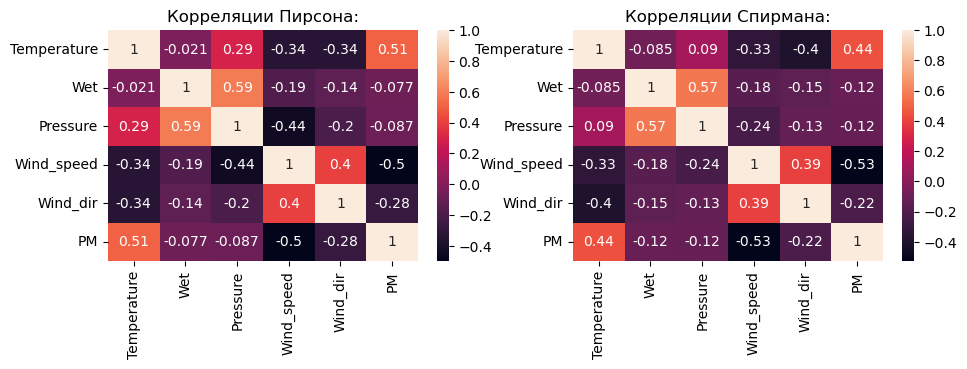

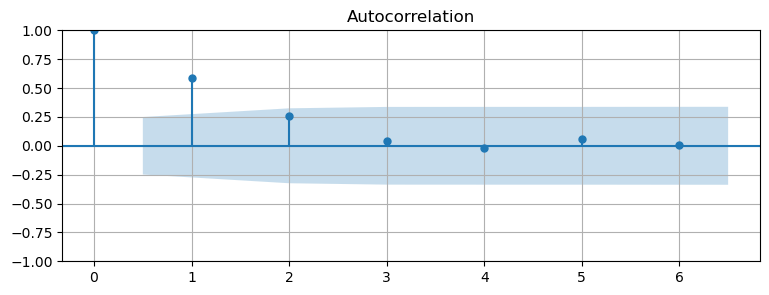

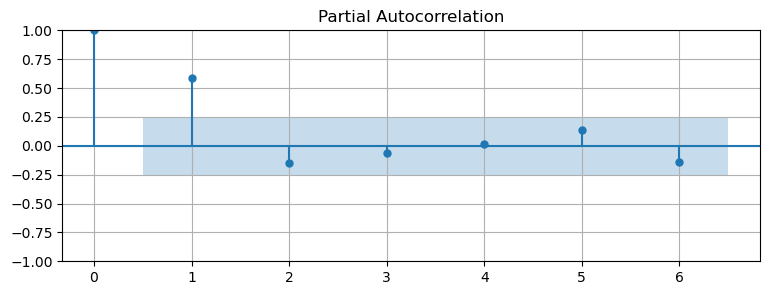

In [415]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,0.1465,1.307,0.112,0.911,-2.416,2.709
x2,0.8181,0.177,4.633,0.000,0.472,1.164
ar.L1,0.5201,0.457,1.138,0.255,-0.376,1.416
ar.L2,-0.5874,0.300,-1.958,0.050,-1.175,0.001
ma.L1,-0.1399,0.448,-0.312,0.755,-1.018,0.738
ma.L2,0.6240,0.296,2.108,0.035,0.044,1.204
sigma2,11.3432,1.941,5.845,0.000,7.539,15.147


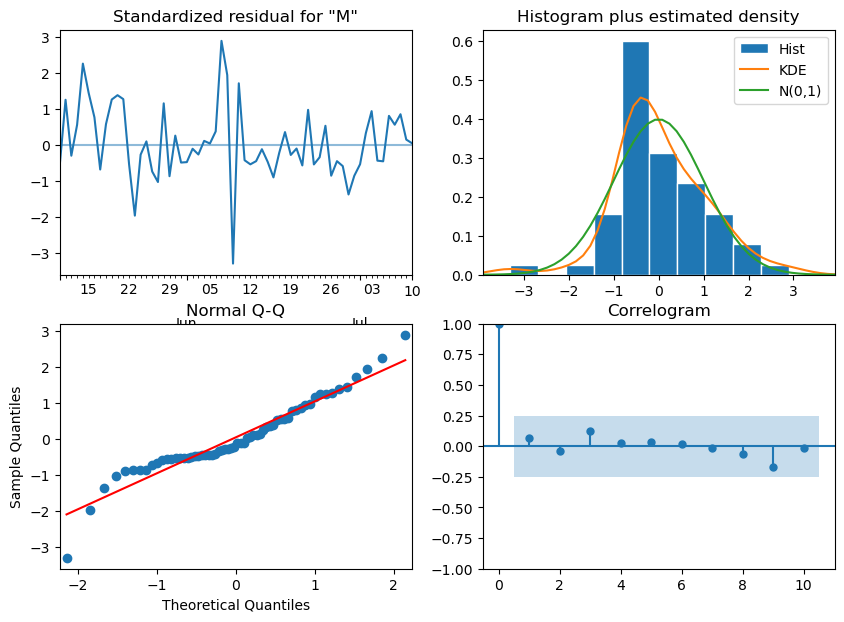

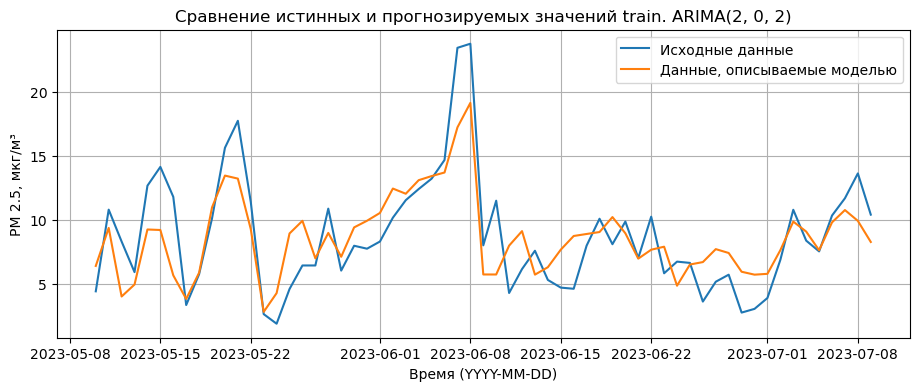

,Значение
MSE,6.95
MAE,2.13
MAPE,0.31
$R^2$,0.65


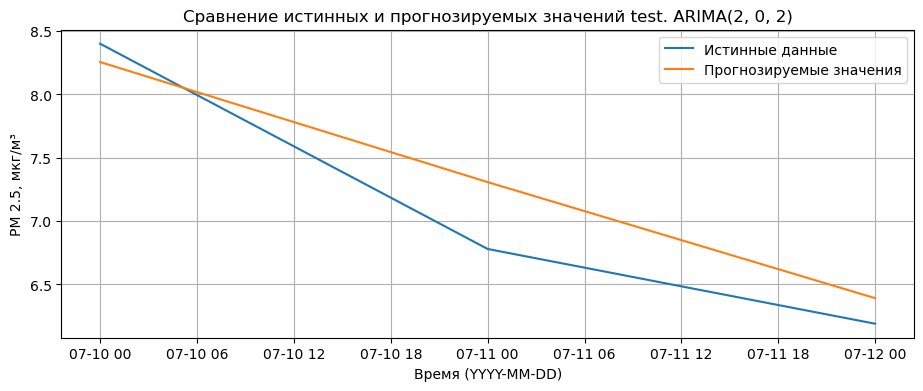

,Значение
MSE,0.11
MAE,0.29
MAPE,0.04
$R^2$,0.87


In [416]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Temperature'], use_optimal = False, save = False)

### Осень 1

In [417]:
period = [f'2022-08-{i}' for i in range(12, 15)]
period

['2022-08-12', '2022-08-13', '2022-08-14']

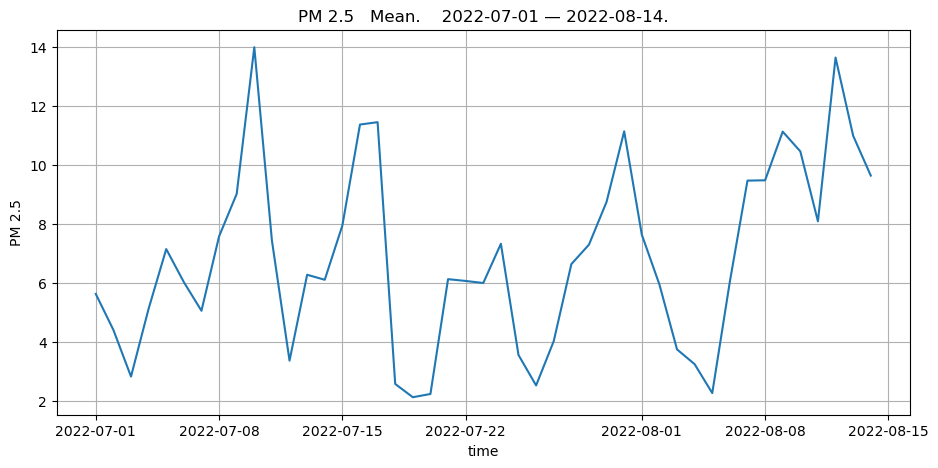

In [418]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-07-01", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

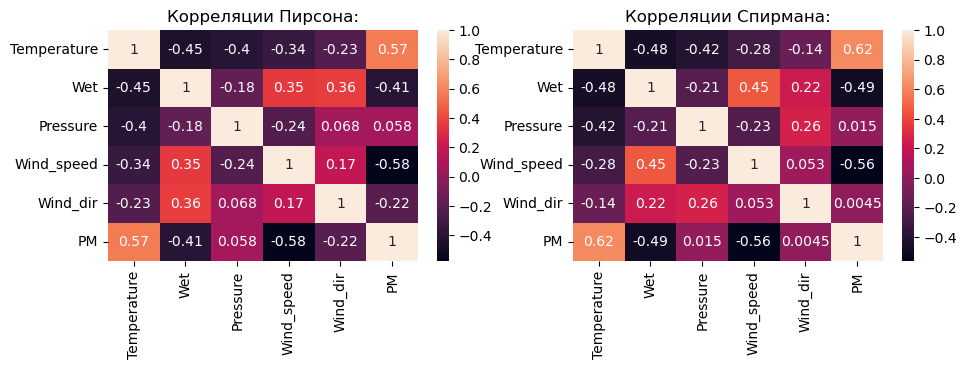

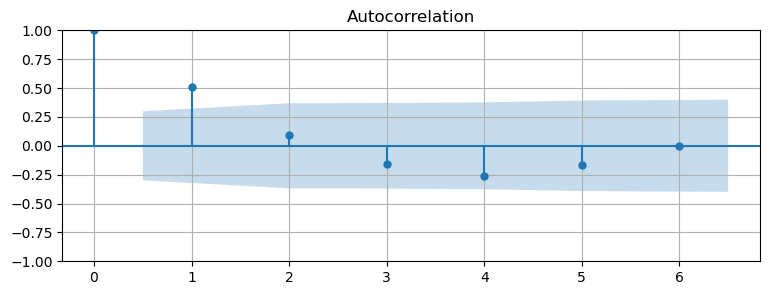

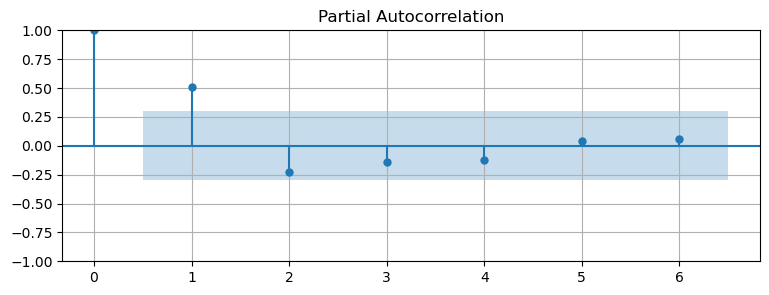

In [419]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-1.7431,0.628,-2.774,0.006,-2.975,-0.512
ar.L1,1.4249,0.334,4.263,0.000,0.770,2.080
ar.L2,-0.4250,0.334,-1.273,0.203,-1.079,0.229
ma.L1,-0.7011,0.420,-1.668,0.095,-1.525,0.123
ma.L2,-0.2366,0.267,-0.885,0.376,-0.760,0.287
sigma2,4.7534,1.028,4.625,0.000,2.739,6.768


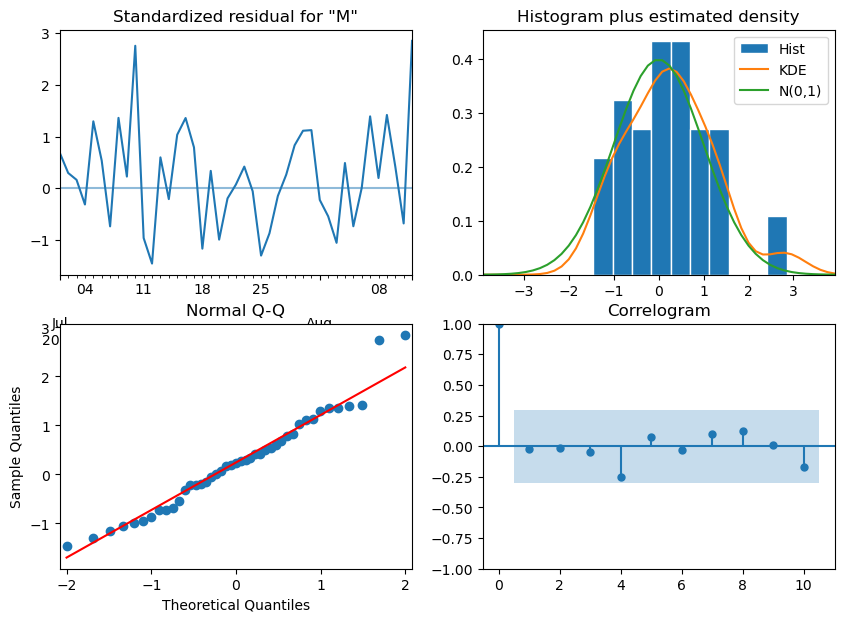

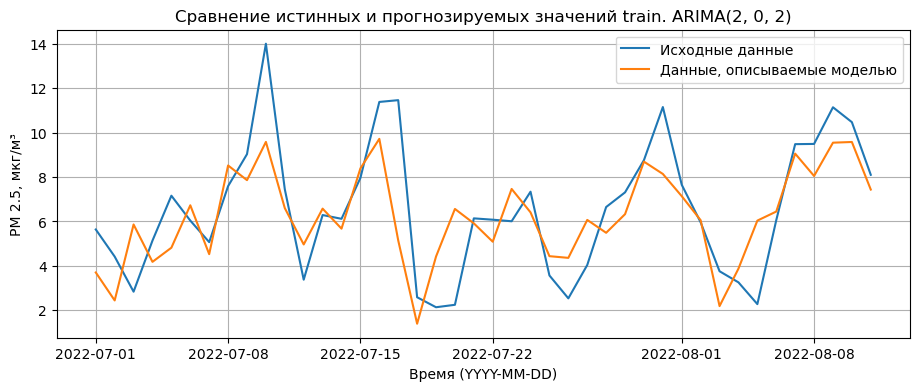

,Значение
MSE,3.91
MAE,1.50
MAPE,0.32
$R^2$,0.54


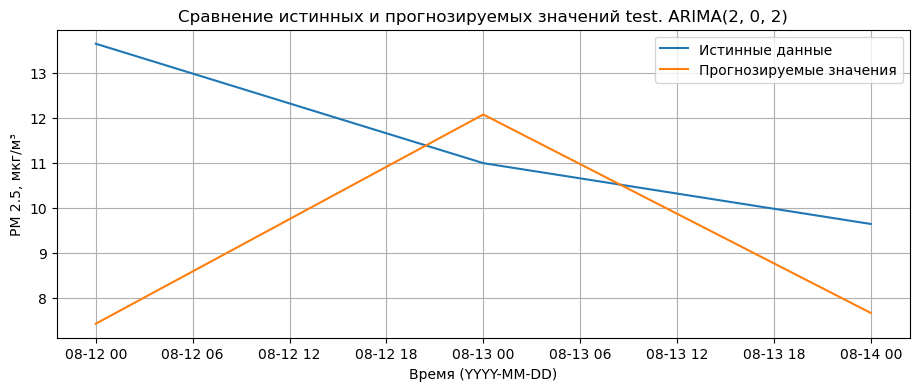

,Значение
MSE,14.56
MAE,3.09
MAPE,0.25
$R^2$,-4.27


In [427]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = ['Wind_speed'], use_optimal = False, save = False)

### 2

In [428]:
period = [f'2022-09-{i}' for i in range(12, 15)]
period

['2022-09-12', '2022-09-13', '2022-09-14']

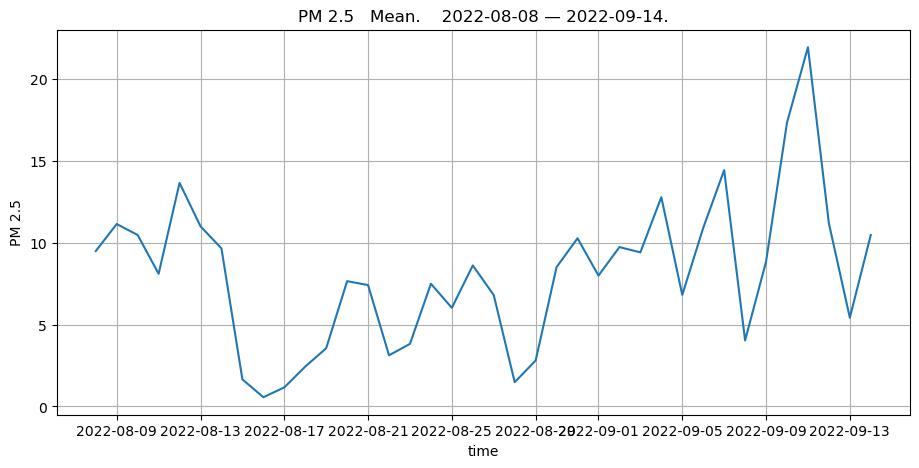

In [429]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-08-08", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

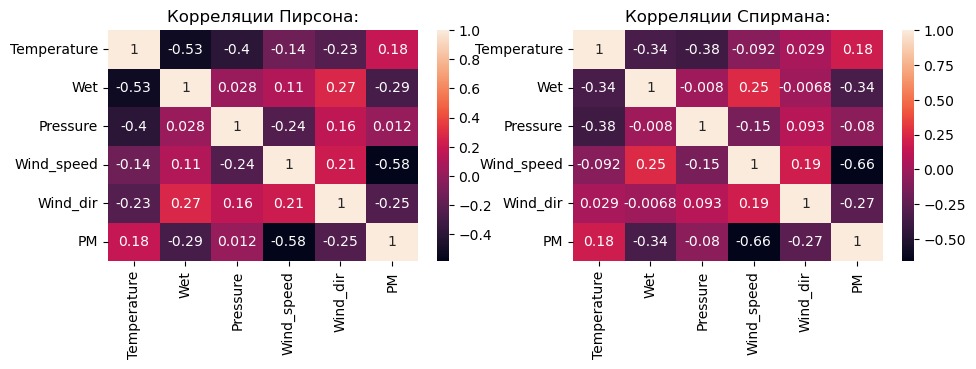

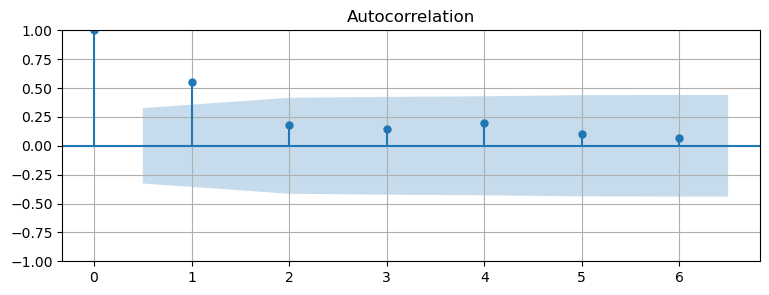

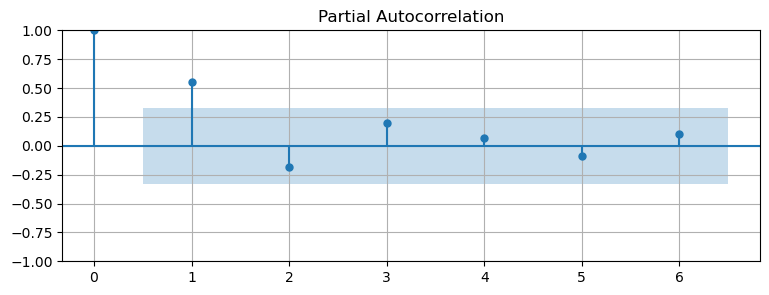

In [430]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-0.6821,0.337,-2.022,0.043,-1.343,-0.021
x2,0.1217,0.027,4.577,0.000,0.070,0.174
ar.L1,0.8772,2.323,0.378,0.706,-3.676,5.431
ar.L2,-0.0732,1.326,-0.055,0.956,-2.672,2.525
ma.L1,-0.0556,2.282,-0.024,0.981,-4.529,4.418
ma.L2,-0.2852,0.709,-0.402,0.687,-1.674,1.104
sigma2,11.2846,3.465,3.257,0.001,4.494,18.075


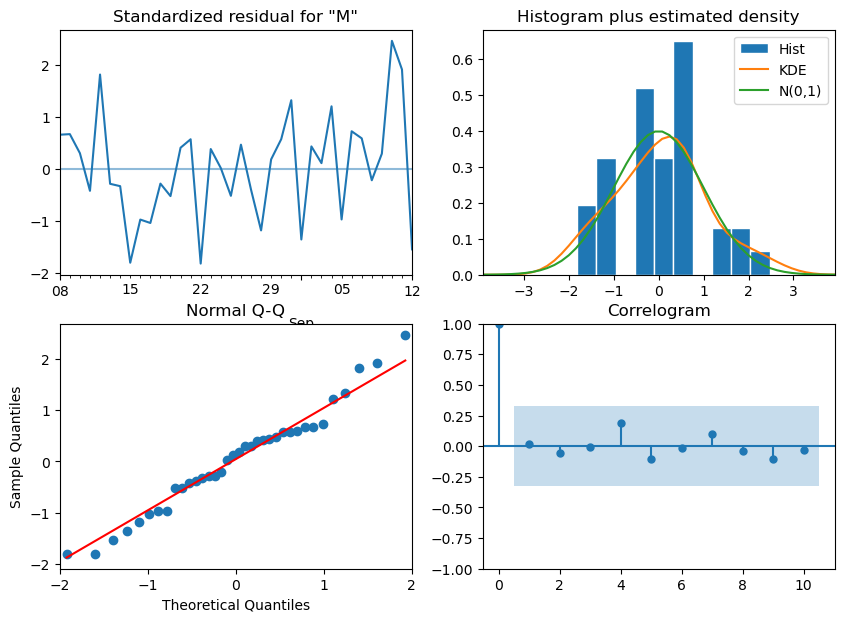

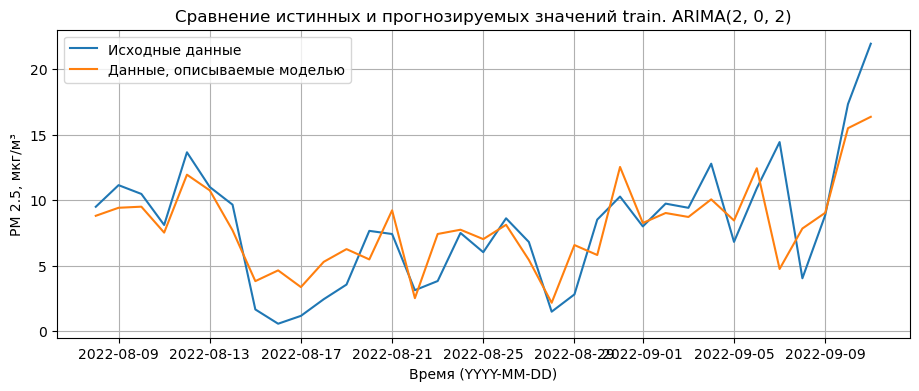

,Значение
MSE,7.46
MAE,2.04
MAPE,0.58
$R^2$,0.65


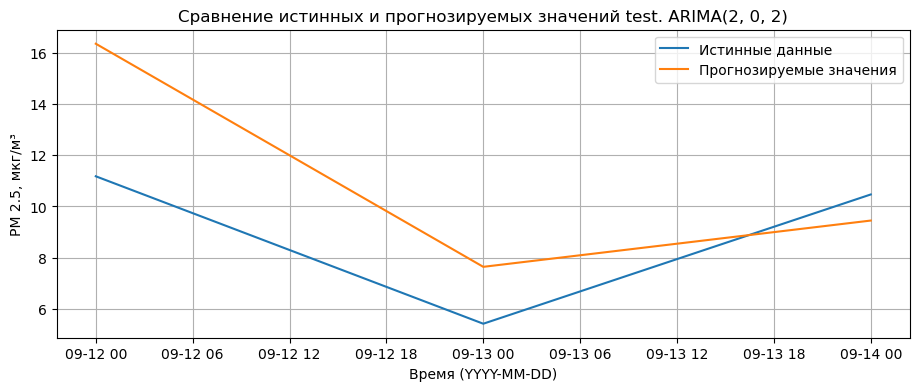

,Значение
MSE,10.93
MAE,2.81
MAPE,0.32
$R^2$,-0.66


In [434]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Wet'], use_optimal = False, save = False)

### 3

In [435]:
period = [f'2022-10-{i}' for i in range(12, 15)]
period

['2022-10-12', '2022-10-13', '2022-10-14']

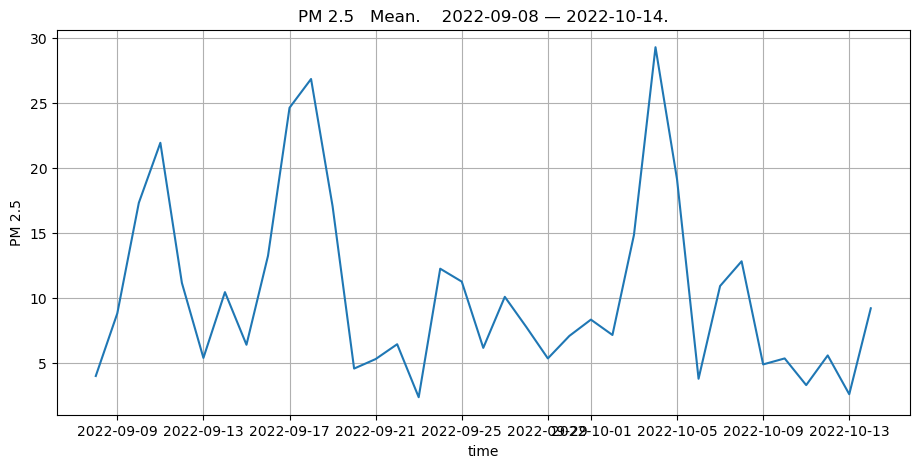

In [436]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2022-09-08", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

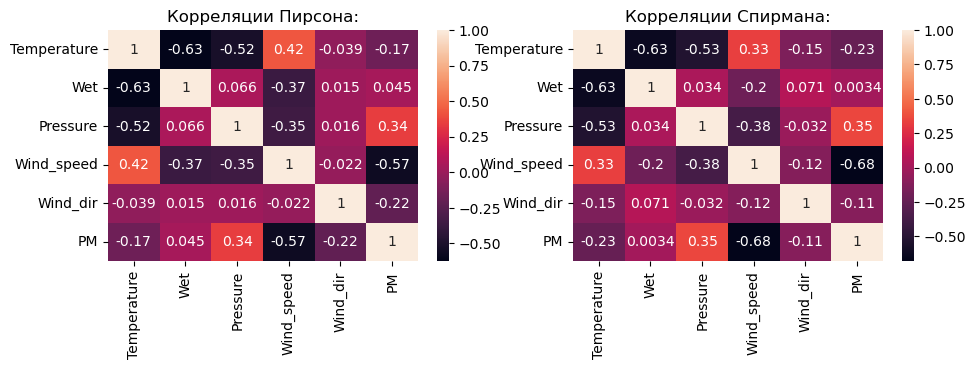

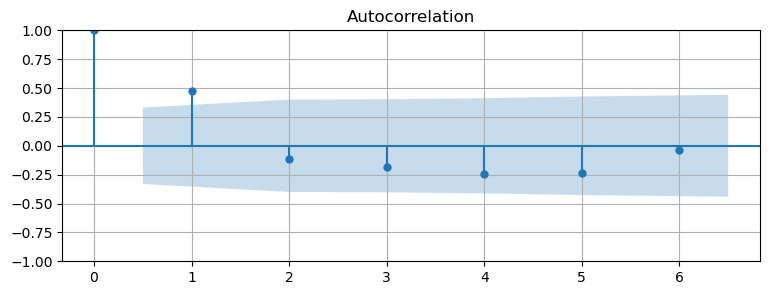

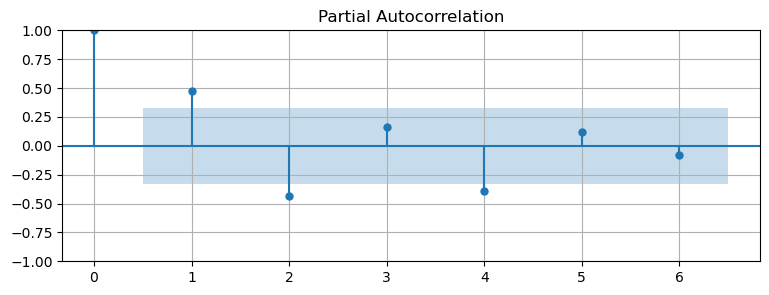

In [437]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-0.9833,0.900,-1.092,0.275,-2.747,0.781
ar.L1,0.5627,0.861,0.653,0.514,-1.126,2.251
ar.L2,-0.0437,0.952,-0.046,0.963,-1.909,1.822
ar.L3,0.2825,0.633,0.446,0.655,-0.958,1.523
ar.L4,0.0794,0.580,0.137,0.891,-1.057,1.216
ma.L1,0.6419,0.852,0.753,0.451,-1.029,2.313
sigma2,27.5966,8.050,3.428,0.001,11.818,43.375


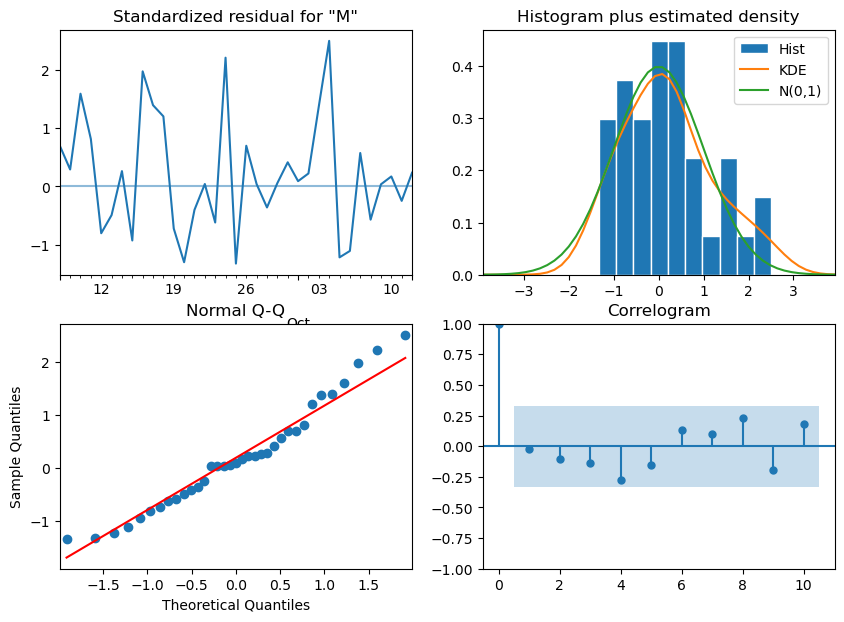

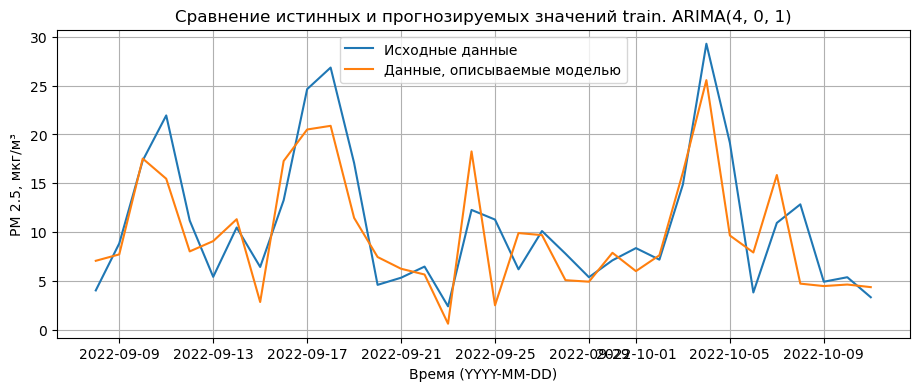

,Значение
MSE,16.38
MAE,3.16
MAPE,0.34
$R^2$,0.65


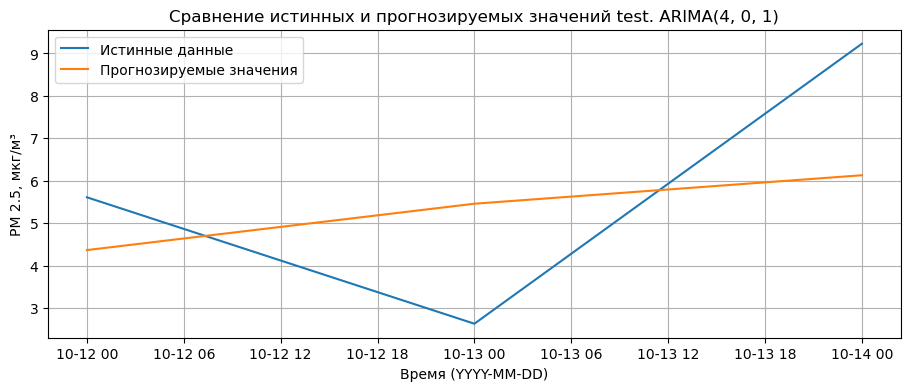

,Значение
MSE,6.39
MAE,2.39
MAPE,0.54
$R^2$,0.12


In [439]:
forecast.getModel(p = 4, d = 0, q = 1, exog_features = [ 'Wind_speed'], use_optimal = False, save = False)

### 4

In [440]:
period = [f'2023-08-{i}' for i in range(23, 26)]
period

['2023-08-23', '2023-08-24', '2023-08-25']

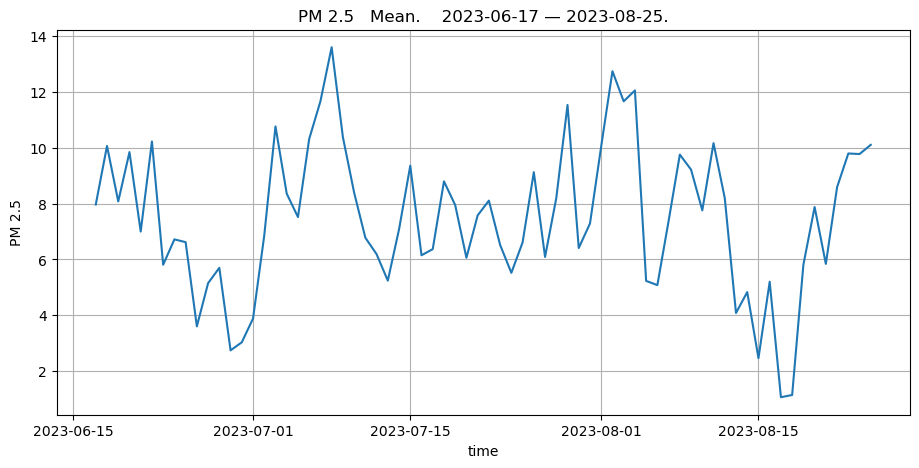

In [441]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-06-17", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

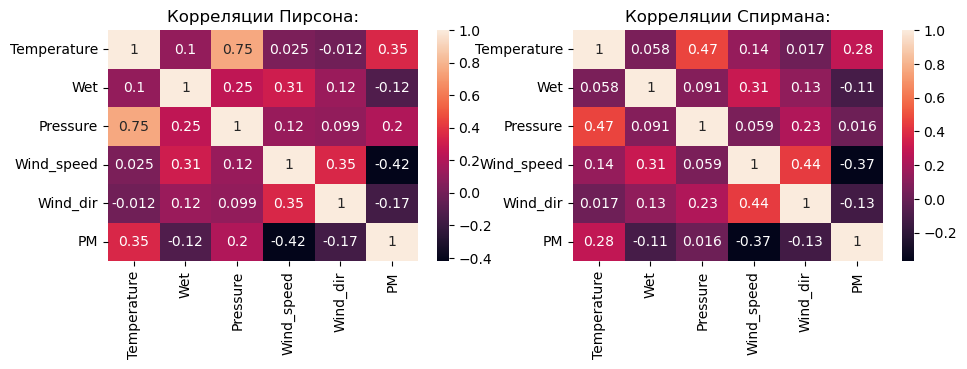

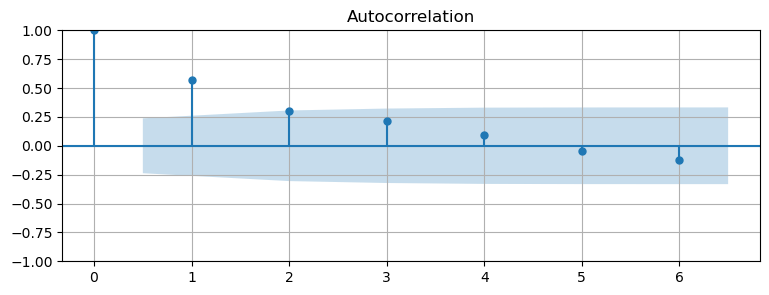

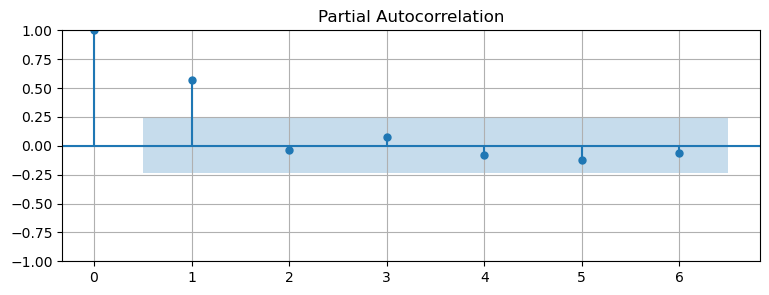

In [442]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-8.2666,1.611,-5.131,0.000,-11.424,-5.109
x2,0.8078,0.235,3.432,0.001,0.346,1.269
ar.L1,0.4441,0.152,2.914,0.004,0.145,0.743
ar.L2,0.5552,0.152,3.650,0.000,0.257,0.853
ma.L1,0.1637,1.428,0.115,0.909,-2.635,2.962
ma.L2,-0.8323,1.174,-0.709,0.479,-3.134,1.470
sigma2,3.7899,4.995,0.759,0.448,-6.001,13.580


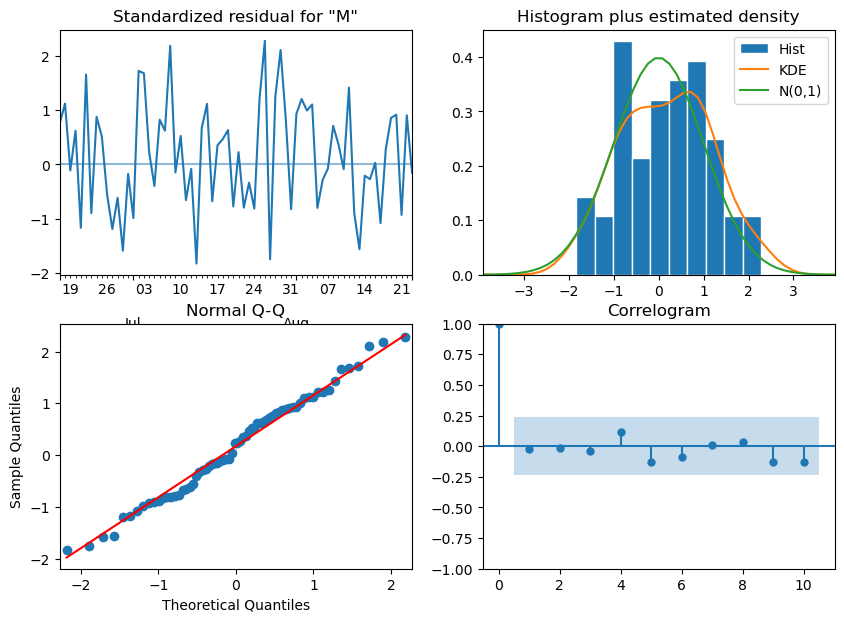

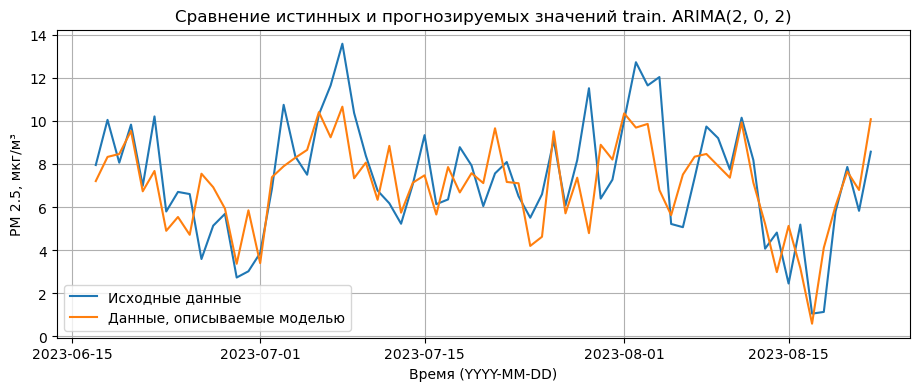

,Значение
MSE,3.60
MAE,1.43
MAPE,0.25
$R^2$,0.49


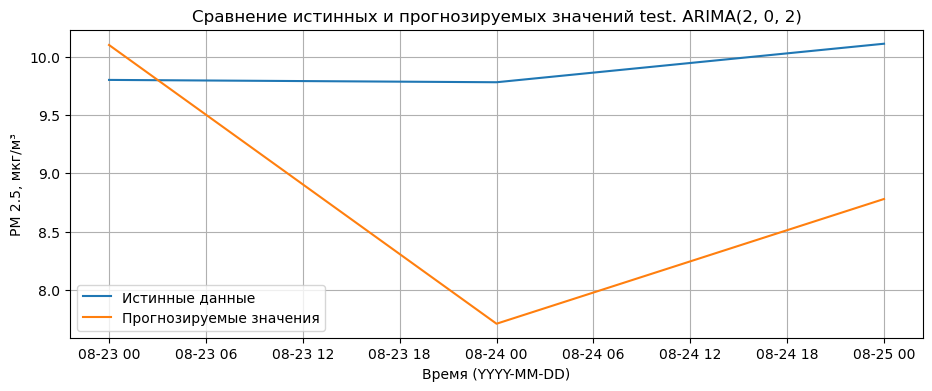

,Значение
MSE,2.05
MAE,1.23
MAPE,0.12
$R^2$,-88.64


In [444]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [ 'Wind_speed', 'Temperature'], use_optimal = False, save = False)

### 5

In [445]:
period = [f'2023-09-{i}' for i in range(23, 26)]
period

['2023-09-23', '2023-09-24', '2023-09-25']

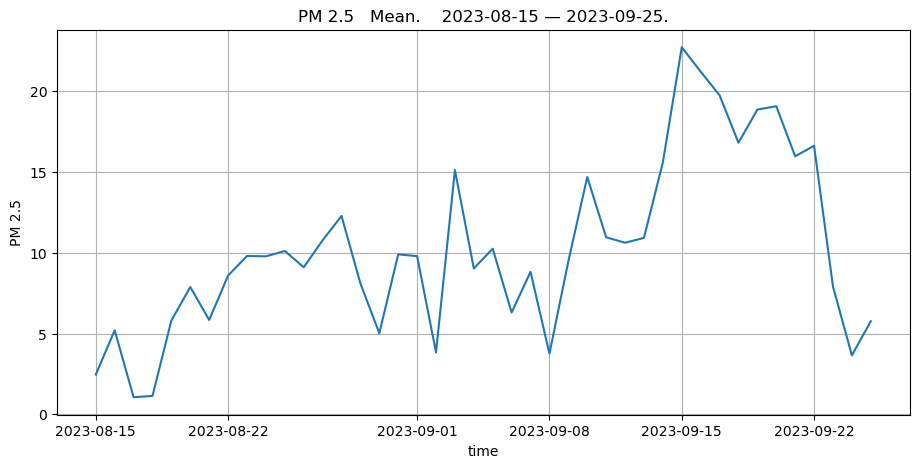

In [446]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-08-15", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

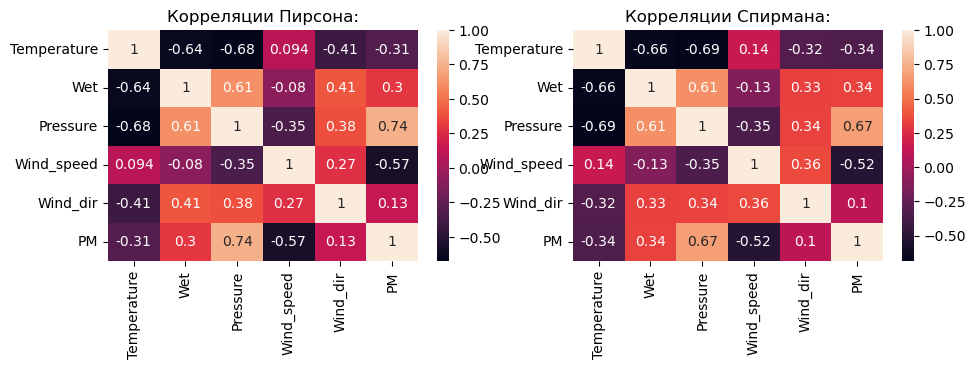

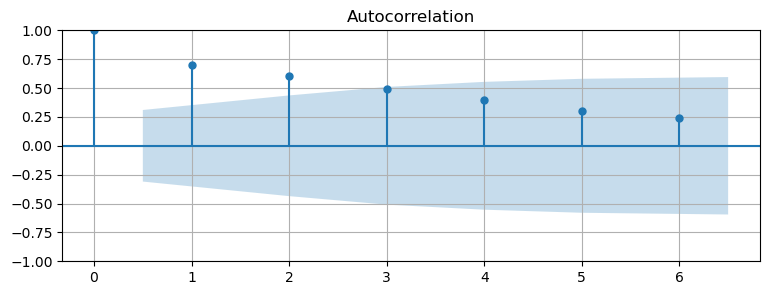

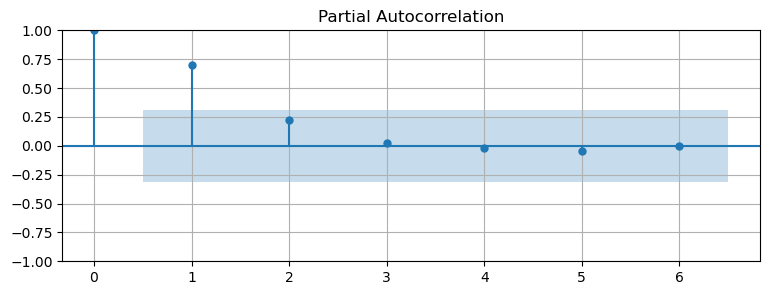

In [447]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,0.0138,0.002,5.873,0.000,0.009,0.018
ar.L1,1.5831,0.243,6.524,0.000,1.107,2.059
ar.L2,-0.7483,0.216,-3.470,0.001,-1.171,-0.326
ma.L1,-1.1676,0.239,-4.886,0.000,-1.636,-0.699
ma.L2,0.4282,0.231,1.852,0.064,-0.025,0.881
ma.L3,0.2906,0.184,1.581,0.114,-0.070,0.651
sigma2,9.4059,2.188,4.299,0.000,5.118,13.694


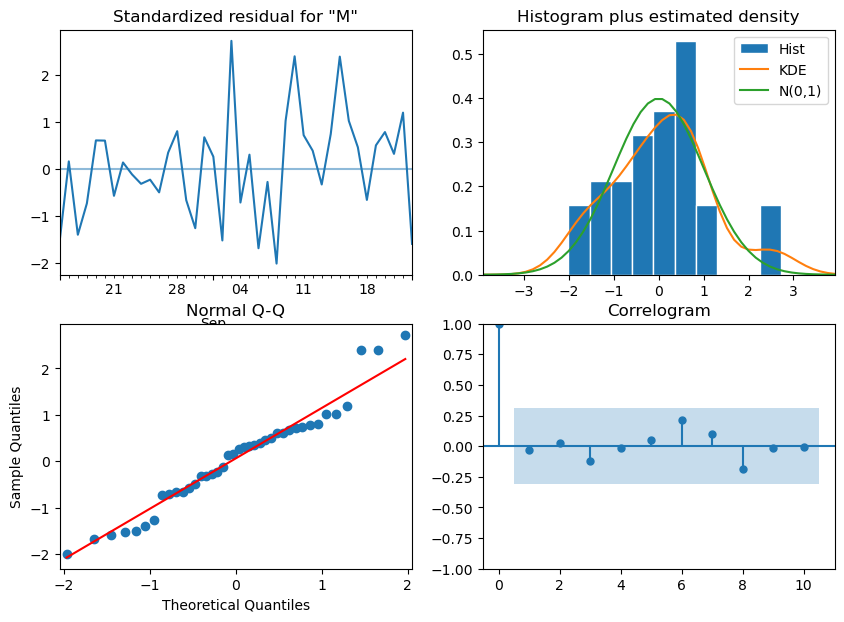

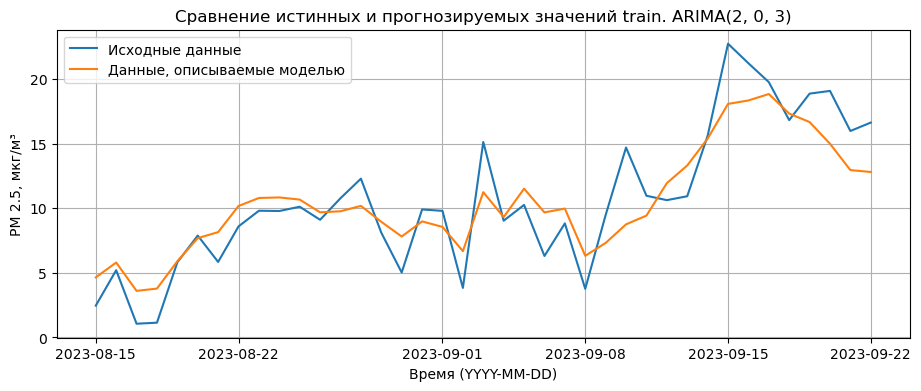

,Значение
MSE,5.53
MAE,1.93
MAPE,0.32
$R^2$,0.81


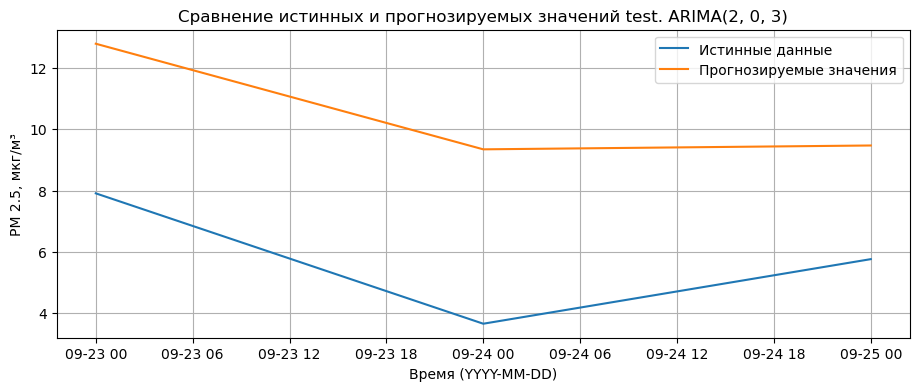

,Значение
MSE,23.38
MAE,4.77
MAPE,0.94
$R^2$,-6.73


In [454]:
forecast.getModel(p = 2, d = 0, q = 3, exog_features = [  'Pressure'], use_optimal = False, save = False)

### 6

In [455]:
period = [f'2023-10-{i}' for i in range(23, 26)]
period

['2023-10-23', '2023-10-24', '2023-10-25']

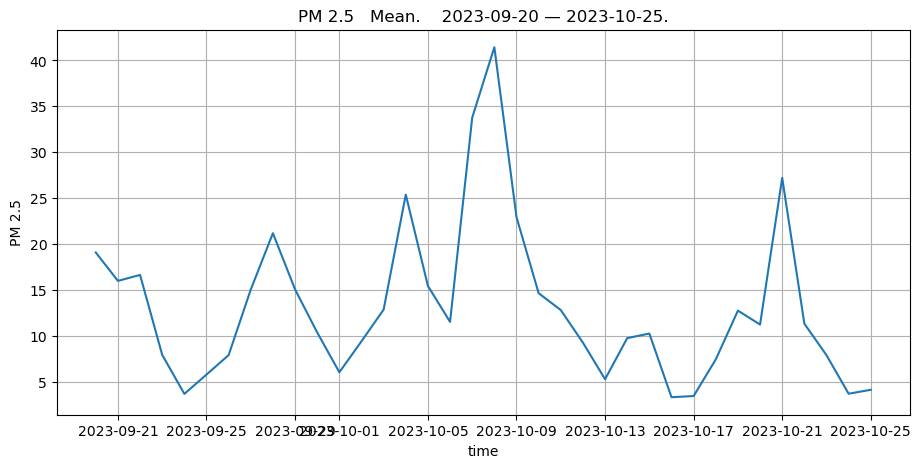

In [456]:
# Срез данных от begin до end, start - начало прогнозирования
begin, start, end = "2023-09-20", period[0], period[-1]


PlotSerie(df[begin : end], f'PM 2.5   {district}.    {begin} — {end}.')

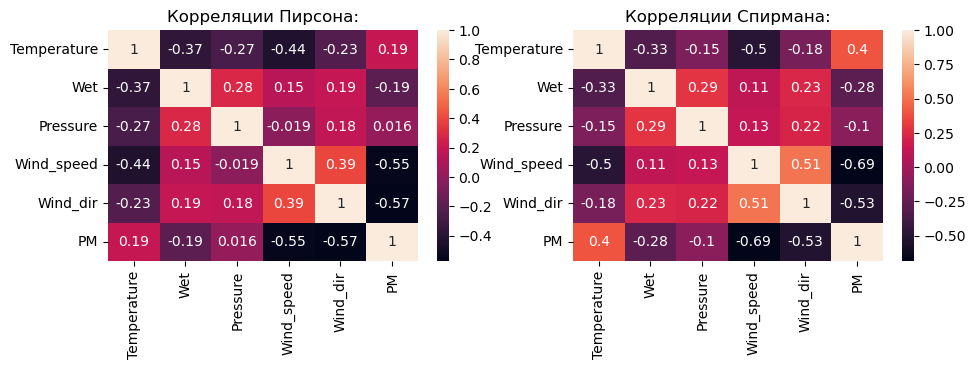

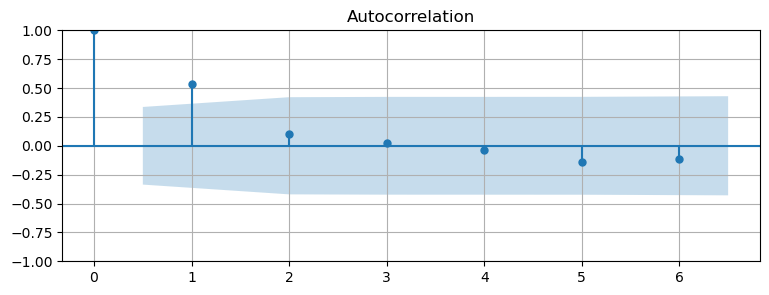

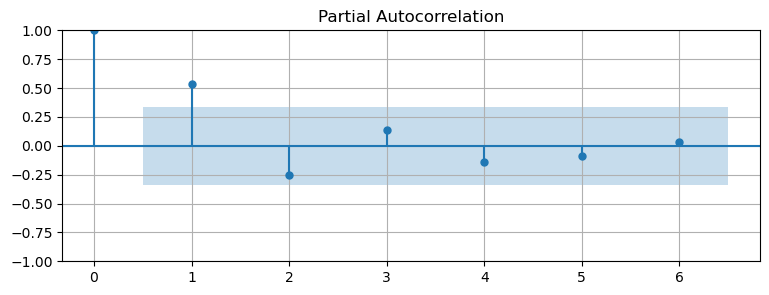

In [457]:
forecast = Forecaster(sensor, district, begin, start, end, fill = fill, lags = 6)

,coef,std err,z,P>|z|,[0.025,0.975]
x1,-0.4338,0.119,-3.659,0.000,-0.666,-0.201
ar.L1,1.1519,0.265,4.349,0.000,0.633,1.671
ar.L2,-0.1519,0.264,-0.574,0.566,-0.670,0.367
ma.L1,-0.3630,1.521,-0.239,0.811,-3.344,2.618
ma.L2,-0.6239,0.965,-0.646,0.518,-2.516,1.268
sigma2,32.5842,45.626,0.714,0.475,-56.841,122.009


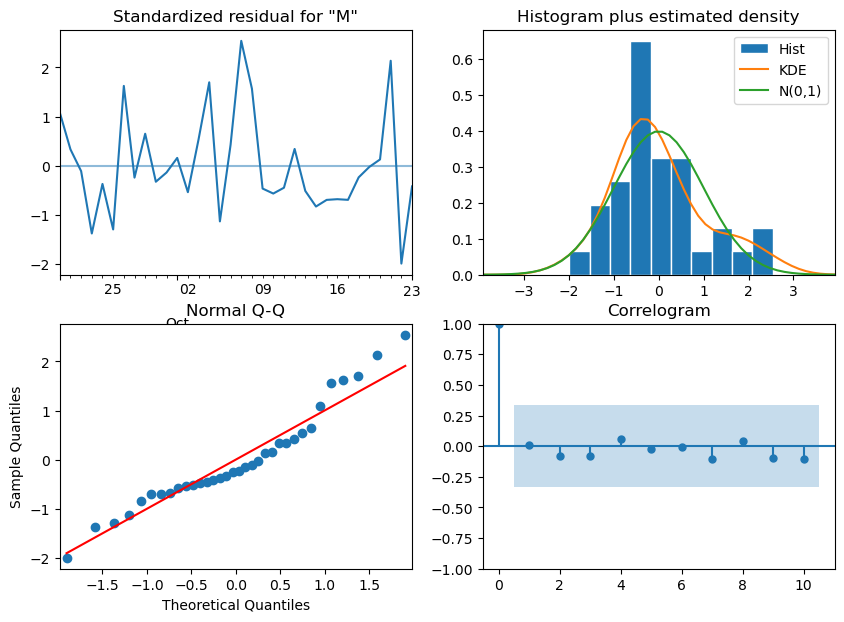

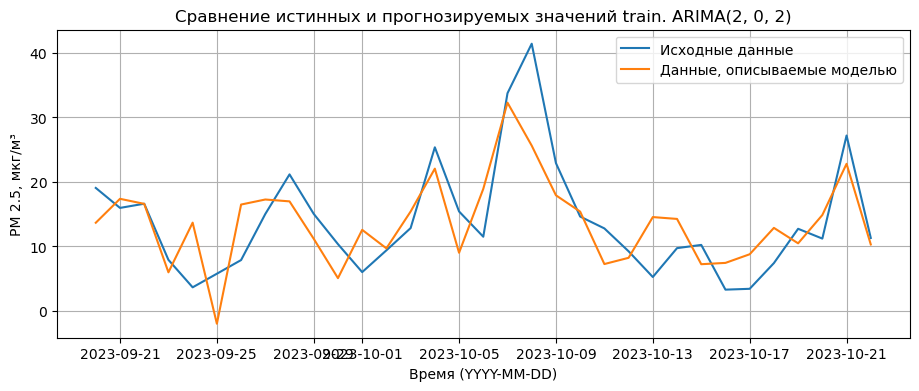

,Значение
MSE,31.26
MAE,4.55
MAPE,0.53
$R^2$,0.57


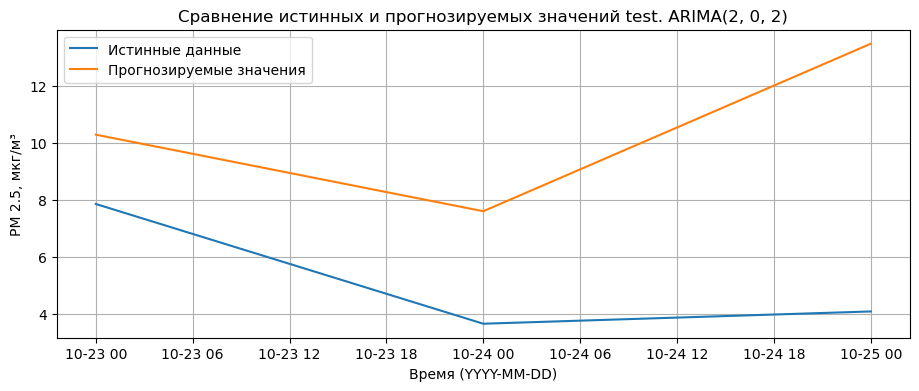

,Значение
MSE,36.55
MAE,5.26
MAPE,1.22
$R^2$,-9.27


In [463]:
forecast.getModel(p = 2, d = 0, q = 2, exog_features = [   'Wind_dir'], use_optimal = False, save = False)